In [1]:
import jax
import joblib
import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm.auto import tqdm
from itertools import product
from toolz import pluck, valmap, keyfilter
from aging.behavior.bio_age_model import fit_model, masked_xval, model_setup, neg_log_likelihood, model_fun_v1
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from sklearn.preprocessing import OneHotEncoder

In [2]:
format_plots()

In [3]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()

# Load data

In [4]:
df = pd.read_parquet(
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)

n_syllables = 70
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
size_df = pd.read_parquet(pth)

size_df["size_demeaned"] = size_df.groupby('age')['quant_0.5'].transform(demean)
size_df["size_zscore"] = size_df.groupby('age')['quant_0.5'].transform(zscore)
sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.loc[df.index]
demeaned_sizes_col = size_df.loc[df.index, "size_demeaned"]
zscore_sizes_col = size_df.loc[df.index, "size_zscore"]

In [5]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": zscore_sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 120,
    "age_sd": 26,  # weeks
    "bio_params_sd": 0.3,
    "size_params_sd": 0.3,
    "n_age_samples": 1000,
    "n_splines": 5,
    "n_size_splines": 5,
    "n_syllables": n_syllables,
    "n_keep_sylls": 30,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 100,
}

## Fit mdl v1 without size

In [6]:
mask = np.ones(len(syllable_counts_jax), dtype=bool)
mask[[30, 75, 180]] = 0
features = {
    "ages": age[mask],
    "counts": syllable_counts_jax[mask] + 1,
    "sizes": zscore_sizes_col.to_numpy()[mask],
}
heldout_features = {
    "ages": age[~mask],
    "counts": syllable_counts_jax[~mask] + 1,
    "sizes": zscore_sizes_col.to_numpy()[~mask],
}

In [7]:
hypparams['n_splines'] = 5
fit_data = fit_model(features, hypparams, 1)

In [8]:
components = fit_data['init_components']
lls = model_fun_v1(fit_data['params'], components.bases, components.age_samples, components.age_normalizer(heldout_features['ages']), heldout_features["counts"], hypparams)

In [9]:
jax.scipy.special.logsumexp(lls, axis=1)

Array([-304.98975, -270.789  , -289.68216], dtype=float32)

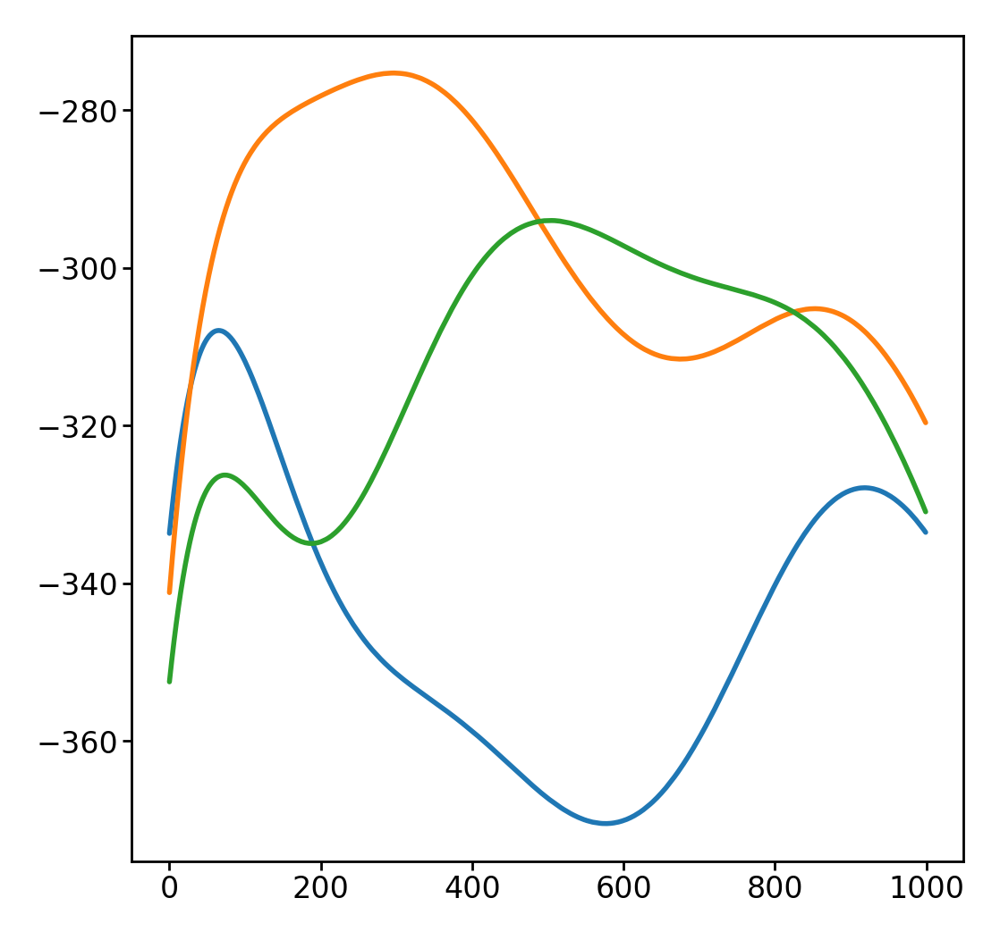

In [38]:
plt.plot(lls.T)

In [10]:
hypparams['n_splines'] = 9

fit_data = fit_model(features, hypparams, 1)

In [11]:
components = fit_data["init_components"]
lls_2 = model_fun_v1(
    fit_data["params"],
    components.bases,
    components.age_samples,
    components.age_normalizer(heldout_features["ages"]),
    heldout_features["counts"],
    hypparams,
)

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.


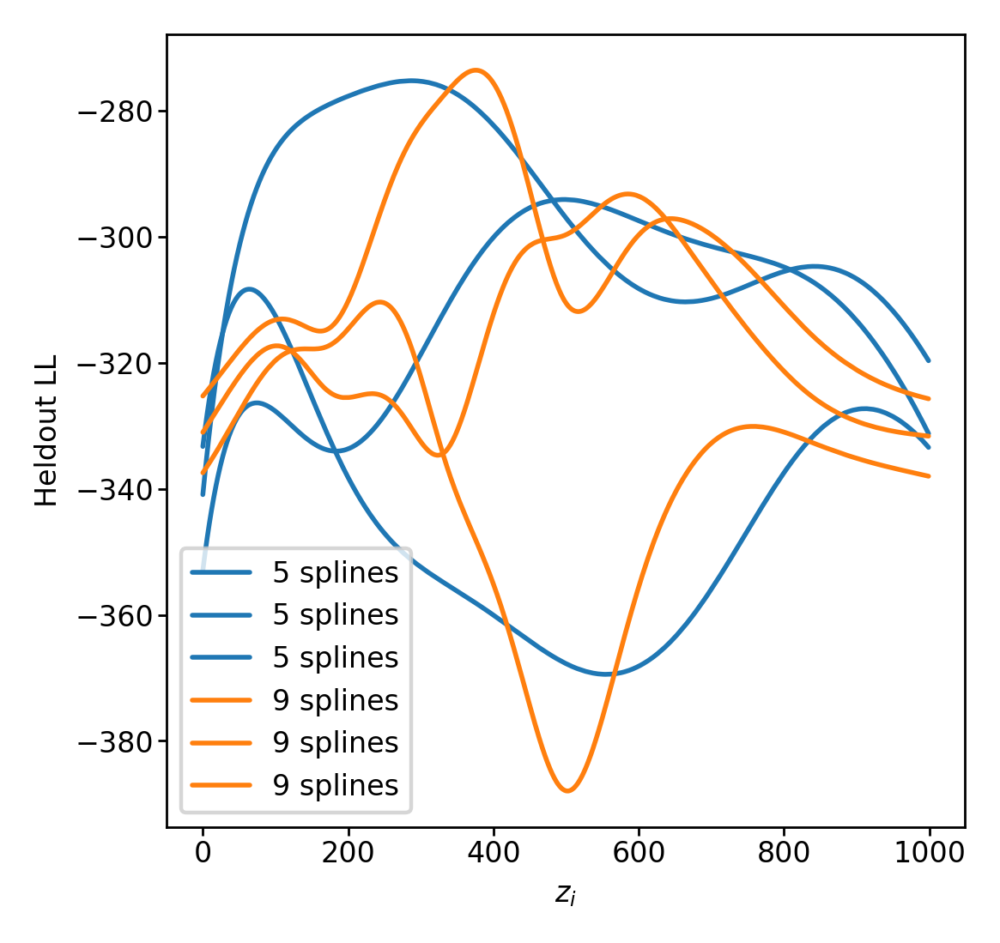

In [12]:
plt.plot(lls.T, c='C0', label="5 splines")
plt.plot(lls_2.T, c='C1', label="9 splines")
plt.ylabel("Heldout LL")
plt.xlabel("$z_i$")
plt.legend()

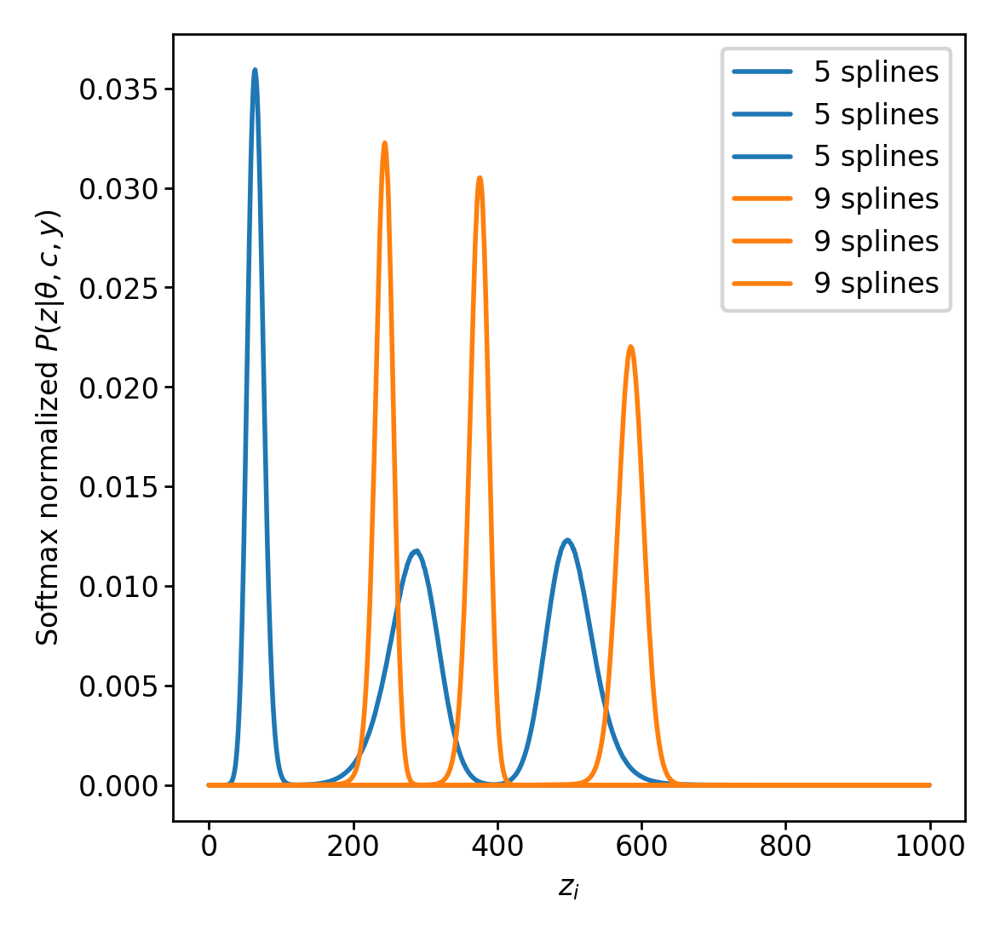

In [13]:
plt.plot(jax.nn.softmax(lls, axis=1).T, c='C0', label="5 splines")
plt.plot(jax.nn.softmax(lls_2, axis=1).T, c='C1', label="9 splines")
plt.ylabel(r"Softmax normalized $P(z | \theta , c, y)$")
plt.xlabel("$z_i$")
plt.legend()

/tmp/ipykernel_22221/39096200.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(xticklabels=["5 splines", "9 splines"], ylabel="Heldout LL")


[[Text(0, 0, '5 splines'), Text(1, 0, '9 splines')],
 Text(0, 0.5, 'Heldout LL')]

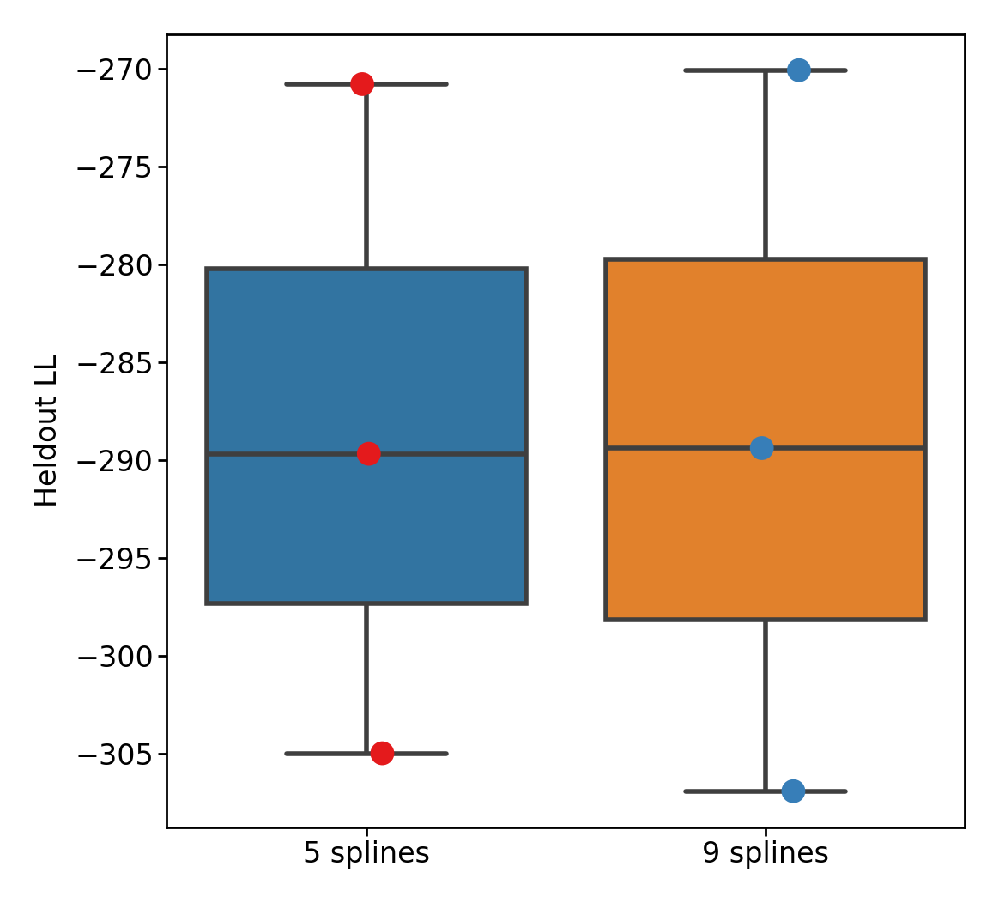

In [20]:
to_plt = [
    jax.scipy.special.logsumexp(lls, axis=1),
    jax.scipy.special.logsumexp(lls_2, axis=1),
]
ax = sns.boxplot(data=to_plt)
ax = sns.stripplot(data=to_plt, ax=ax, palette='Set1')
ax.set(xticklabels=["5 splines", "9 splines"], ylabel="Heldout LL")

In [18]:
model_fun_v1??

Signature: model_fun_v1(params, bases, age_samples, true_age, counts, hypparams)
Docstring: <no docstring>
Source:   
def model_fun_v1(params, bases, age_samples, true_age, counts, hypparams):
    # concentrations = (
    #     jnp.exp(params["bio_basis_weights"]) @ bases["bio"]
    # )  # shape (n_syllables, n_ages)
    concentrations = (
        jnp.exp(params["bio_basis_weights"] @ bases["bio"])
        # params["bio_basis_weights"] @ bases["bio"]
    )  # shape (n_syllables, n_ages)

    concentrations = jnp.tile(concentrations.T[None], (len(counts), 1, 1))
    # shape (n_sessions, n_ages, n_syllables)

    log_probs = compute_distribution_logprobs(
        counts, concentrations, true_age, age_samples, hypparams
    )

    return log_probs
File:      /n/groups/datta/win/longtogeny/code/aging/behavior/bio_age_model.py
Type:      function

<Axes: xlabel='True age', ylabel='Bio age'>

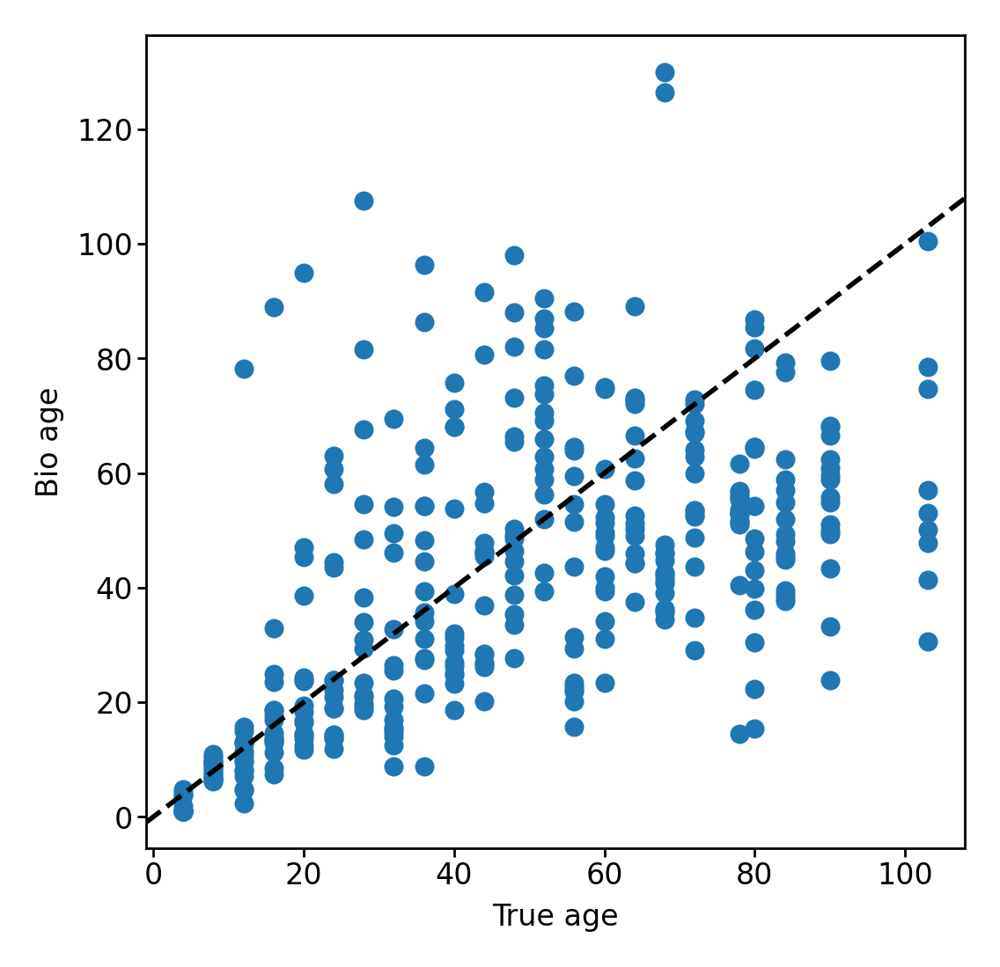

In [11]:
plt.scatter(fit_data['true_ages'], fit_data['bio_ages'], s=10)
plt.xlabel("True age")
plt.ylabel("Bio age")
add_identity(plt.gca(), c='k', ls='--')

## Fit with size

In [8]:
fit_data = fit_model(features, hypparams, 2)

<Axes: xlabel='True age', ylabel='Bio age'>

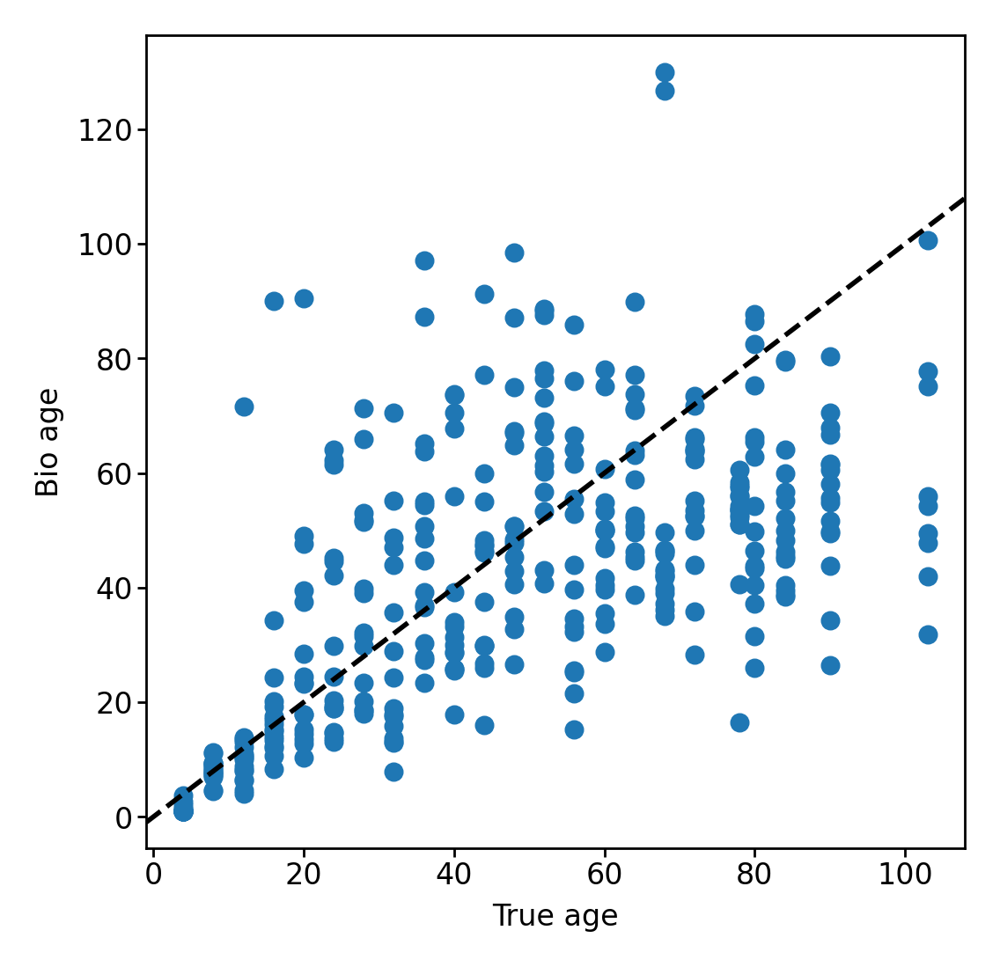

In [9]:
plt.scatter(fit_data['true_ages'], fit_data['bio_ages'], s=10)
plt.xlabel("True age")
plt.ylabel("Bio age")
add_identity(plt.gca(), c='k', ls='--')

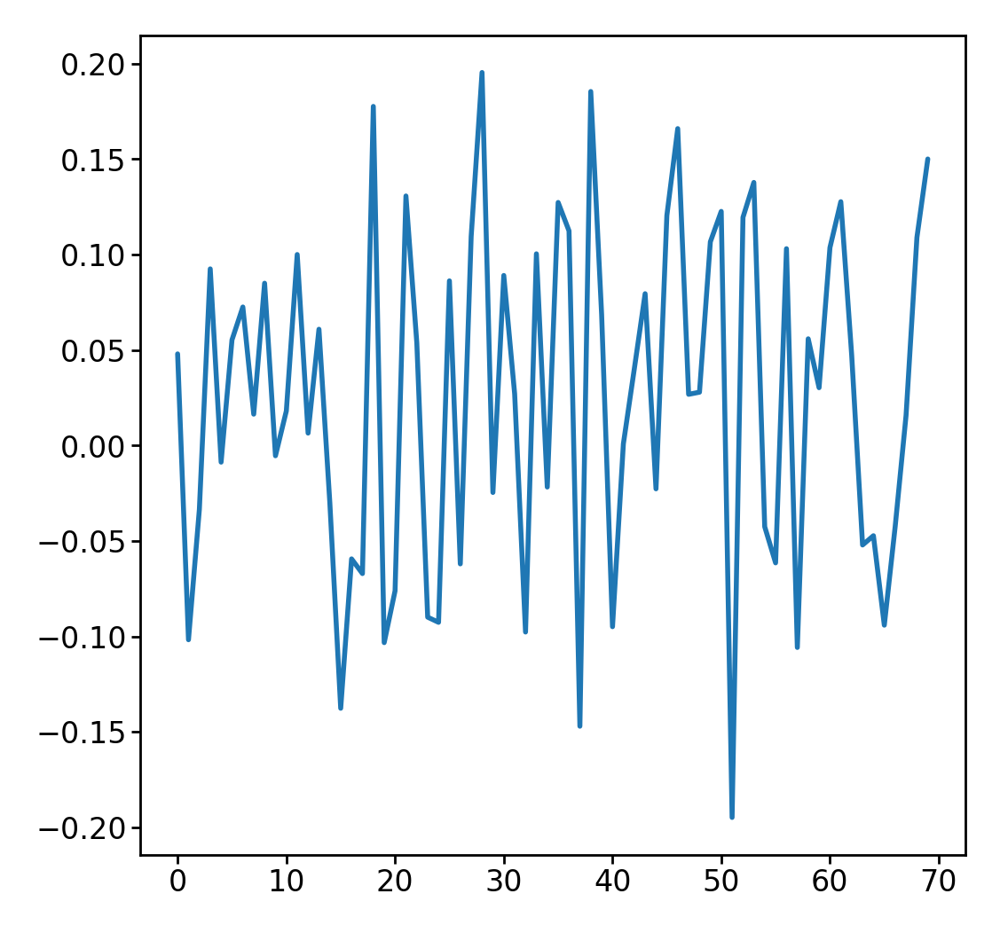

In [10]:
plt.plot(fit_data['params']['size_slope'].flatten())

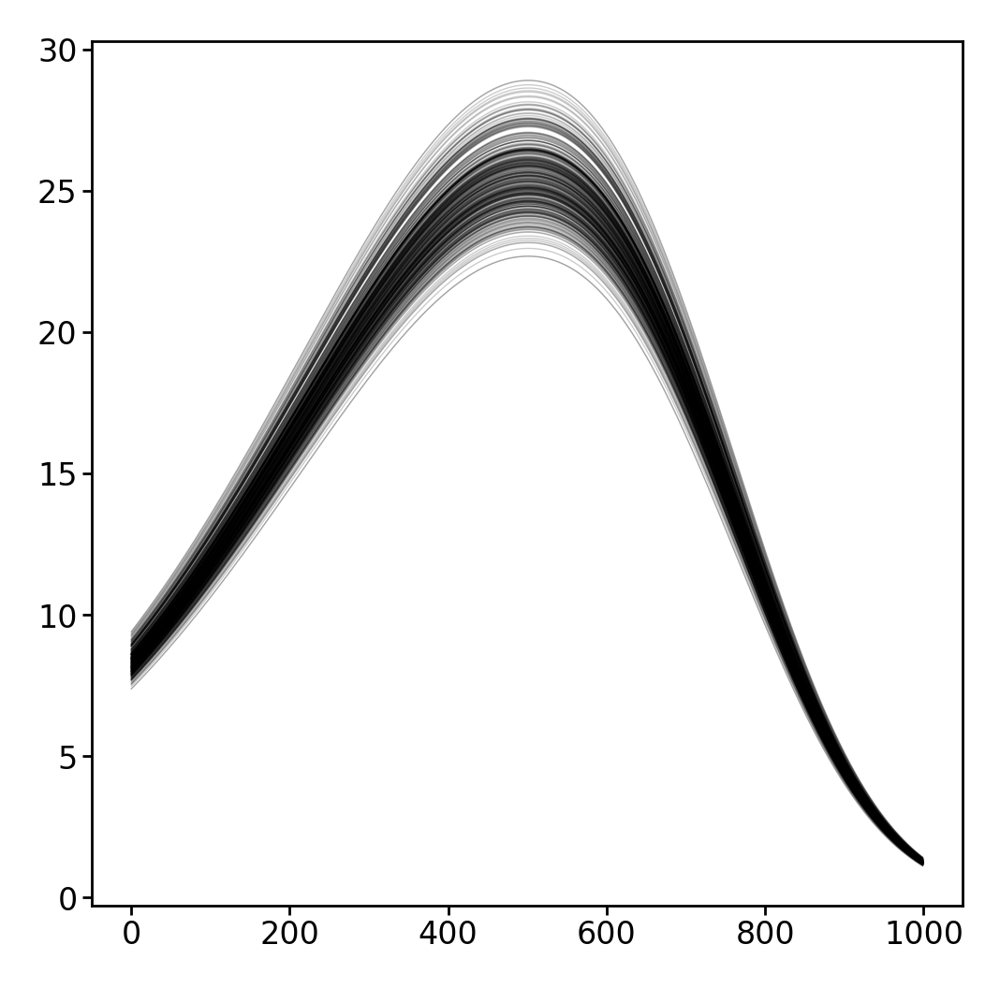

In [11]:
for c in fit_data['concentrations']:
    plt.plot(c[:, 0], lw=0.25, c='k', alpha=0.2)

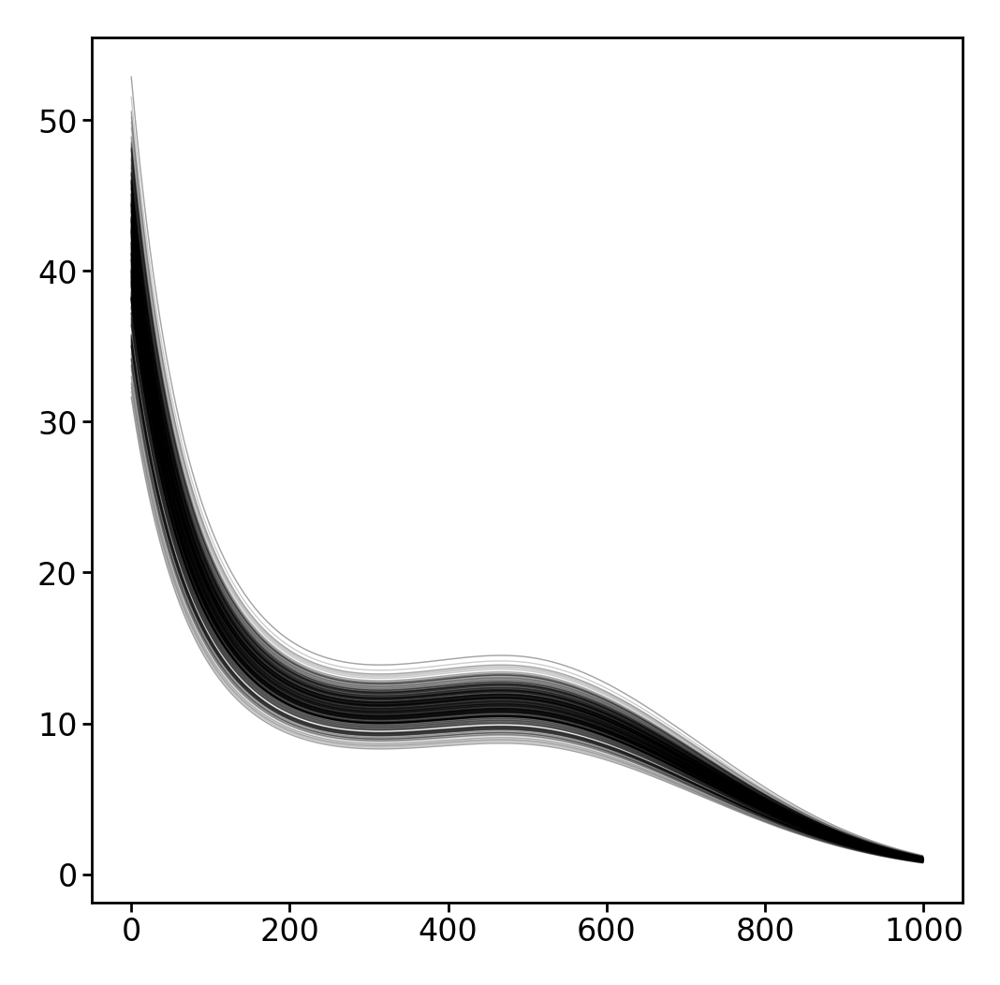

In [12]:
for c in fit_data['concentrations']:
    plt.plot(c[:, 1], lw=0.25, c='k', alpha=0.2)

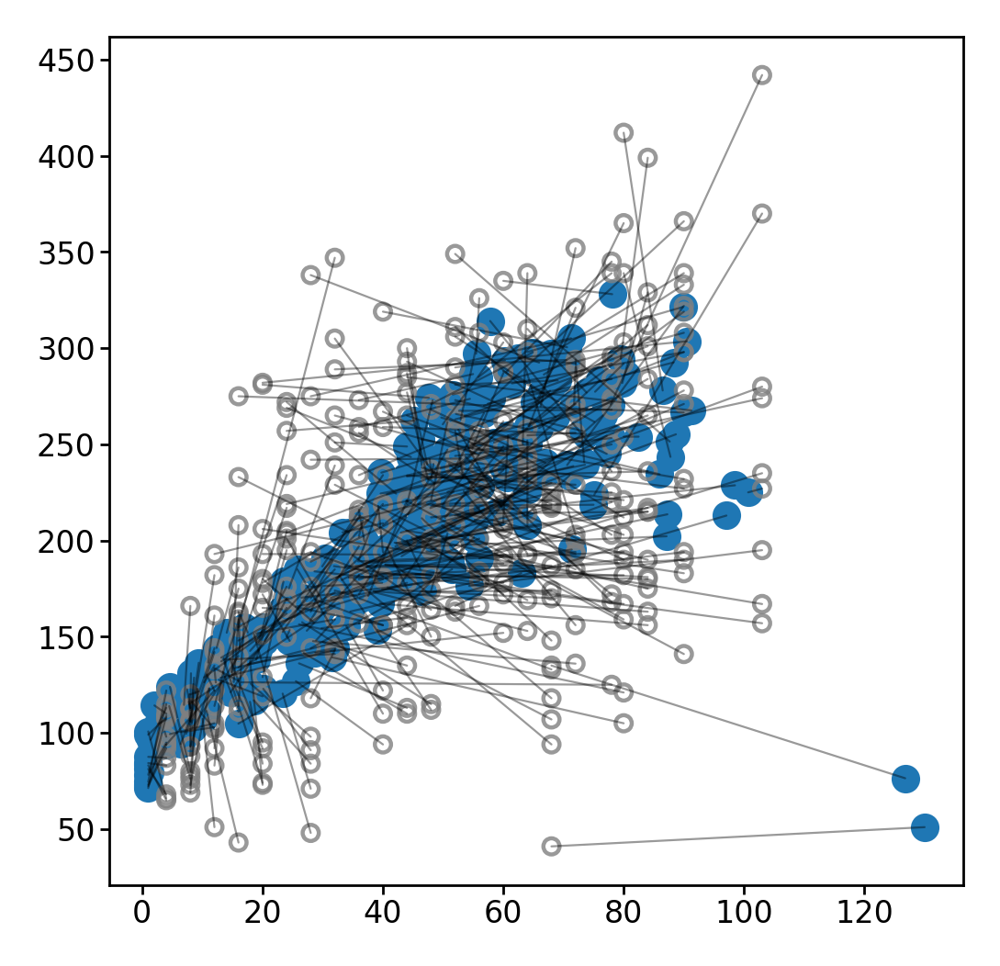

In [13]:
diffs = fit_data["bio_ages"] - fit_data["true_ages"]
diffs_y = fit_data["predicted_counts"] - fit_data["counts"]
plt.scatter(fit_data["bio_ages"], fit_data["predicted_counts"][:, 0])
plt.scatter(
    fit_data["true_ages"],
    fit_data["counts"][:, 0],
    edgecolors="gray",
    facecolors="none",
    s=10,
    alpha=0.8,
)
plt.plot(
    np.stack([fit_data["true_ages"], fit_data["bio_ages"]]),
    np.stack([fit_data["counts"][:, 0], fit_data["predicted_counts"][:, 0]]),
    color="k",
    lw=0.4,
    alpha=0.4,
);

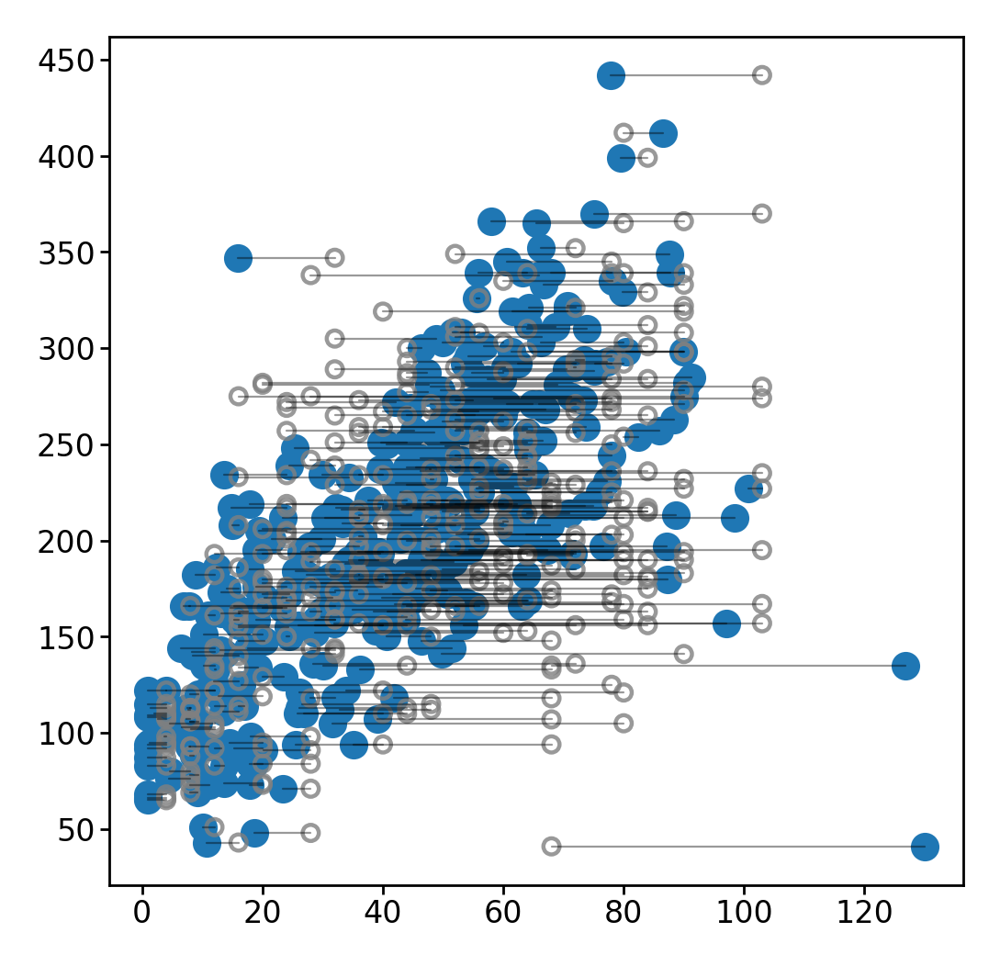

In [14]:
diffs = fit_data["bio_ages"] - fit_data["true_ages"]
diffs_y = fit_data["predicted_counts"] - fit_data["counts"]
plt.scatter(fit_data["bio_ages"], fit_data["counts"][:, 0])
plt.scatter(
    fit_data["true_ages"],
    fit_data["counts"][:, 0],
    edgecolors="gray",
    facecolors="none",
    s=10,
    alpha=0.8,
)
plt.plot(
    np.stack([fit_data["true_ages"], fit_data["bio_ages"]]),
    np.stack([fit_data["counts"][:, 0], fit_data["counts"][:, 0]]),
    color="k",
    lw=0.4,
    alpha=0.4,
);

### Masked cross-validation?

## Look at bio-age vs size in the interaction plots like before

In [6]:
fit_data = fit_model(features, hypparams, 1)

In [7]:
new_df = df.copy()
new_df['quant_0.5'] = size_df.loc[df.index, "quant_0.5"]
new_df['size_demeaned'] = size_df.loc[df.index, "size_demeaned"]
new_df['size_cut'] = pd.cut(new_df['quant_0.5'], bins=13, labels=False)
new_df['size_cut_demean'] = pd.cut(new_df['size_demeaned'], bins=13, labels=False)
new_df["bio_age"] = fit_data["bio_ages"]
new_df['age_cut'] = pd.cut(new_df.index.get_level_values('age'), bins=13, labels=False)
new_df['bio_age_cut'] = pd.cut(new_df["bio_age"], bins=13, labels=False)

In [ ]:
new_df

In [8]:
sizes = new_df.groupby('size_cut')['quant_0.5'].mean()
sizes2 = new_df.groupby('size_cut_demean')['size_demeaned'].mean()
ages = new_df.groupby('age_cut').apply(lambda x: x.index.get_level_values('age').to_numpy().mean())
bio_ages = new_df.groupby('bio_age_cut')["bio_age"].mean()

/tmp/ipykernel_27689/2984840766.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ages = new_df.groupby('age_cut').apply(lambda x: x.index.get_level_values('age').to_numpy().mean())


In [ ]:
sizes

In [ ]:
ages

In [ ]:
bio_ages

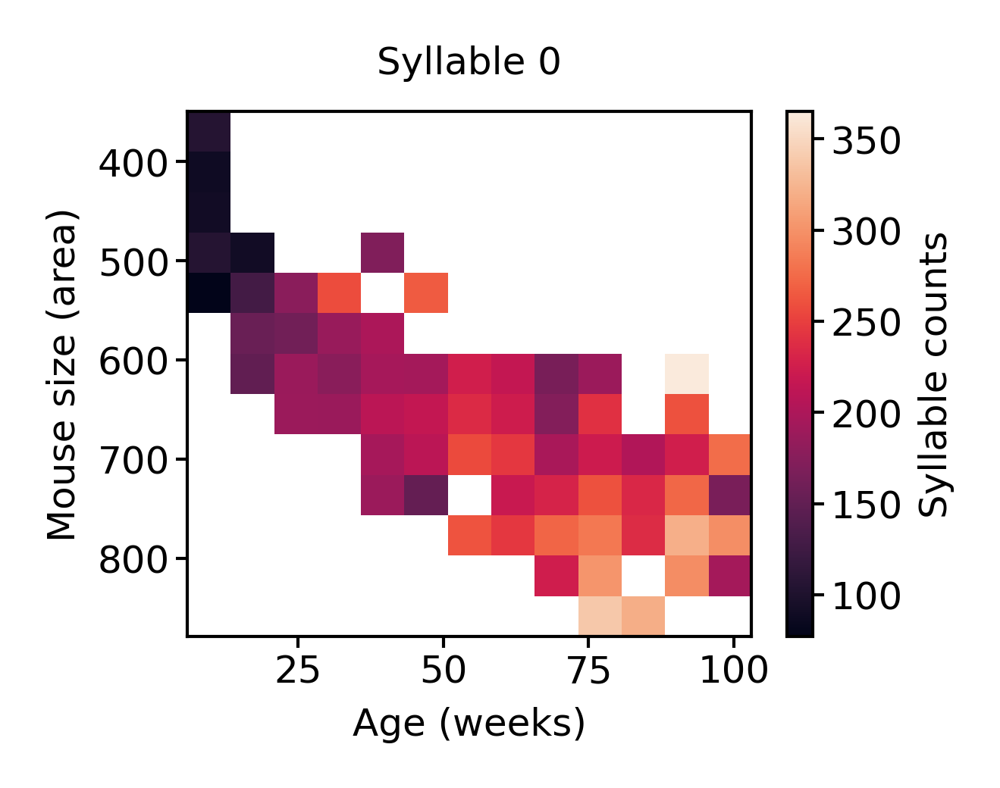

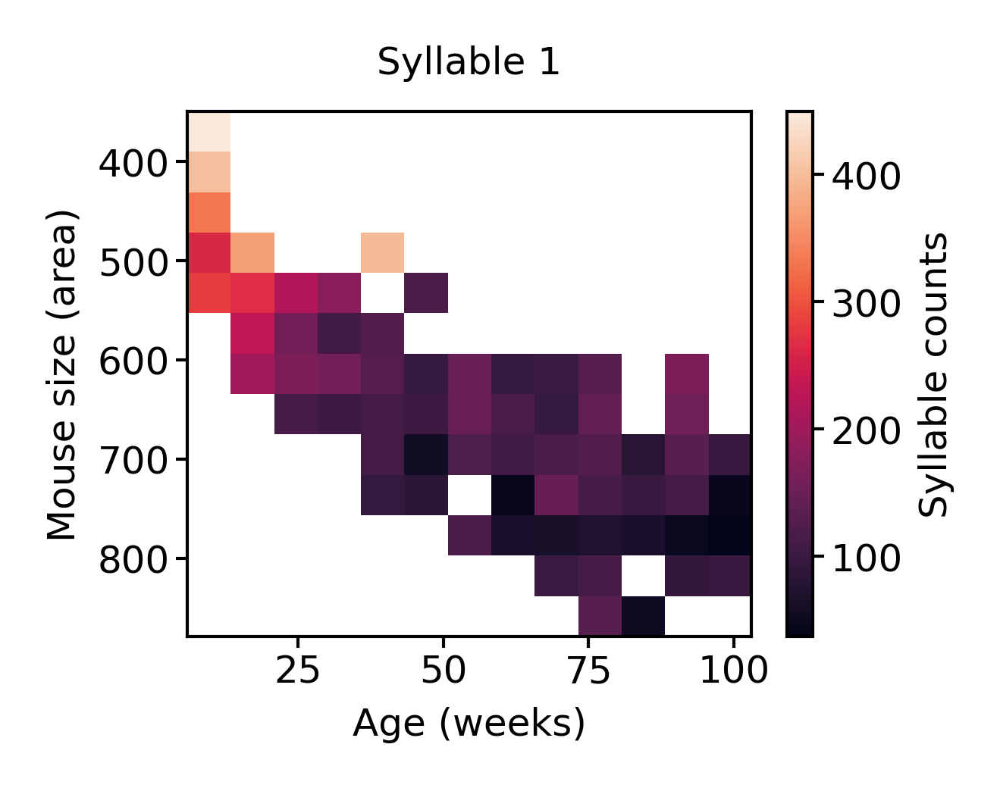

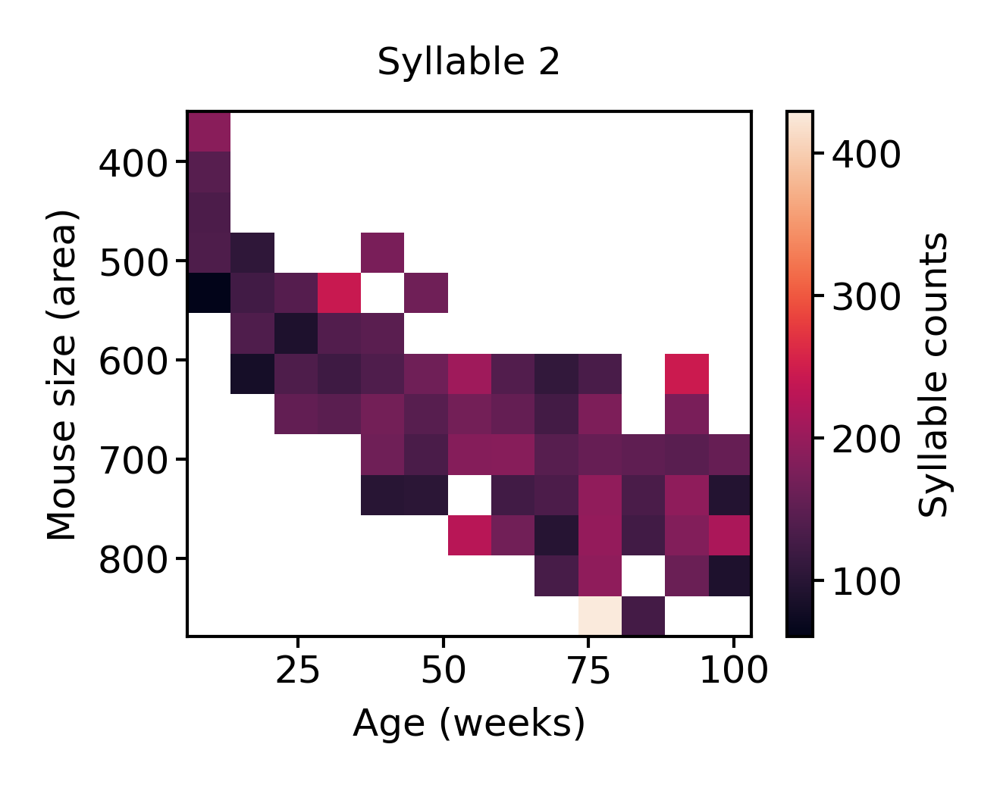

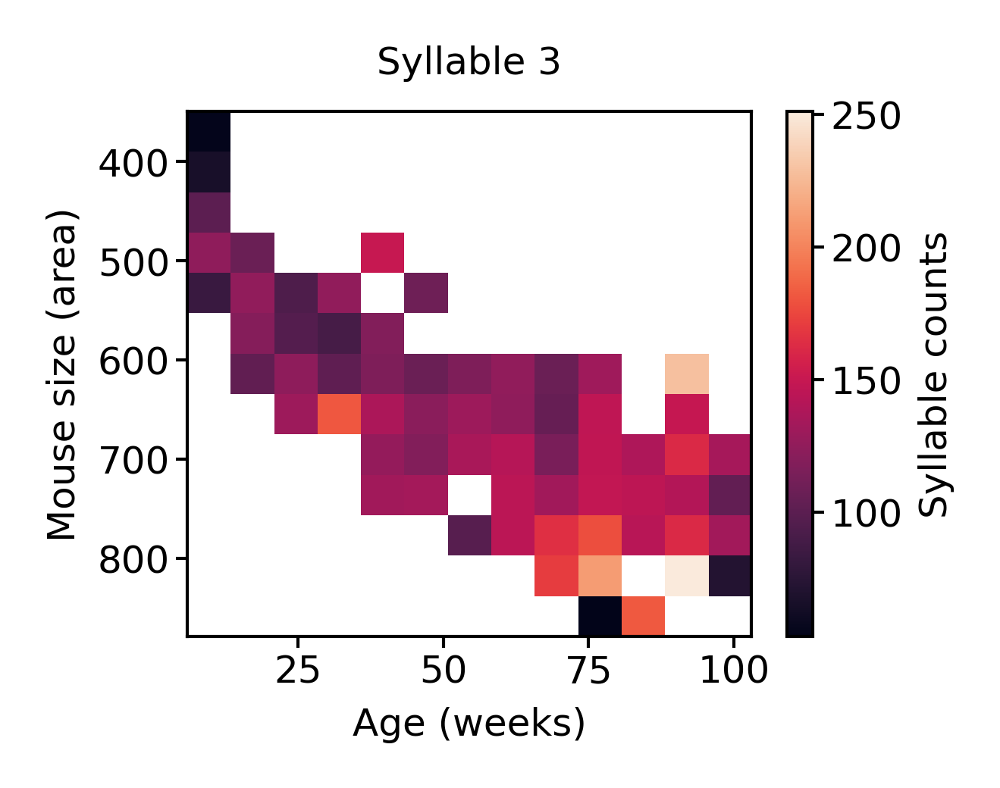

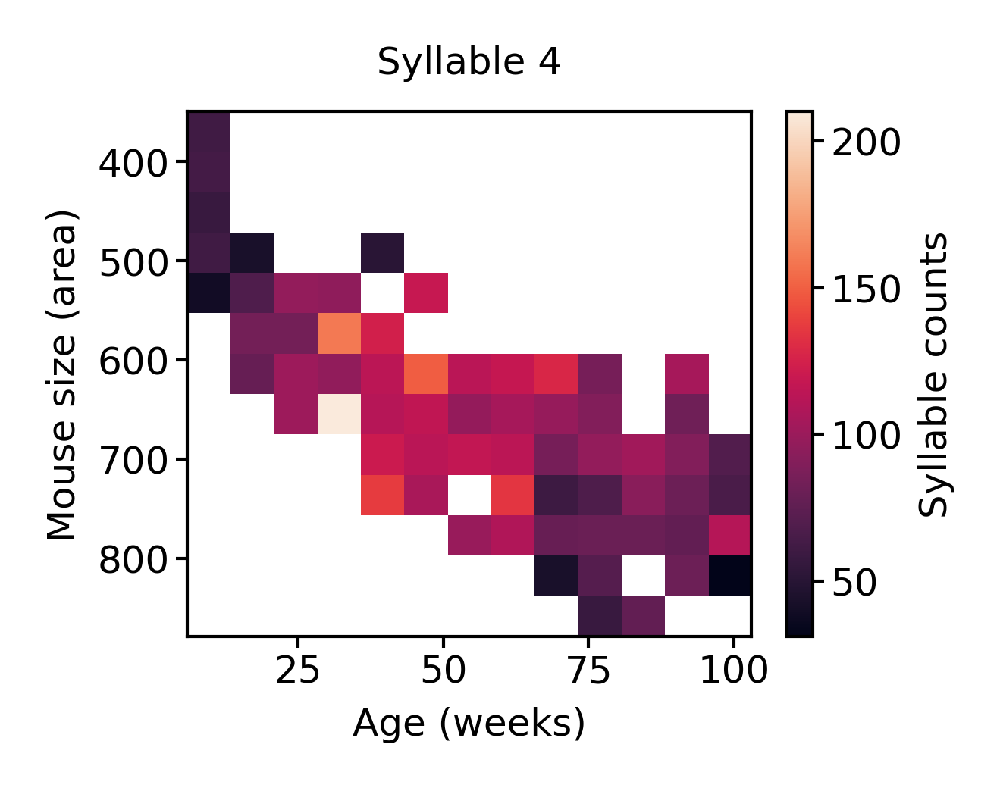

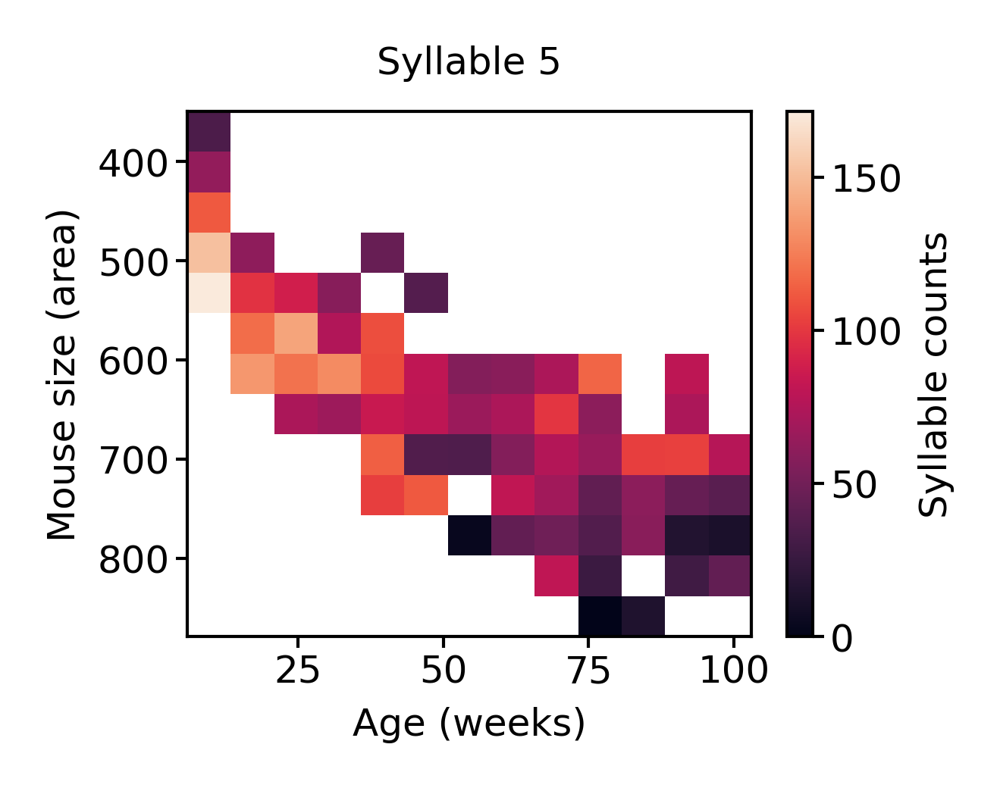

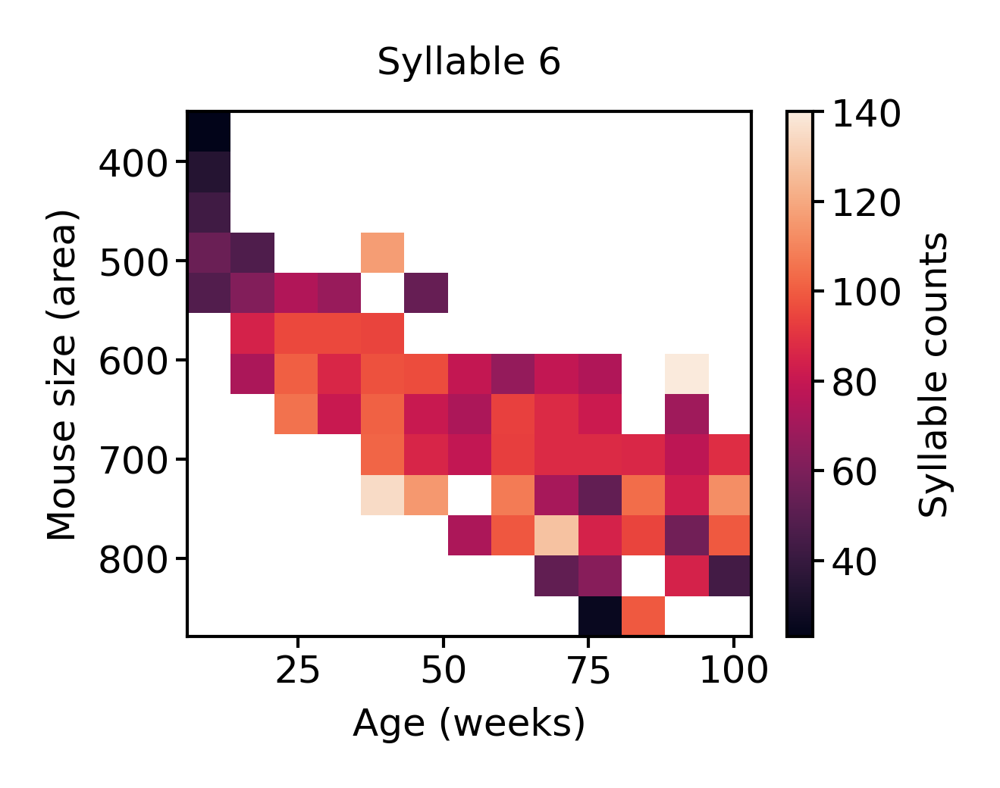

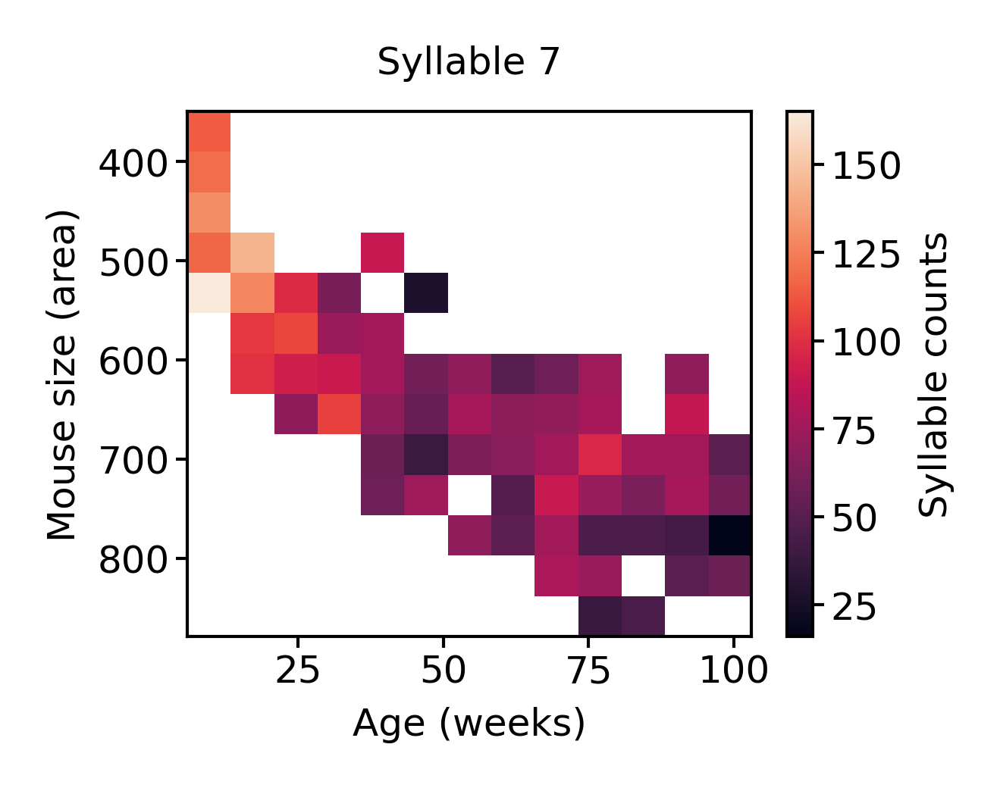

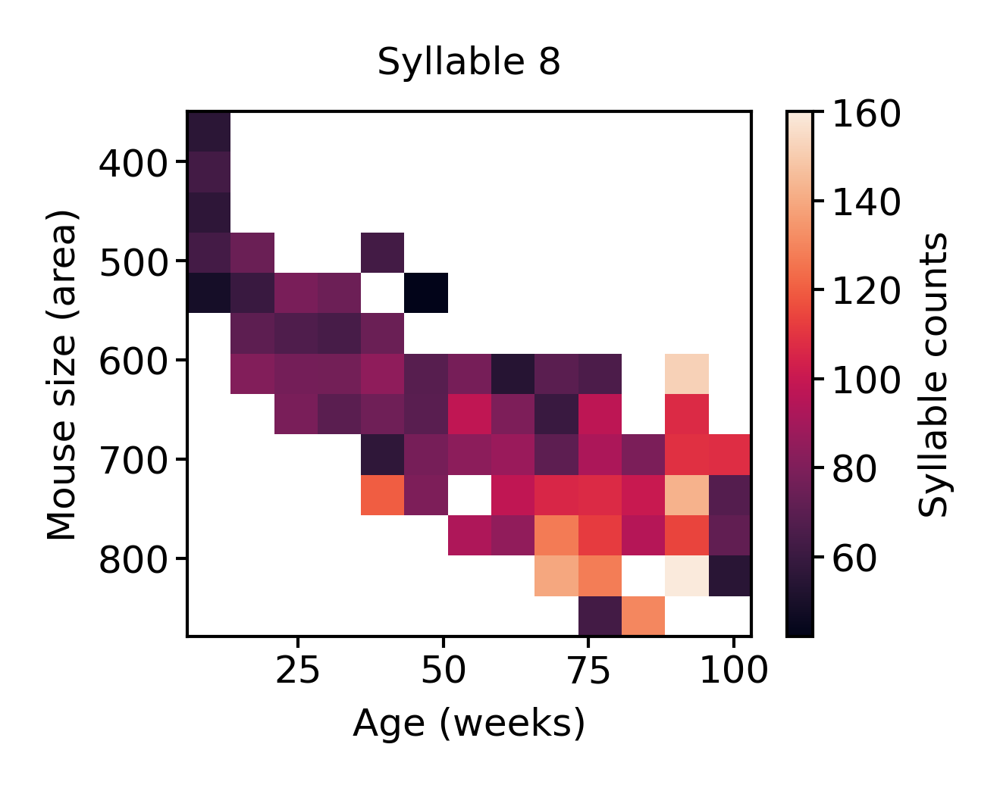

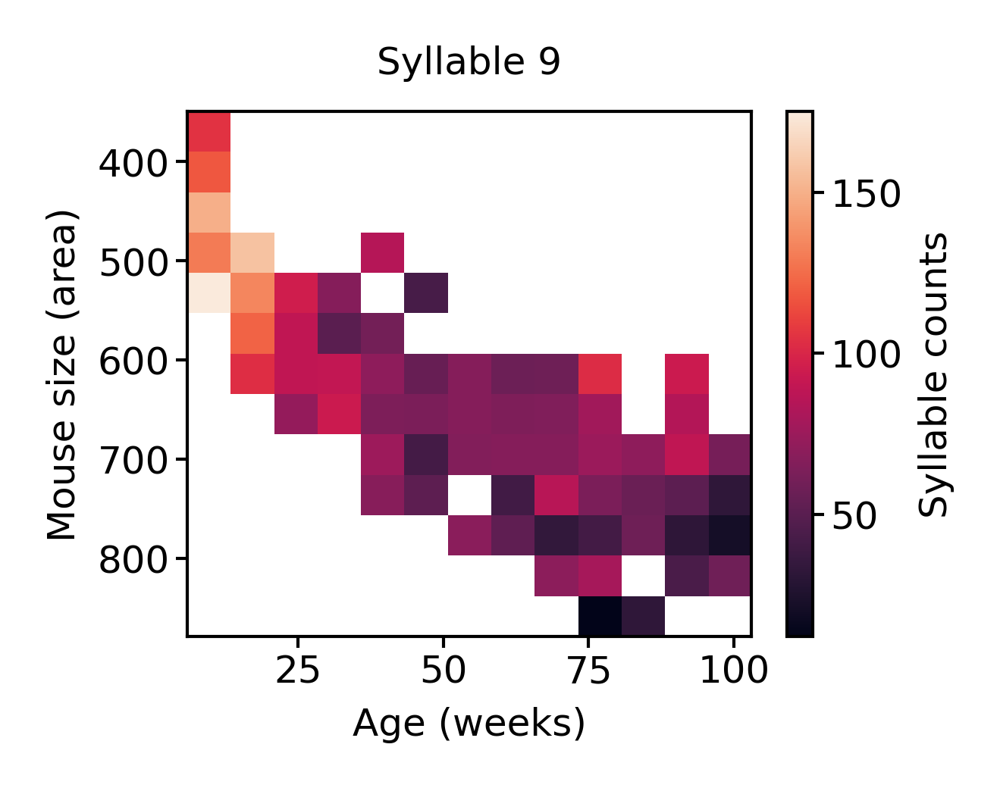

In [28]:
syllable = 0
for syllable in range(10):
    tmp = new_df.pivot_table(
        index="size_cut", columns="age_cut", values=syllable, aggfunc="mean", fill_value=np.nan
    ).astype(float)
    figure(2, 1.5)
    plt.imshow(tmp, extent=(ages.iloc[0], ages.iloc[-1], sizes.iloc[-1], sizes.iloc[0]), aspect='auto')
    plt.title(f"Syllable {syllable}")
    plt.xlabel("Age (weeks)")
    plt.ylabel("Mouse size (area)")
    plt.colorbar(label="Syllable counts")
    plt.show()

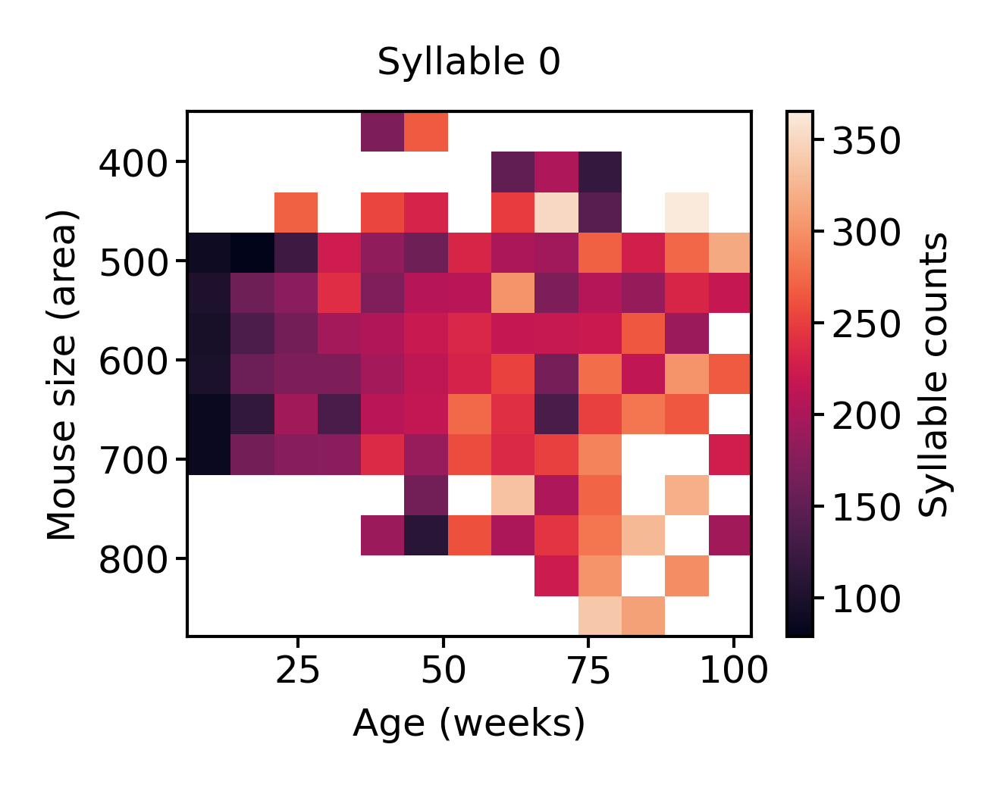

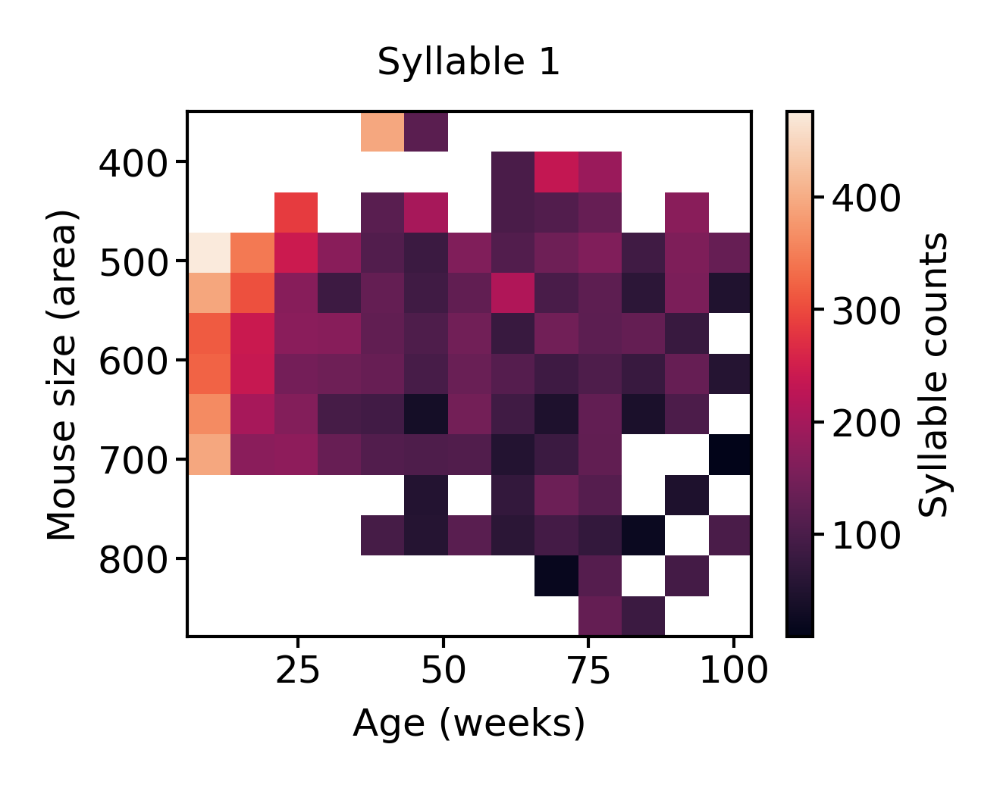

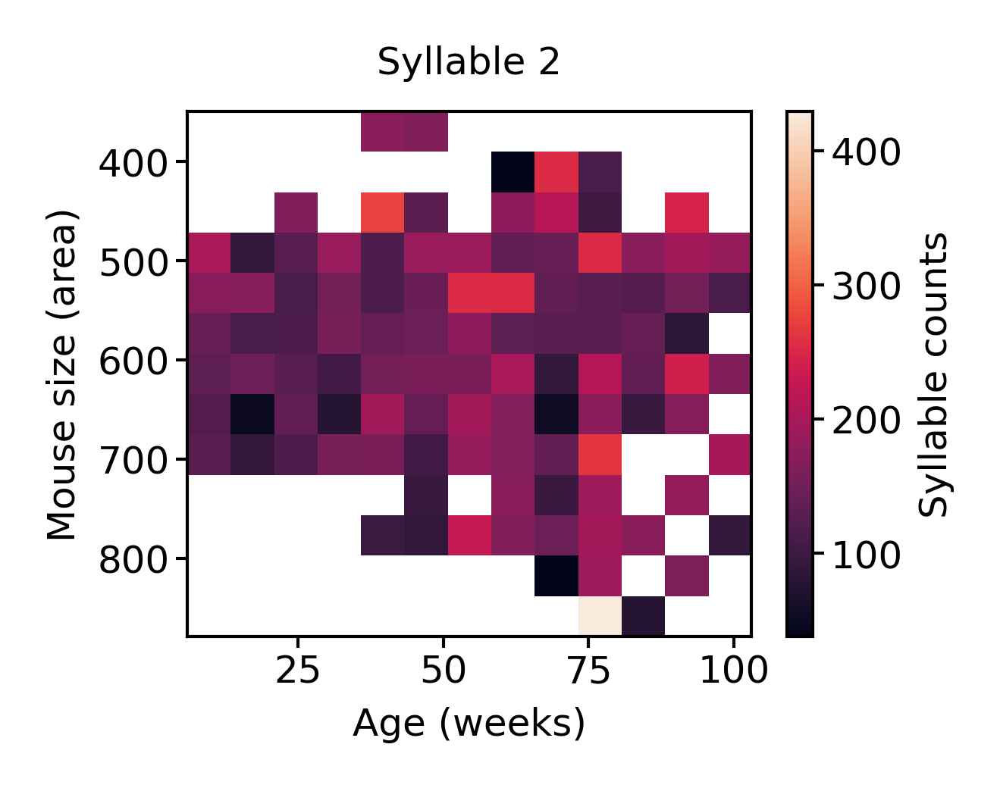

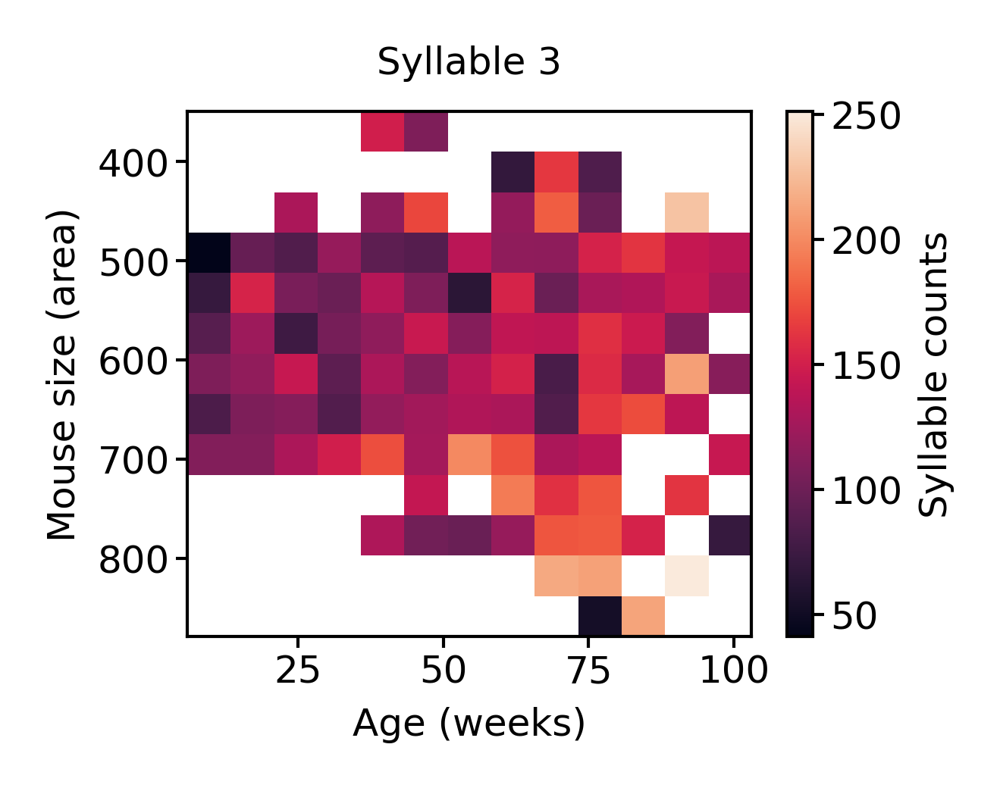

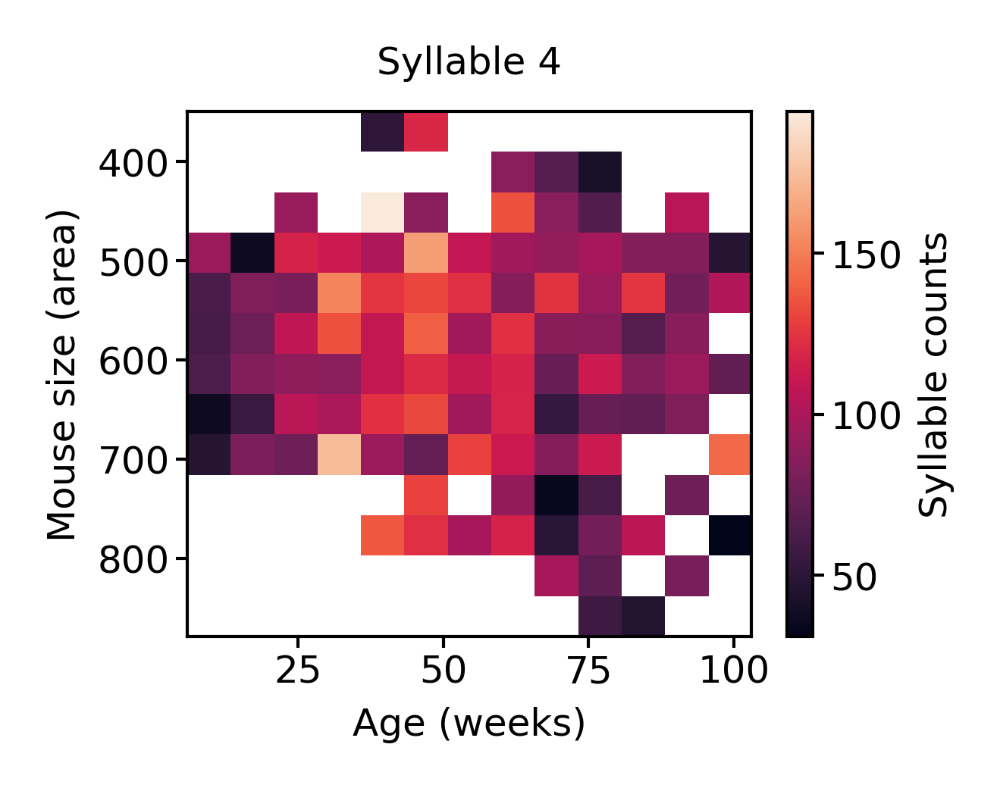

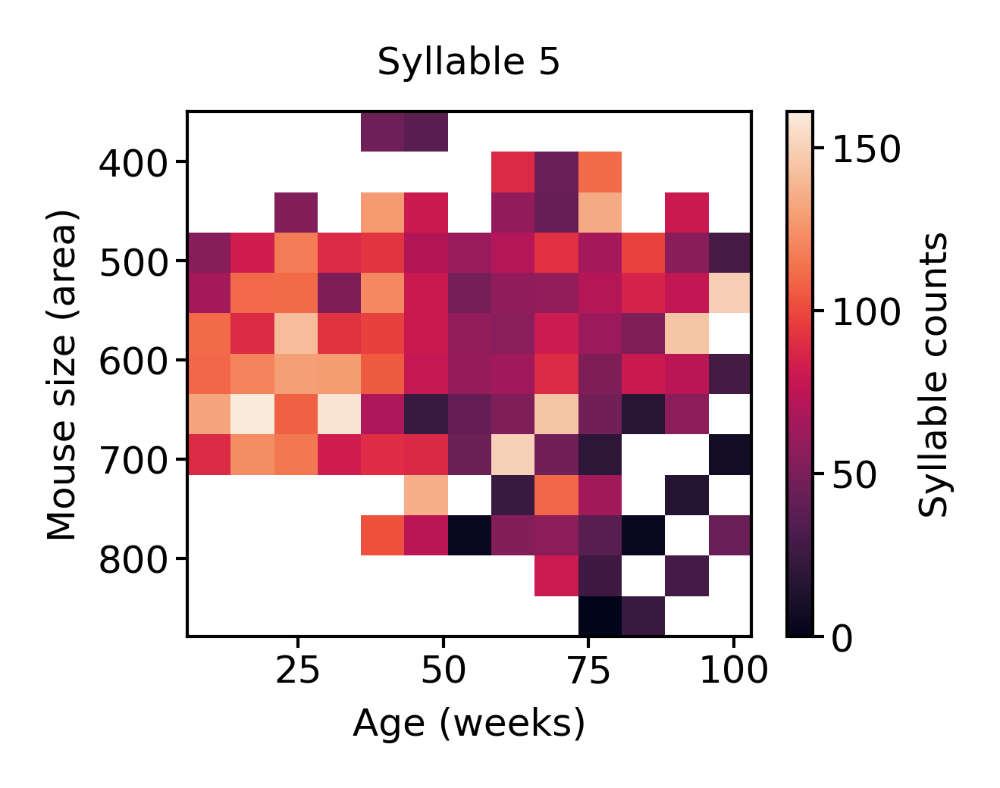

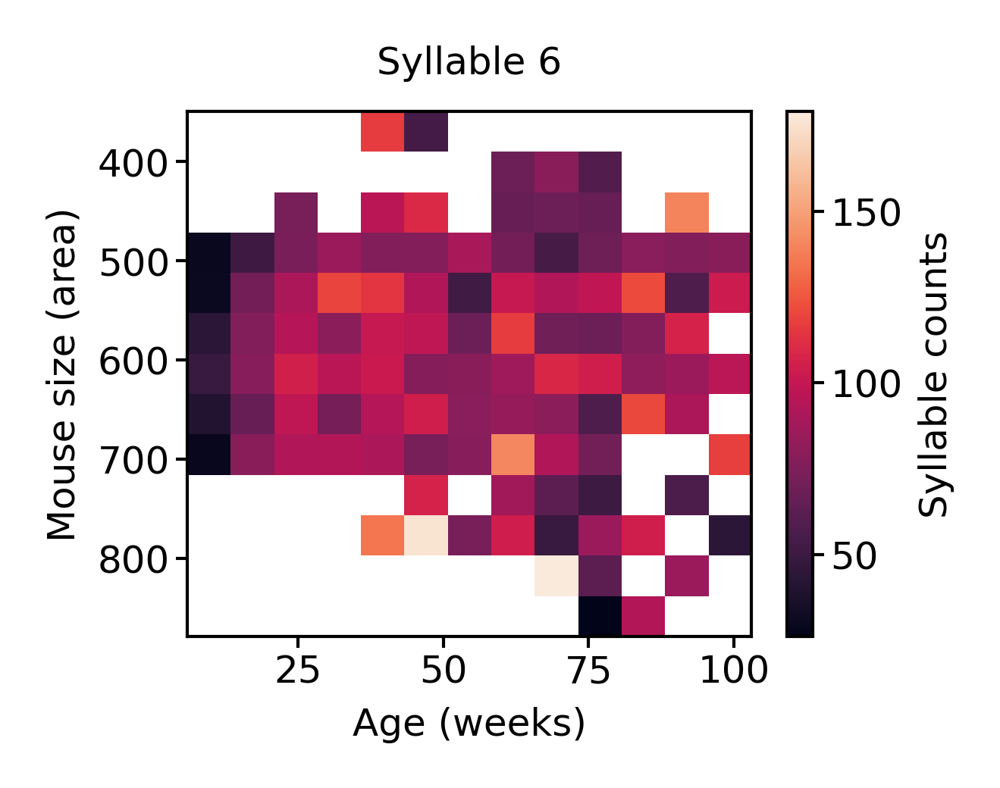

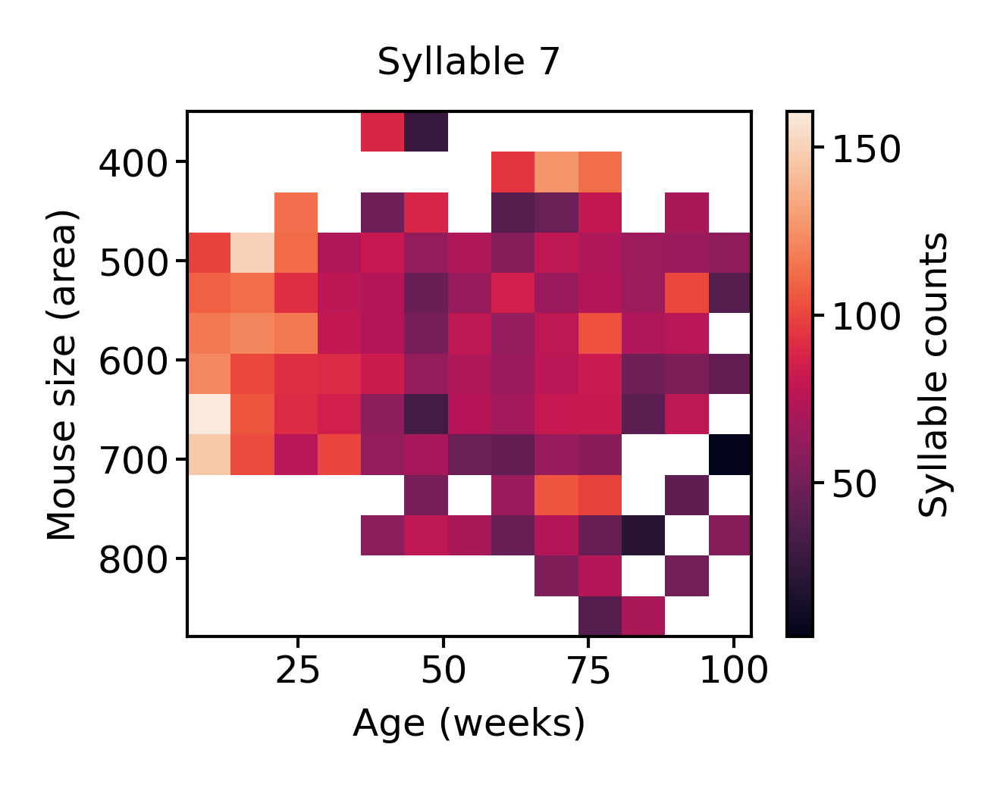

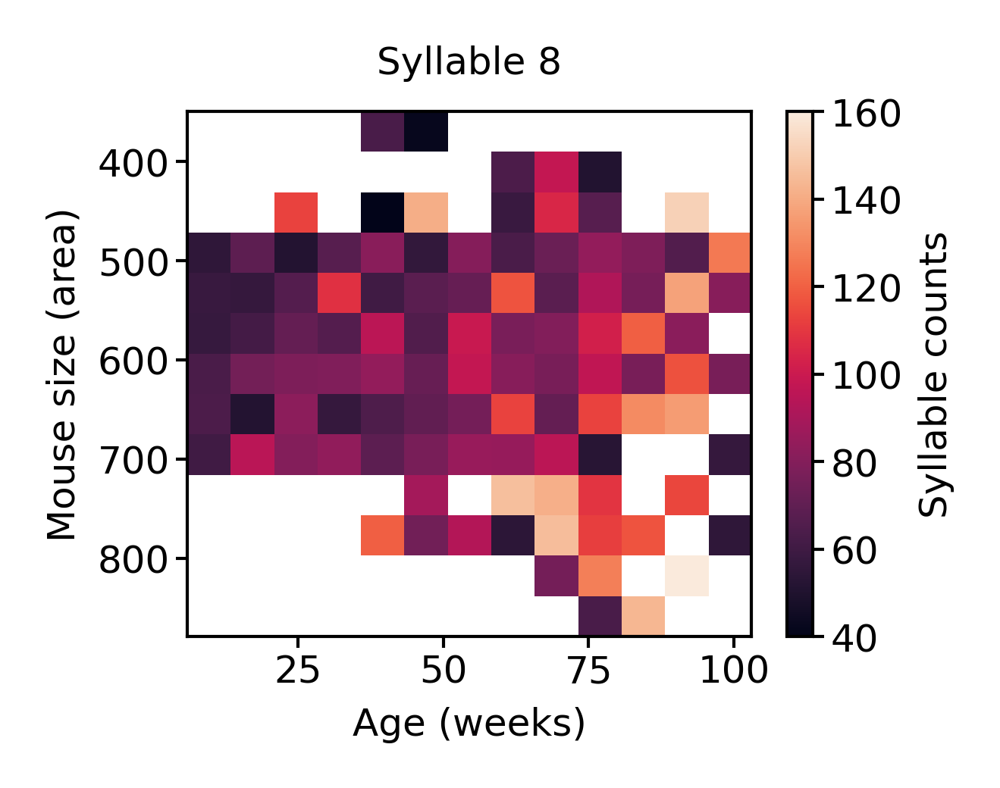

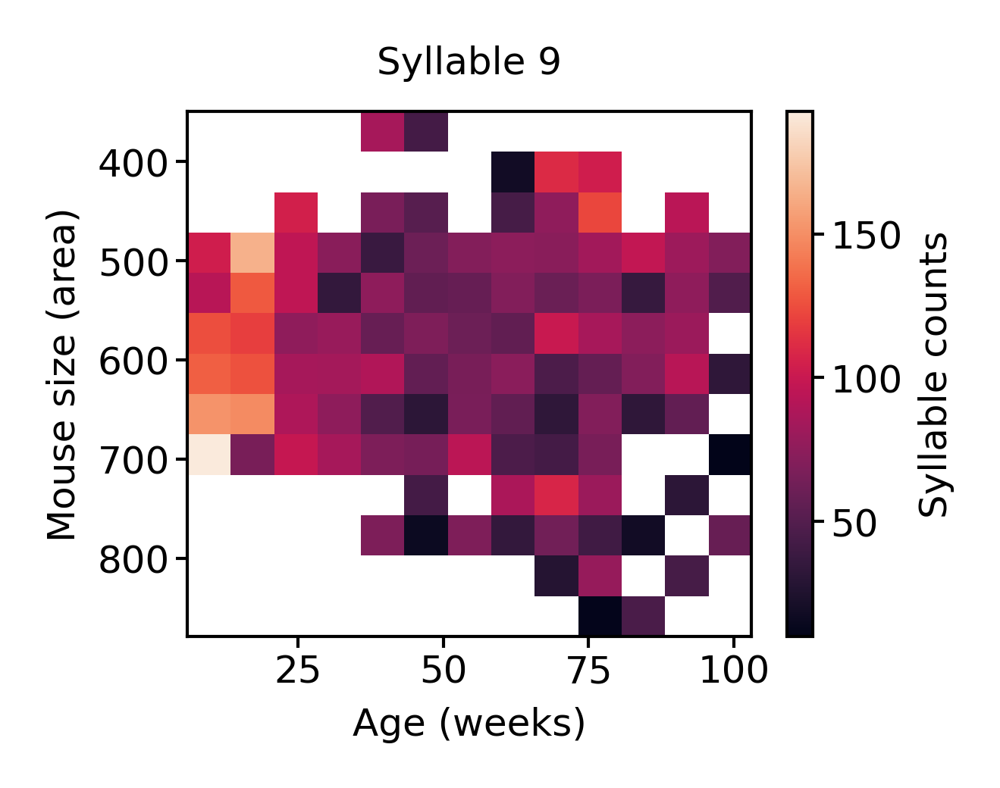

In [47]:
syllable = 0
for syllable in range(10):
    tmp = new_df.pivot_table(
        index="size_cut_demean", columns="age_cut", values=syllable, aggfunc="mean", fill_value=np.nan
    ).astype(float)
    figure(2, 1.5)
    plt.imshow(tmp, extent=(ages.iloc[0], ages.iloc[-1], sizes.iloc[-1], sizes.iloc[0]), aspect='auto')
    plt.title(f"Syllable {syllable}")
    plt.xlabel("Age (weeks)")
    plt.ylabel("Mouse size (area)")
    plt.colorbar(label="Syllable counts")
    plt.show()

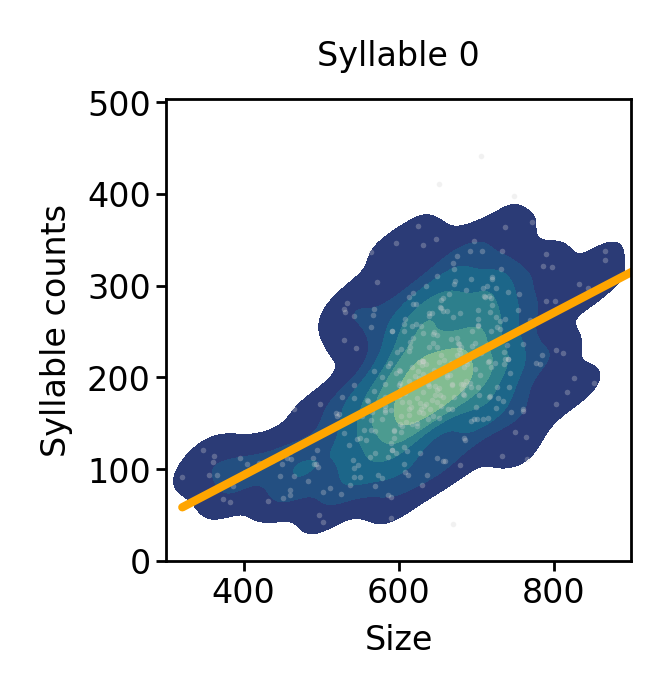

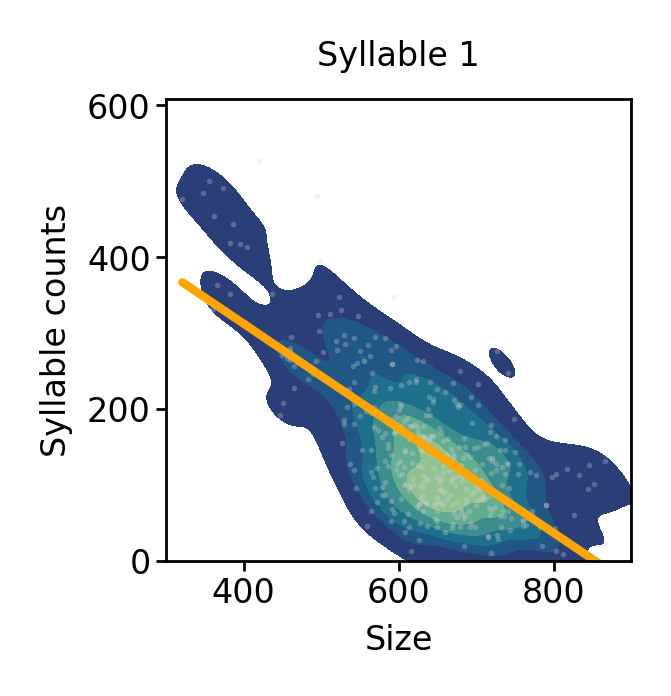

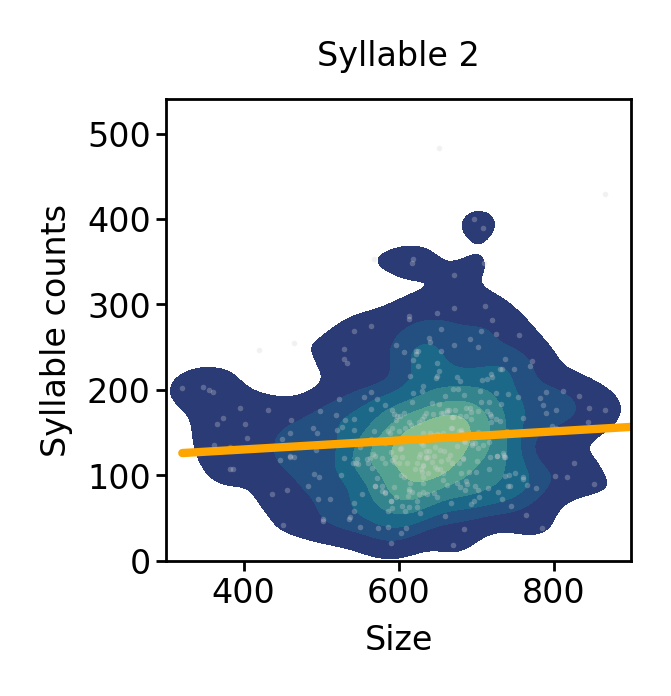

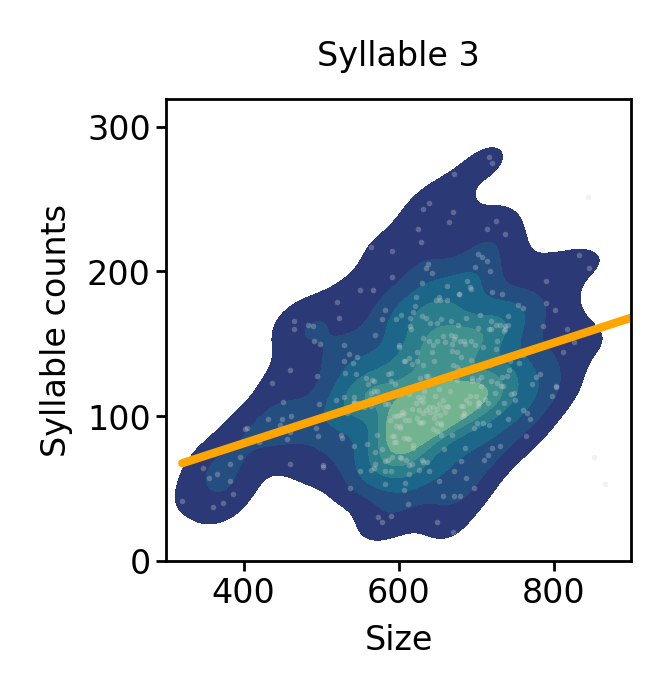

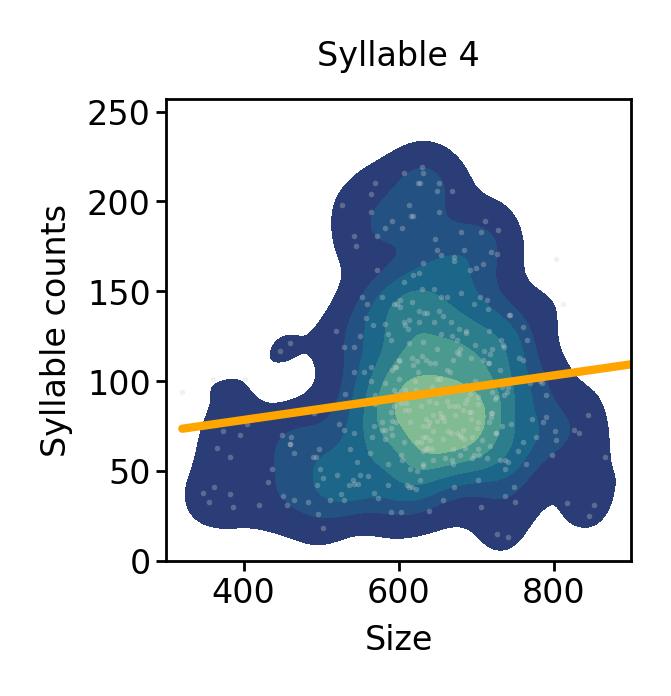

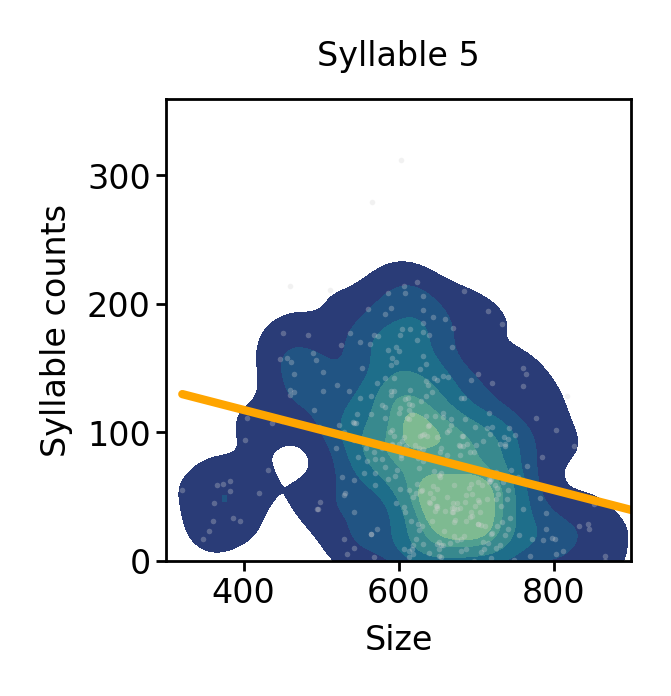

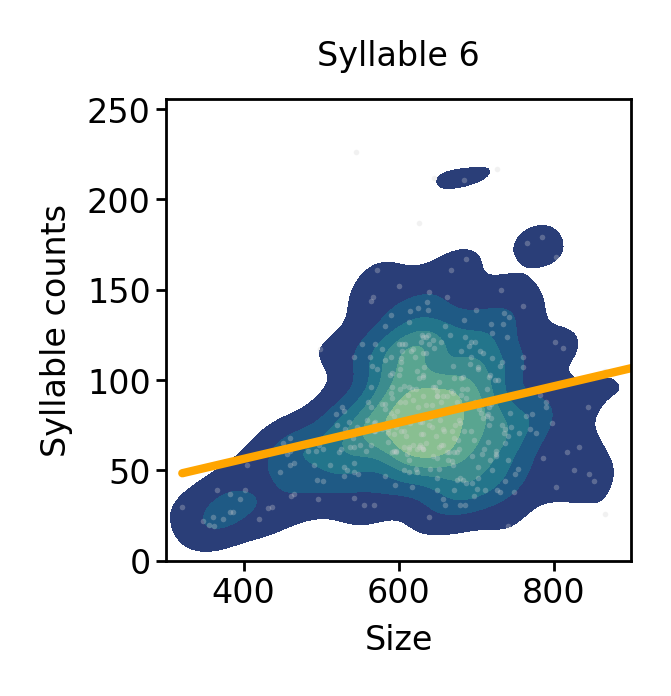

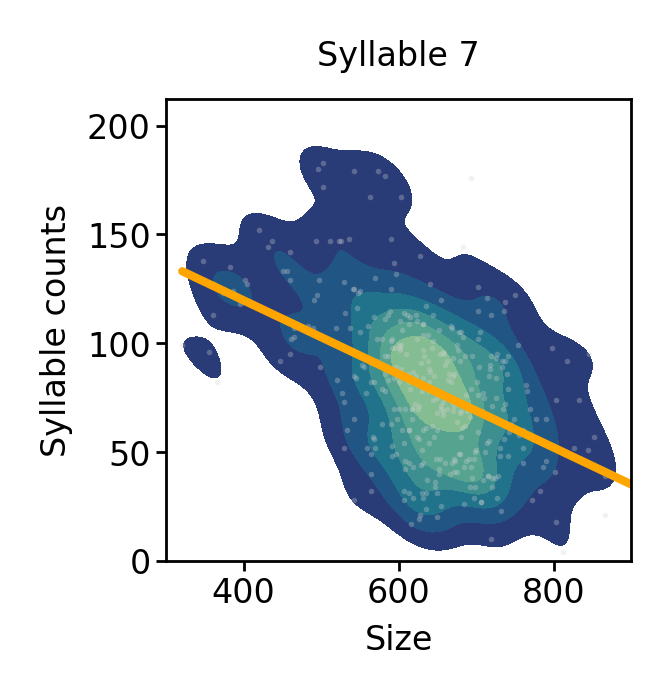

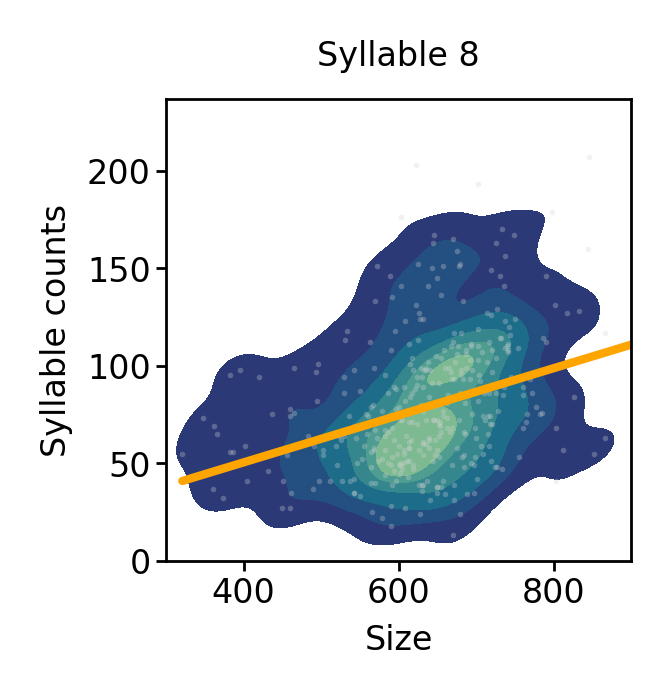

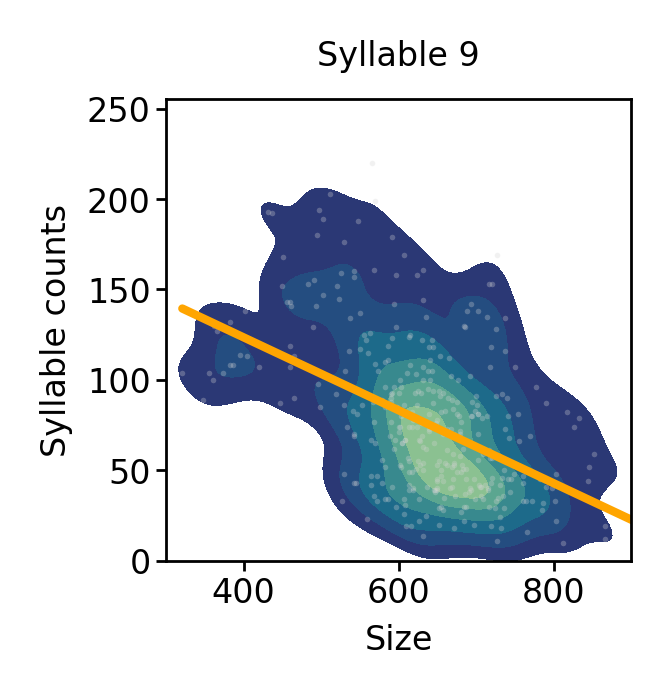

In [35]:
size_corrs = []
size_cuts = pd.cut(size_df.loc[df.index, "quant_0.5"].to_numpy(), bins=7, labels=False)
for syllable in range(10):
    fig = plt.figure(figsize=(1.5, 1.5))
    ax = sns.kdeplot(
        x=size_df.loc[df.index, "quant_0.5"],
        y=df[syllable],
        fill=True,
        levels=7,
        cmap="crest_r",
        bw_adjust=0.75,
    )
    plt.scatter(size_df.loc[df.index, "quant_0.5"], df[syllable], s=1, alpha=0.3, linewidths=0, c="lightgray")
    sns.regplot(
        x=size_df.loc[df.index, "quant_0.5"],
        y=df[syllable],
        scatter=False,
        ci=None,
        color="orange",
        robust=True,
    )
    ax.set(xlabel="Size", ylabel="Syllable counts", xlim=(300, 900), ylim=(0, None))
    plt.title(f"Syllable {syllable}")
    plt.show()
    size_corrs.append(size_df["quant_0.5"].corr(df[syllable]))

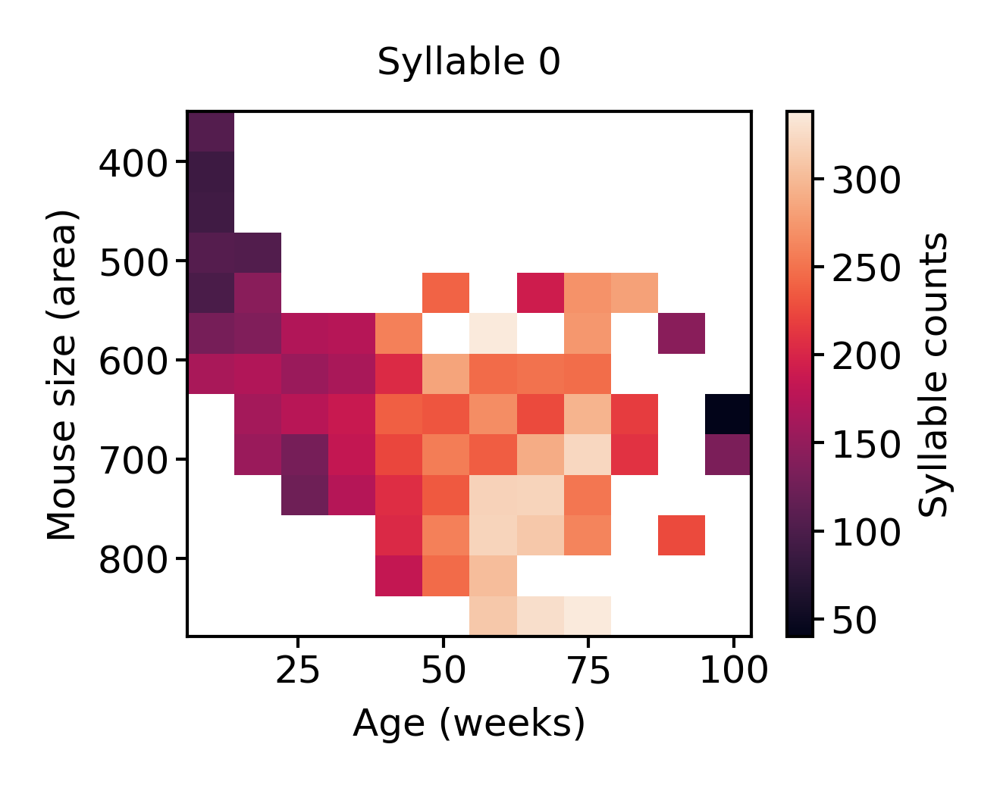

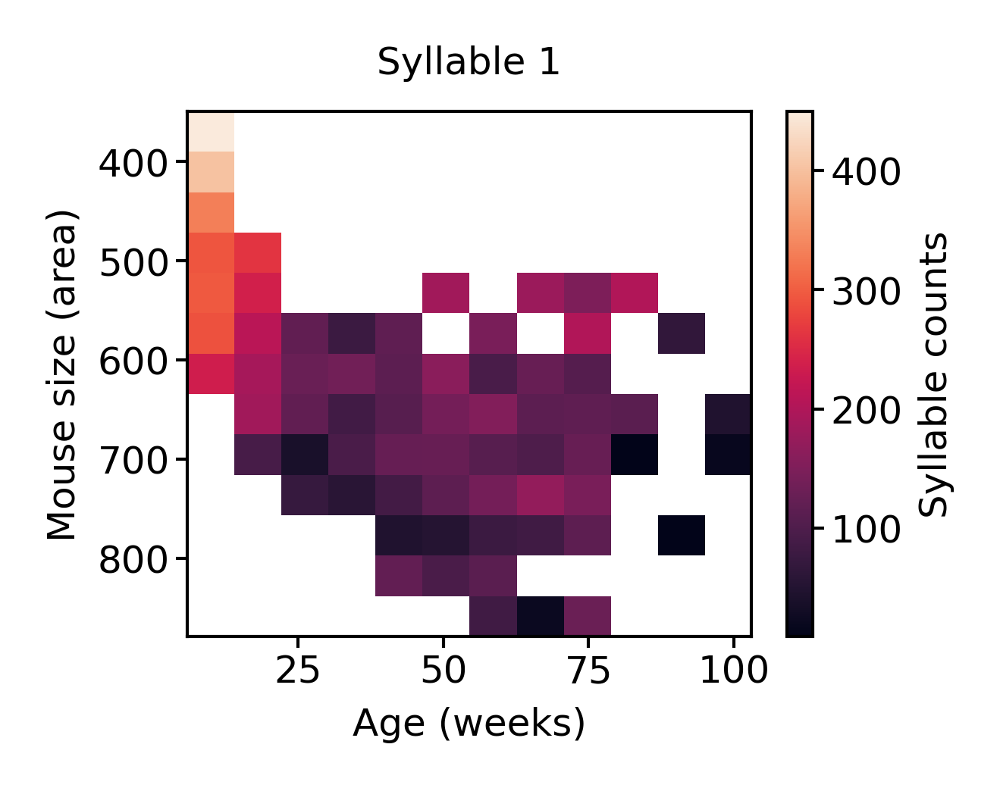

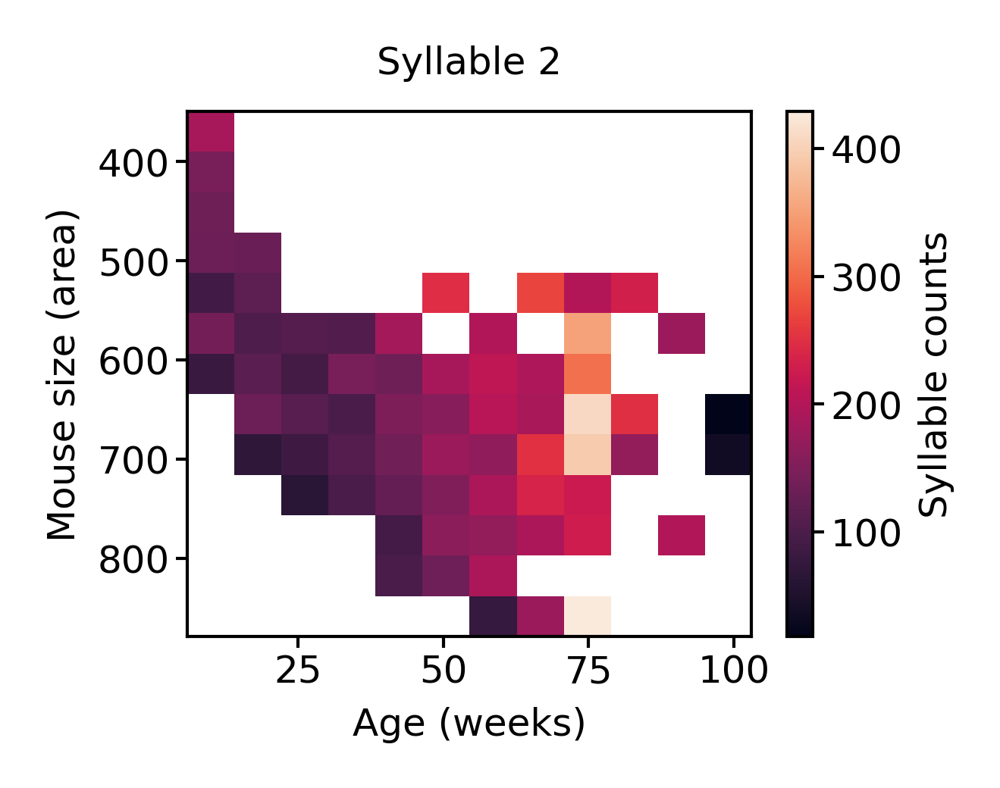

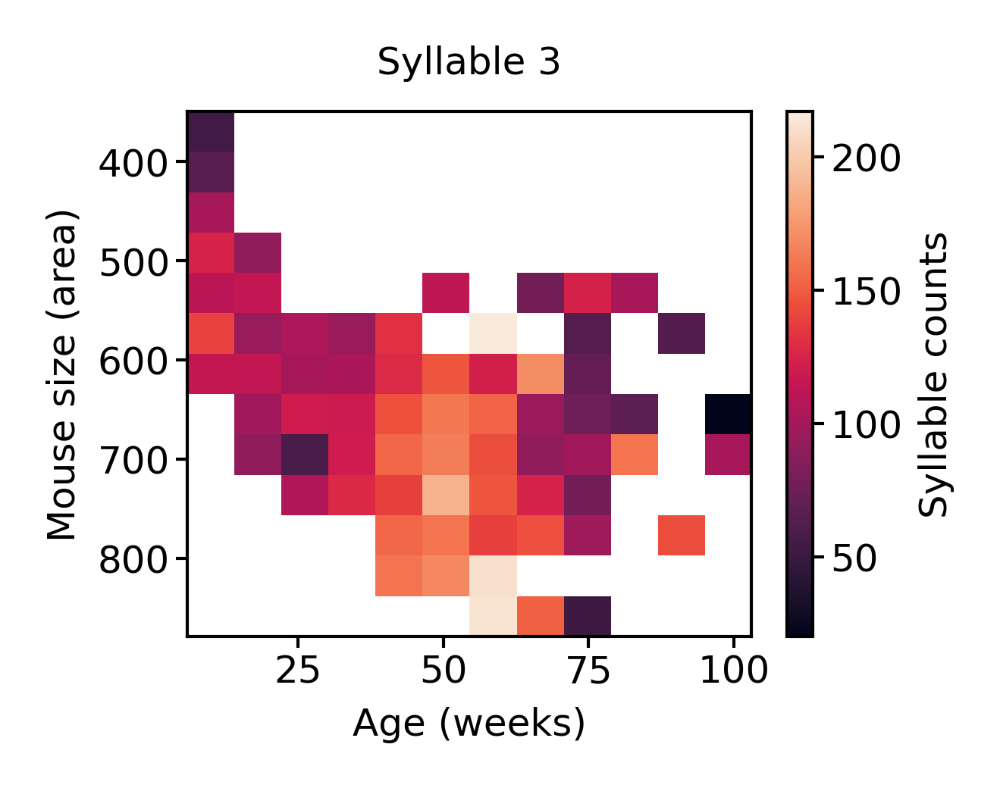

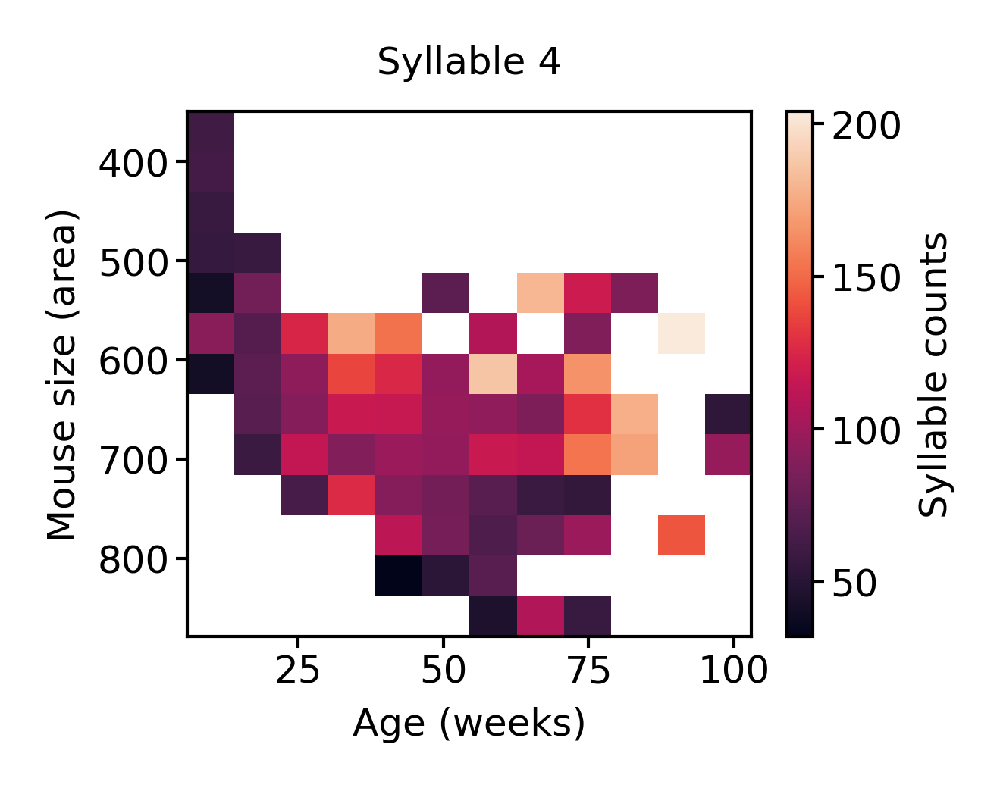

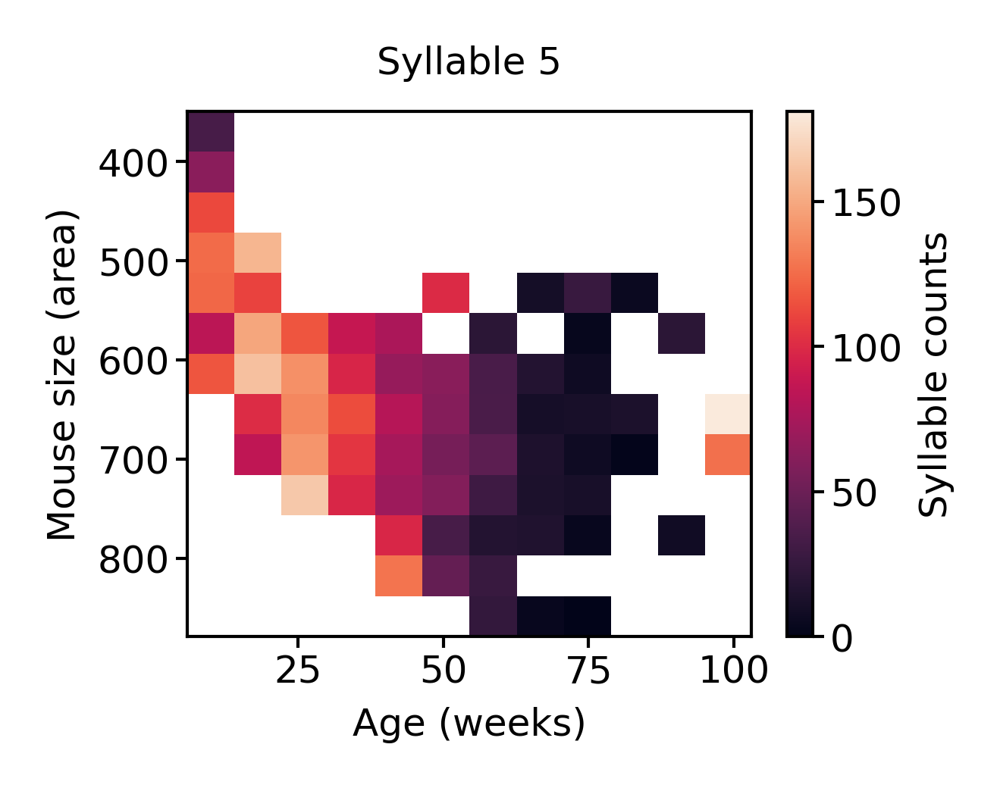

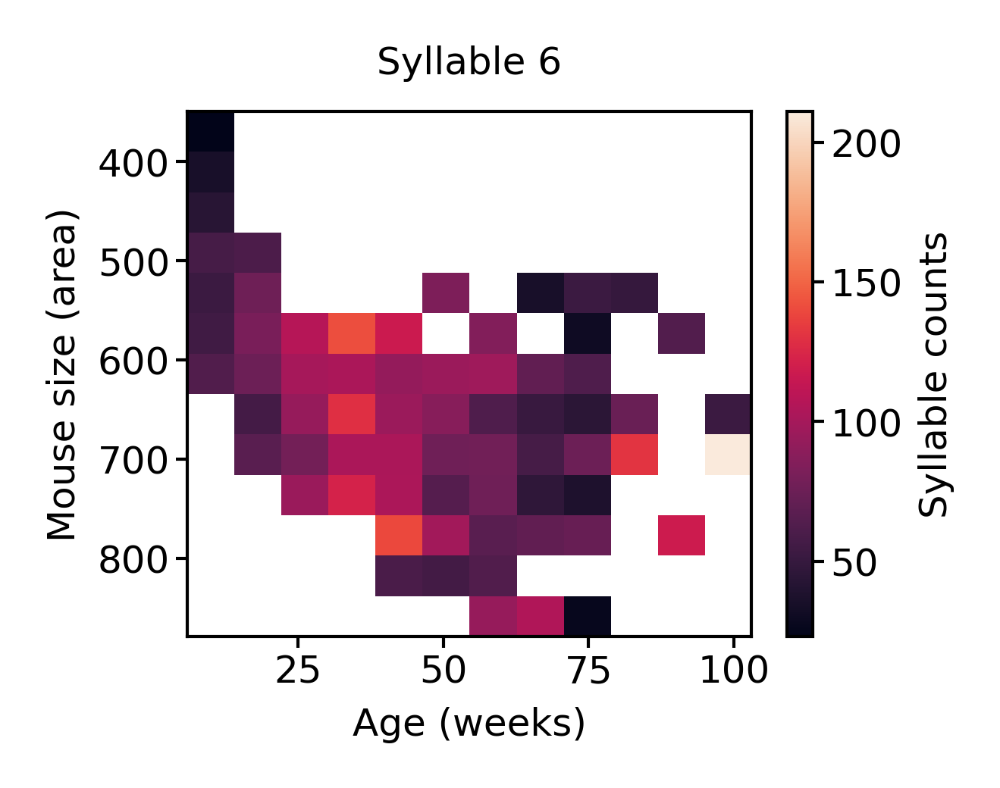

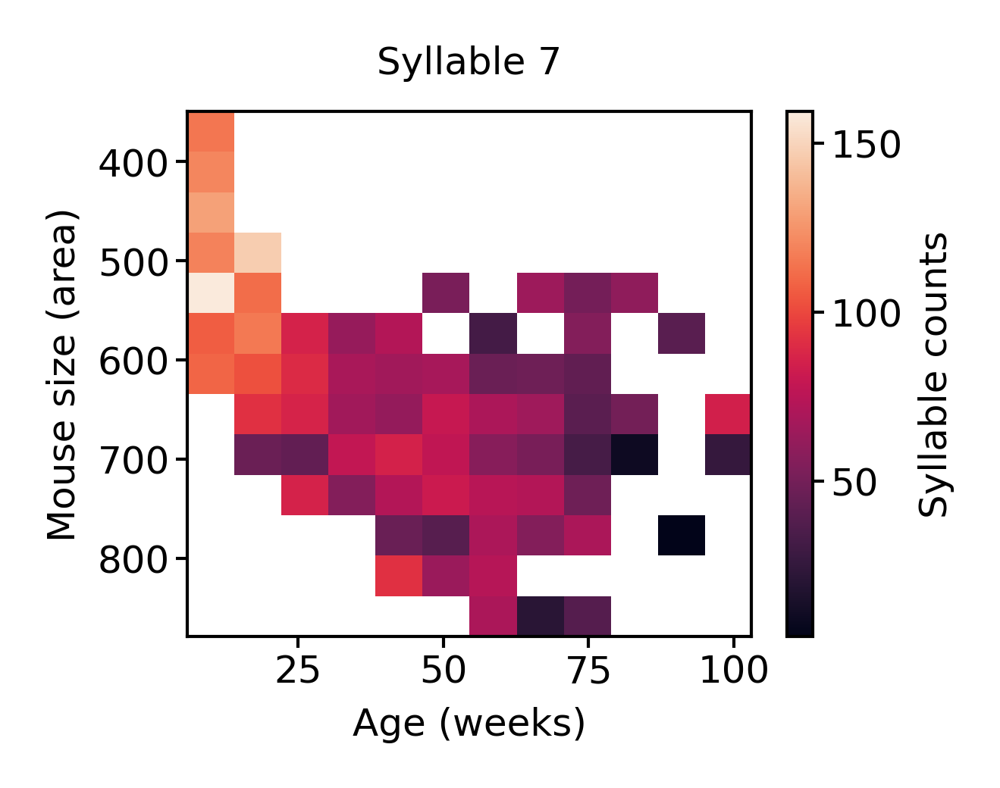

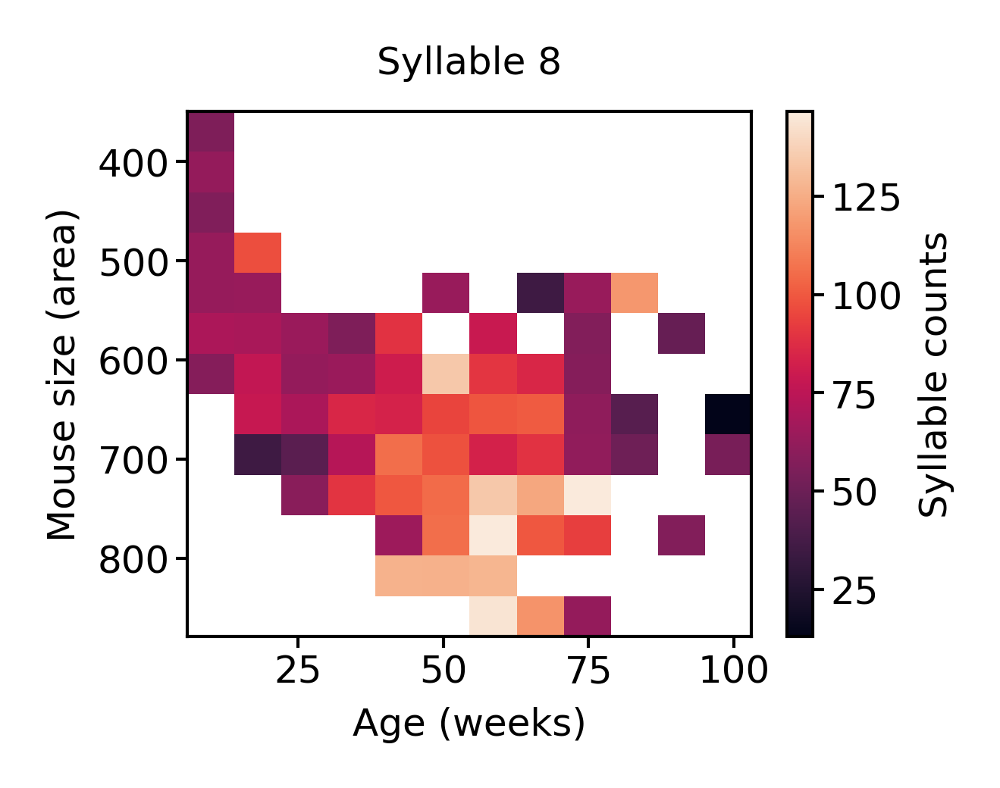

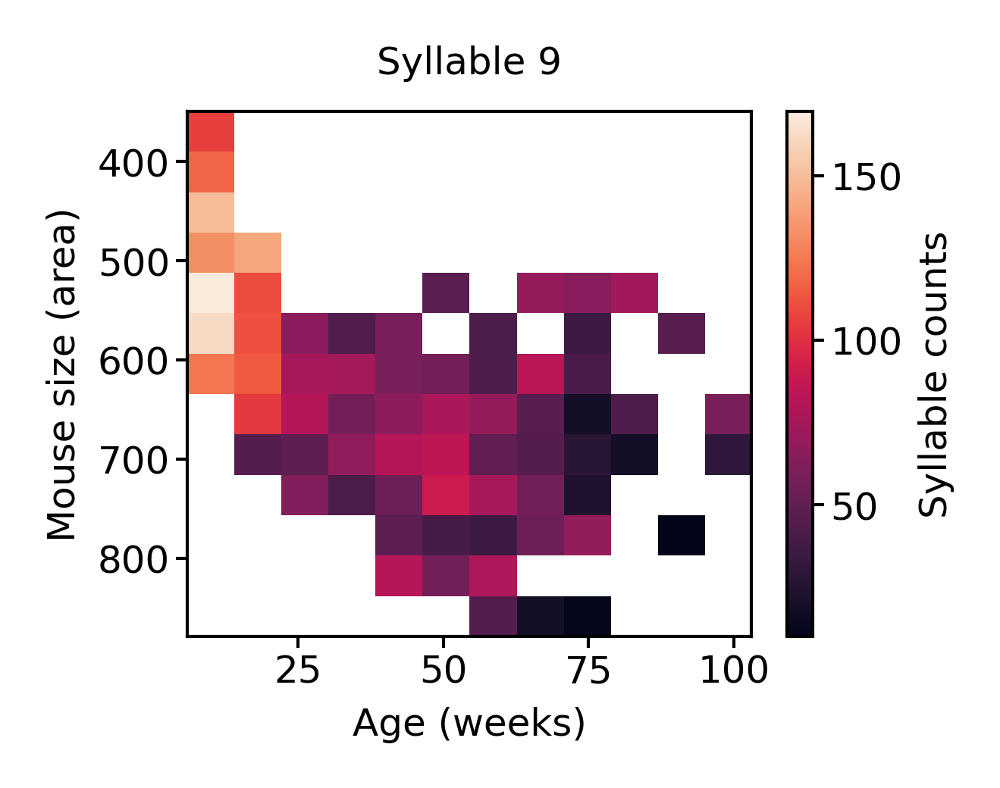

In [36]:
for syllable in range(10):
    tmp = new_df.pivot_table(
        index="size_cut", columns="bio_age_cut", values=syllable, aggfunc="mean", fill_value=np.nan
    ).astype(float)
    figure(2, 1.5)
    plt.imshow(tmp, extent=(ages.iloc[0], ages.iloc[-1], sizes.iloc[-1], sizes.iloc[0]), aspect='auto')
    plt.title(f"Syllable {syllable}")
    plt.xlabel("Age (weeks)")
    plt.ylabel("Mouse size (area)")
    plt.colorbar(label="Syllable counts")
    plt.show()

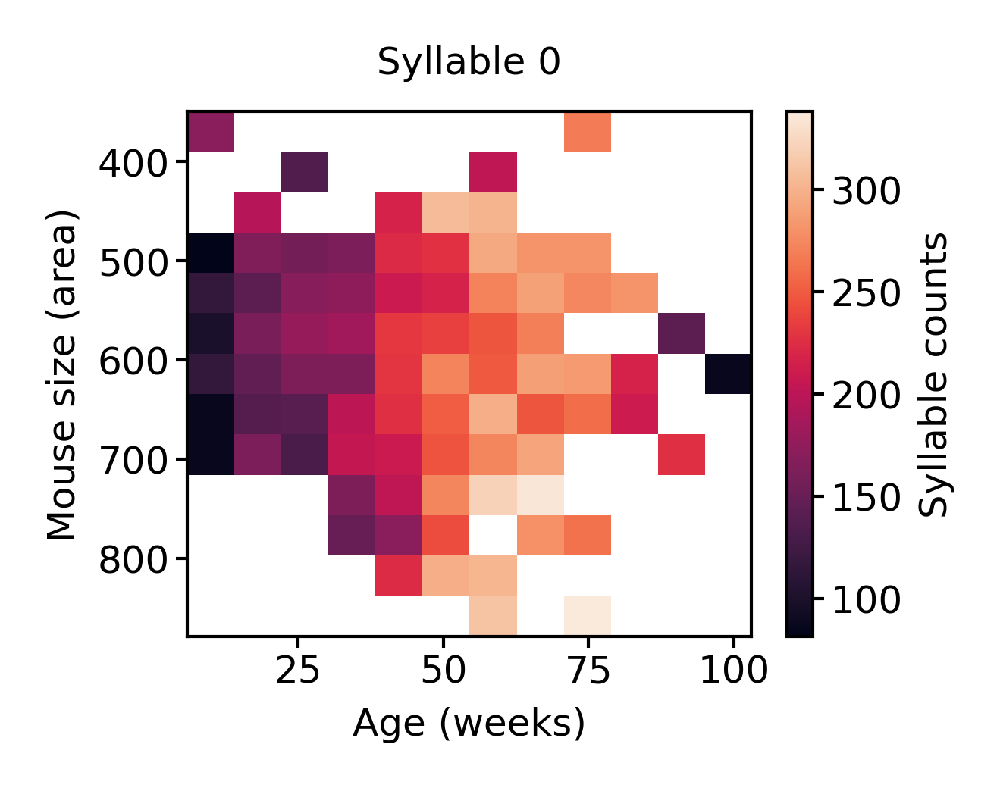

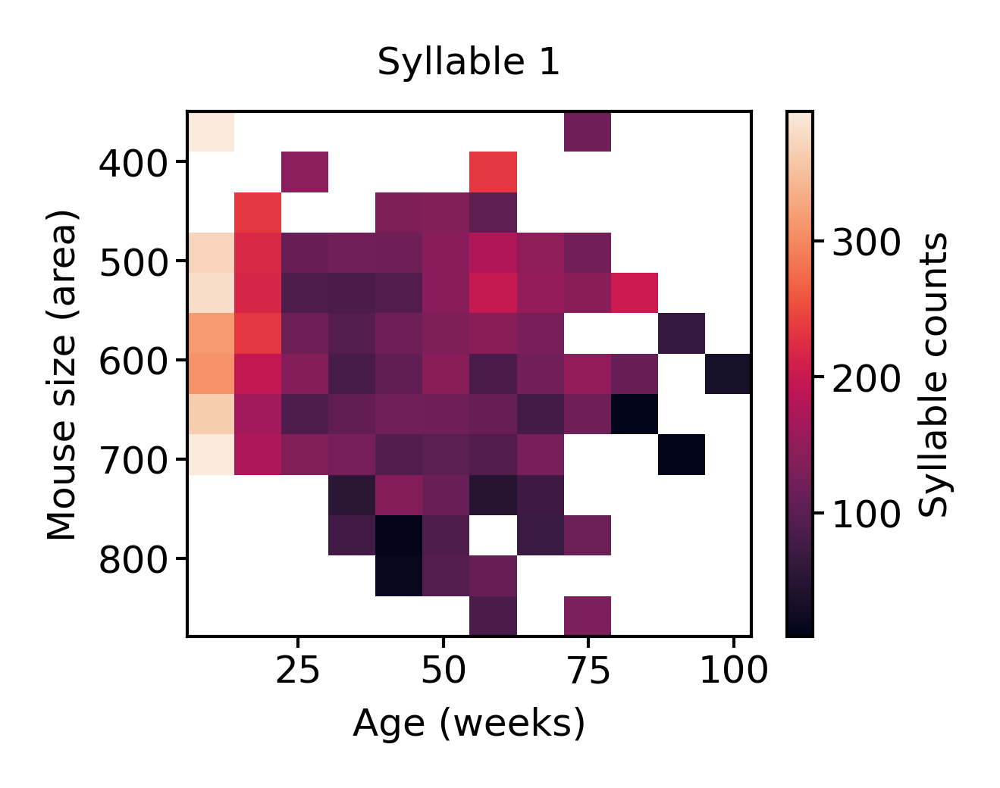

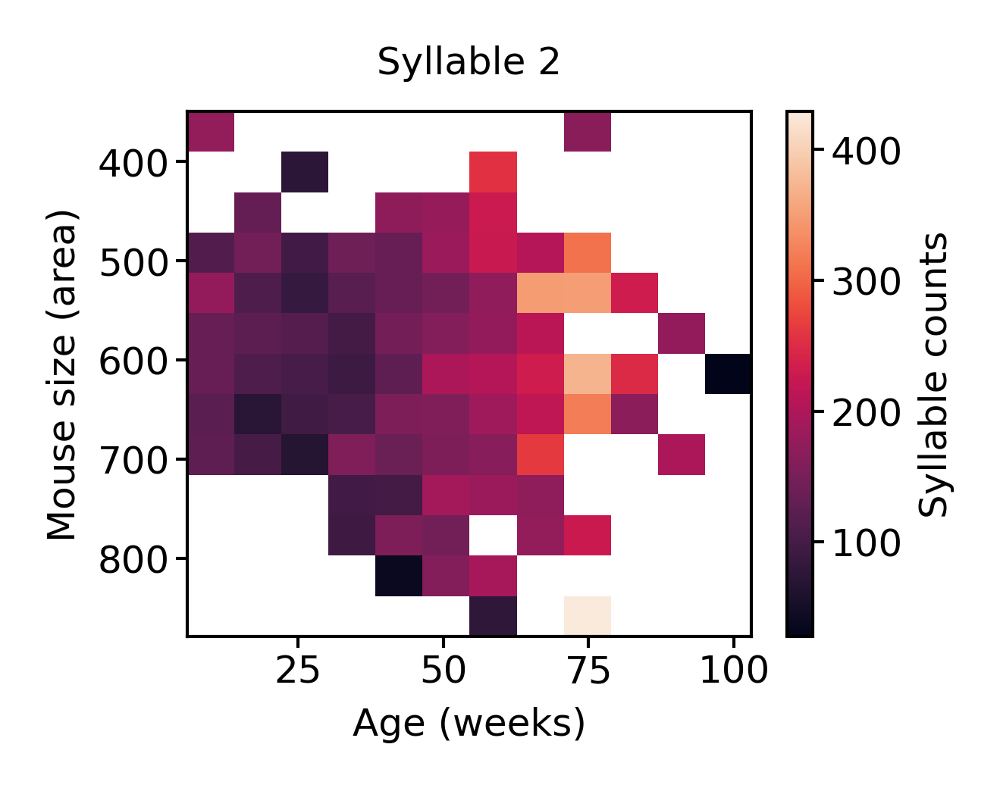

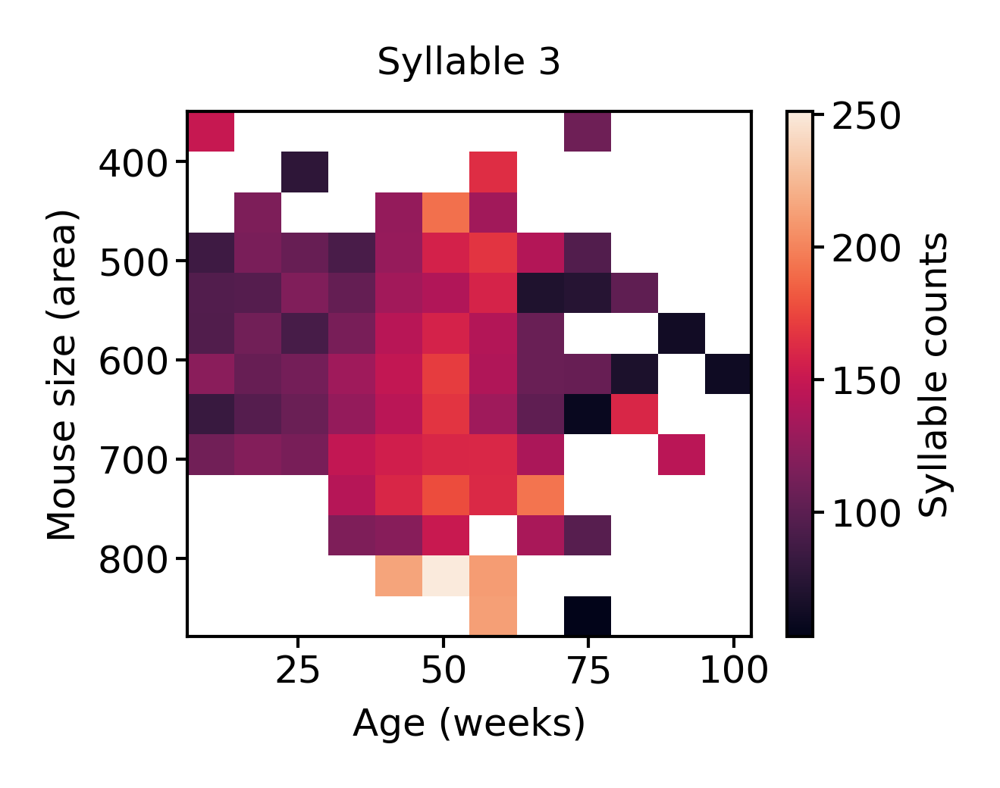

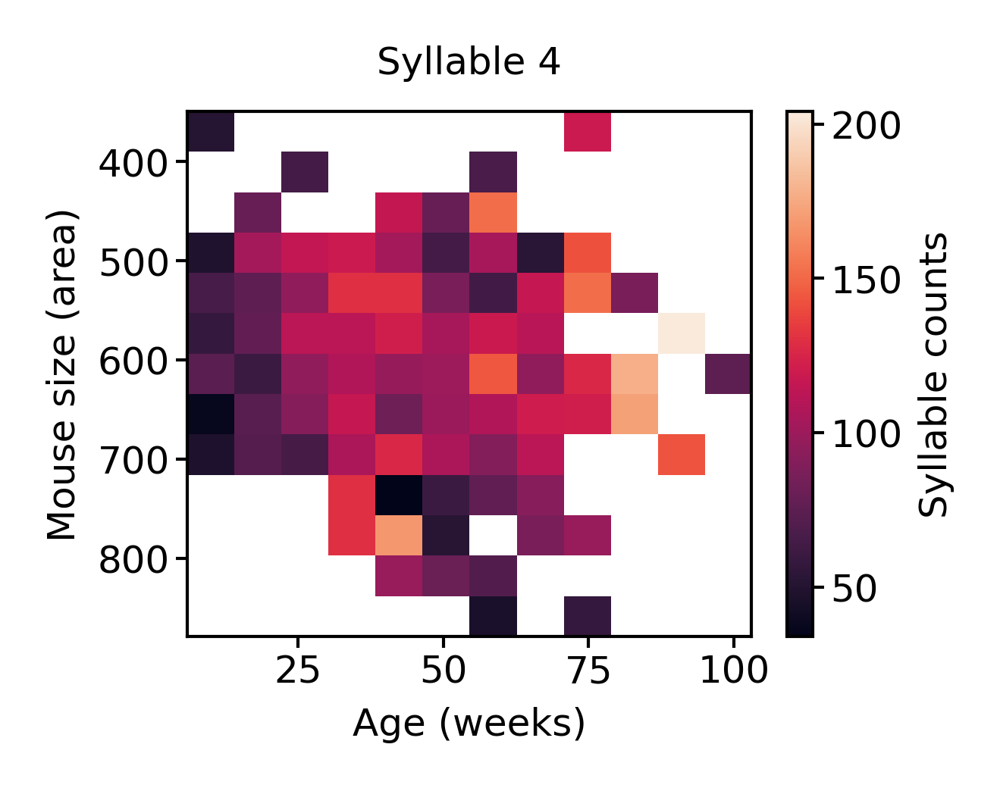

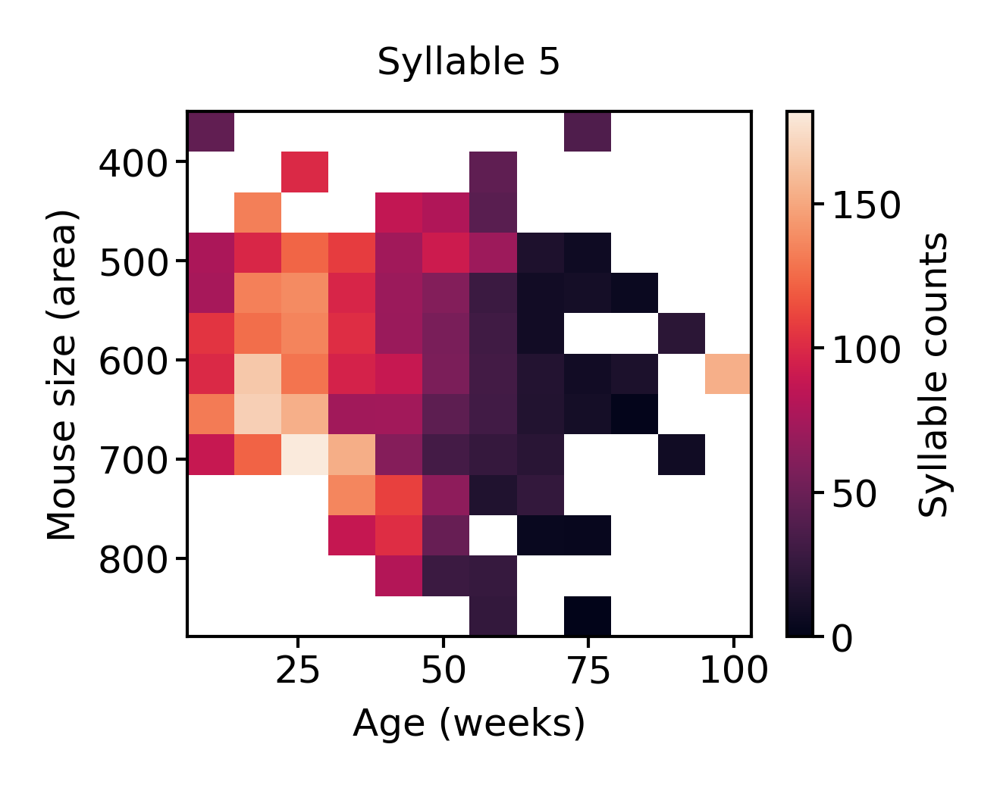

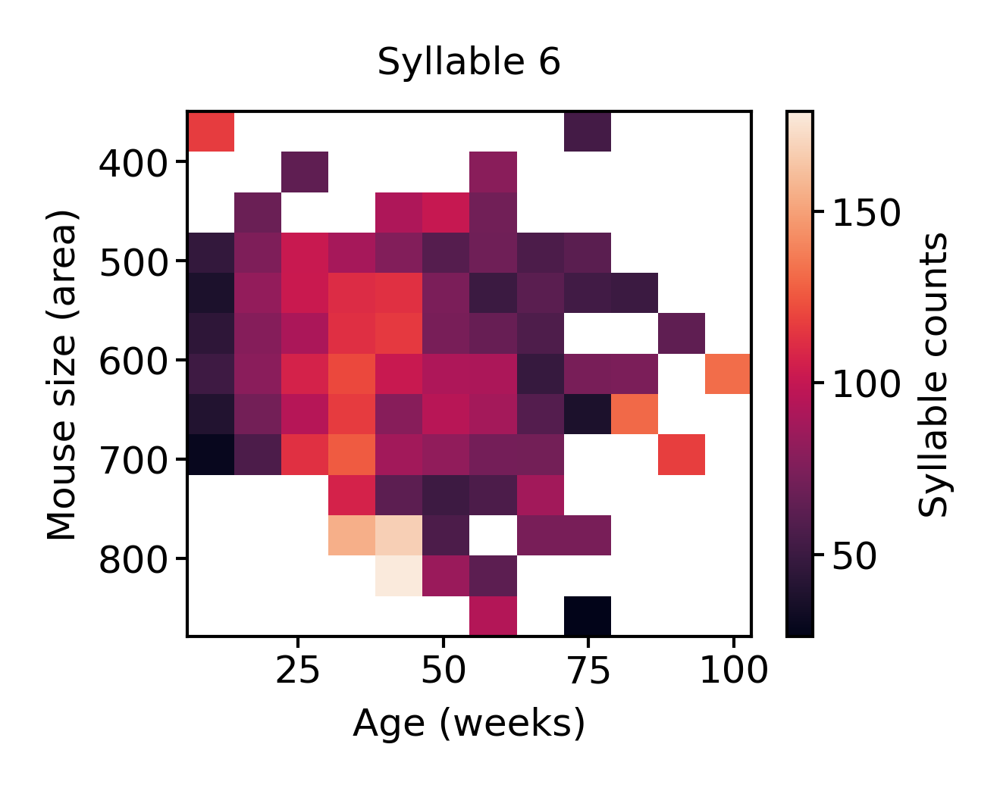

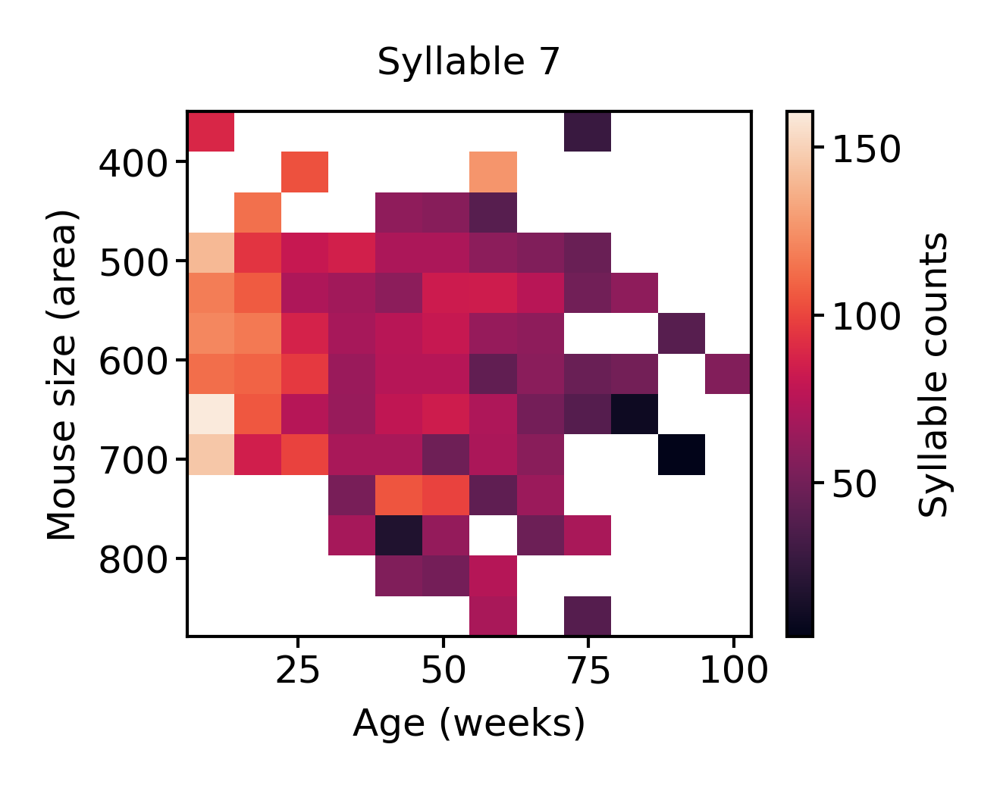

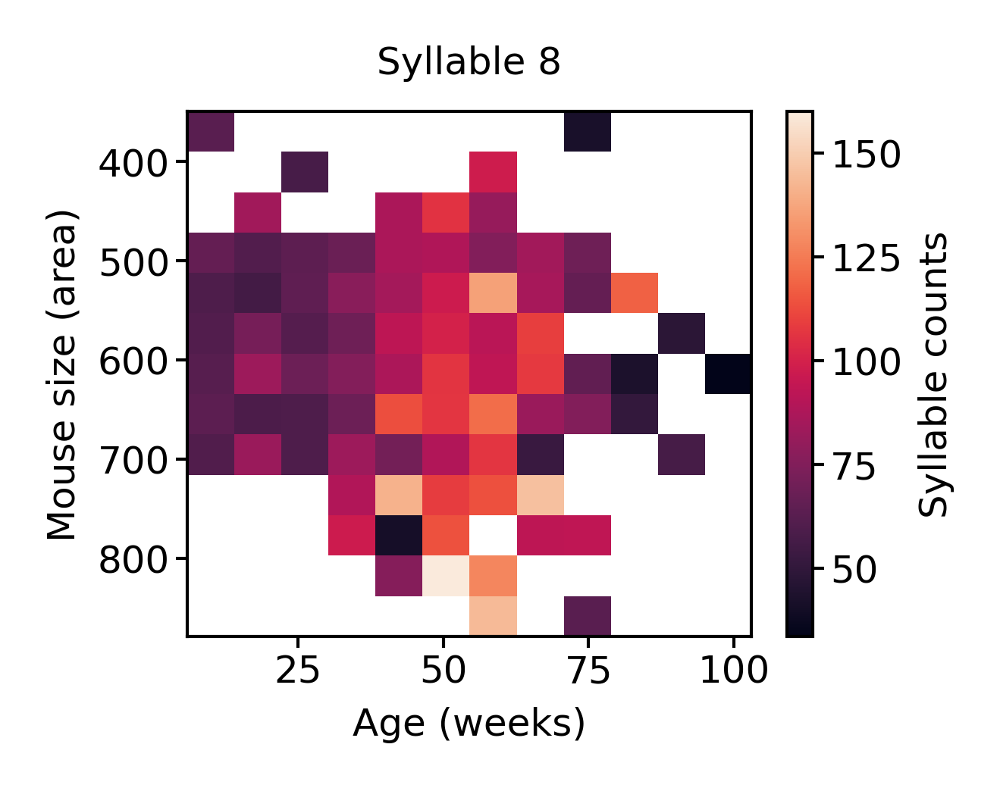

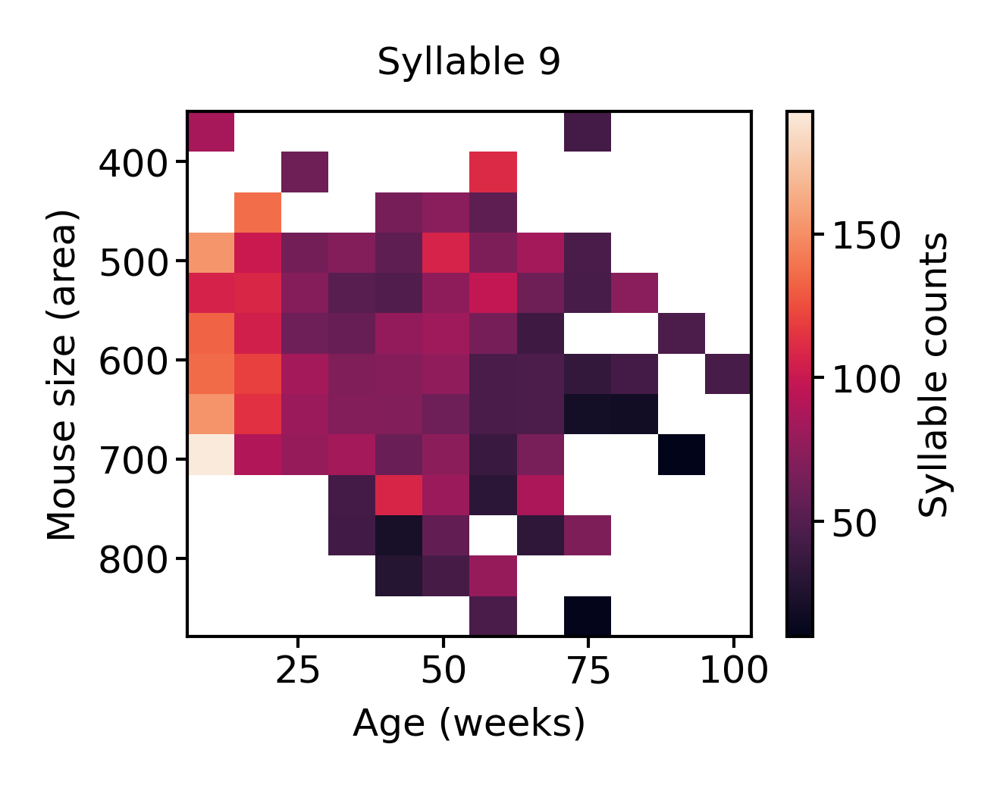

In [46]:
for syllable in range(10):
    tmp = new_df.pivot_table(
        index="size_cut_demean", columns="bio_age_cut", values=syllable, aggfunc="mean", fill_value=np.nan
    ).astype(float)
    figure(2, 1.5)
    plt.imshow(tmp, extent=(ages.iloc[0], ages.iloc[-1], sizes.iloc[-1], sizes.iloc[0]), aspect='auto')
    plt.title(f"Syllable {syllable}")
    plt.xlabel("Age (weeks)")
    plt.ylabel("Mouse size (area)")
    plt.colorbar(label="Syllable counts")
    plt.show()

In [ ]:
def model_fun_v1(params, bases, age_samples, true_age, counts, hypparams):
    # concentrations = (
    #     jnp.exp(params["bio_basis_weights"]) @ bases["bio"]
    # )  # shape (n_syllables, n_ages)
    concentrations = (
        jnp.exp(params["bio_basis_weights"] @ bases["bio"])
        # params["bio_basis_weights"] @ bases["bio"]
    )  # shape (n_syllables, n_ages)

    concentrations = jnp.tile(concentrations.T[None], (len(counts), 1, 1))
    # shape (n_sessions, n_ages, n_syllables)

    log_probs = compute_distribution_logprobs(
        counts, concentrations, true_age, age_samples, hypparams
    )

    return log_probs


## Fit linear model from bio age to syllable use, then add size to it

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import ShuffleSplit, cross_val_score, cross_validate
from statsmodels.gam.smooth_basis import BSplines

In [10]:
bio_age = fit_data['bio_ages']
age = fit_data['true_ages']

In [11]:
splines = BSplines(np.linspace(age.min(), age.max(), 1000), 5, 3, include_intercept=True)
weights = splines.transform(age)

In [12]:
size_splines = BSplines(np.linspace(sizes_col.min(), sizes_col.max(), 1000), 5, 3, include_intercept=True)
size_weights = size_splines.transform(sizes_col.to_numpy())

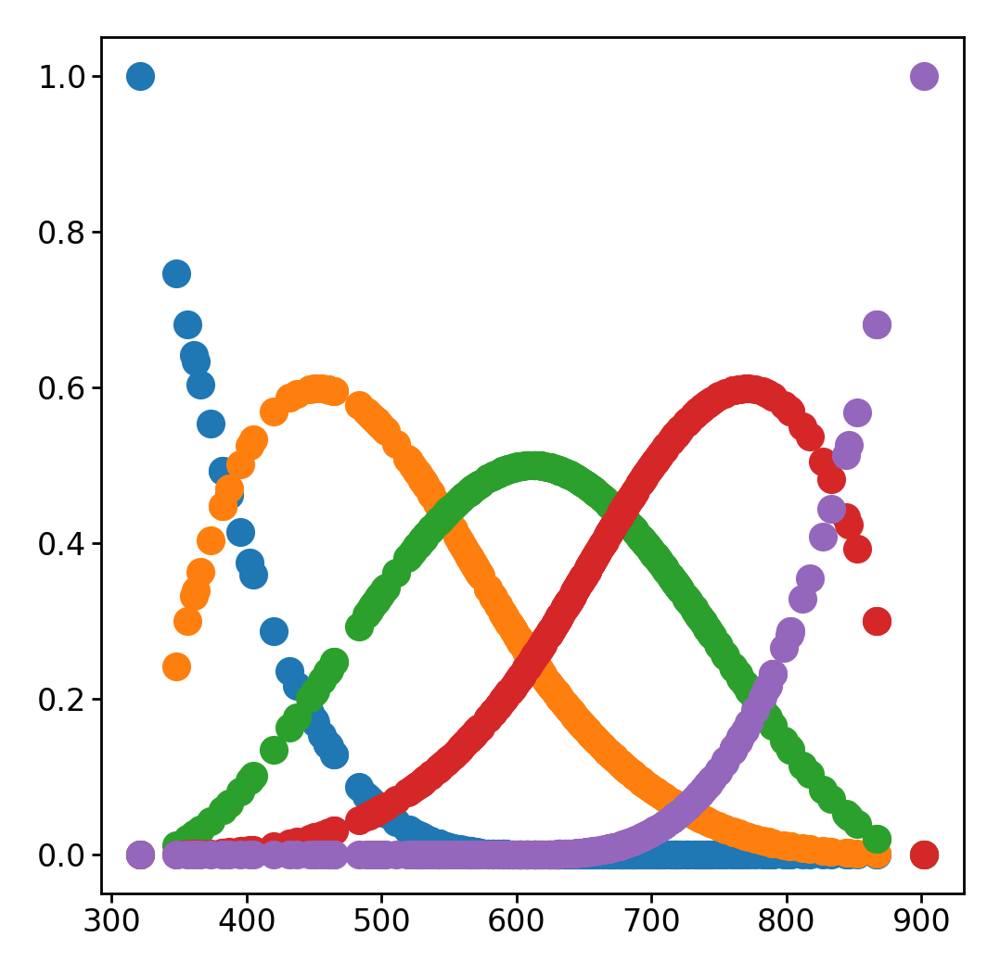

In [13]:
for i in range(5):
    plt.scatter(sizes_col, size_weights[:, i])

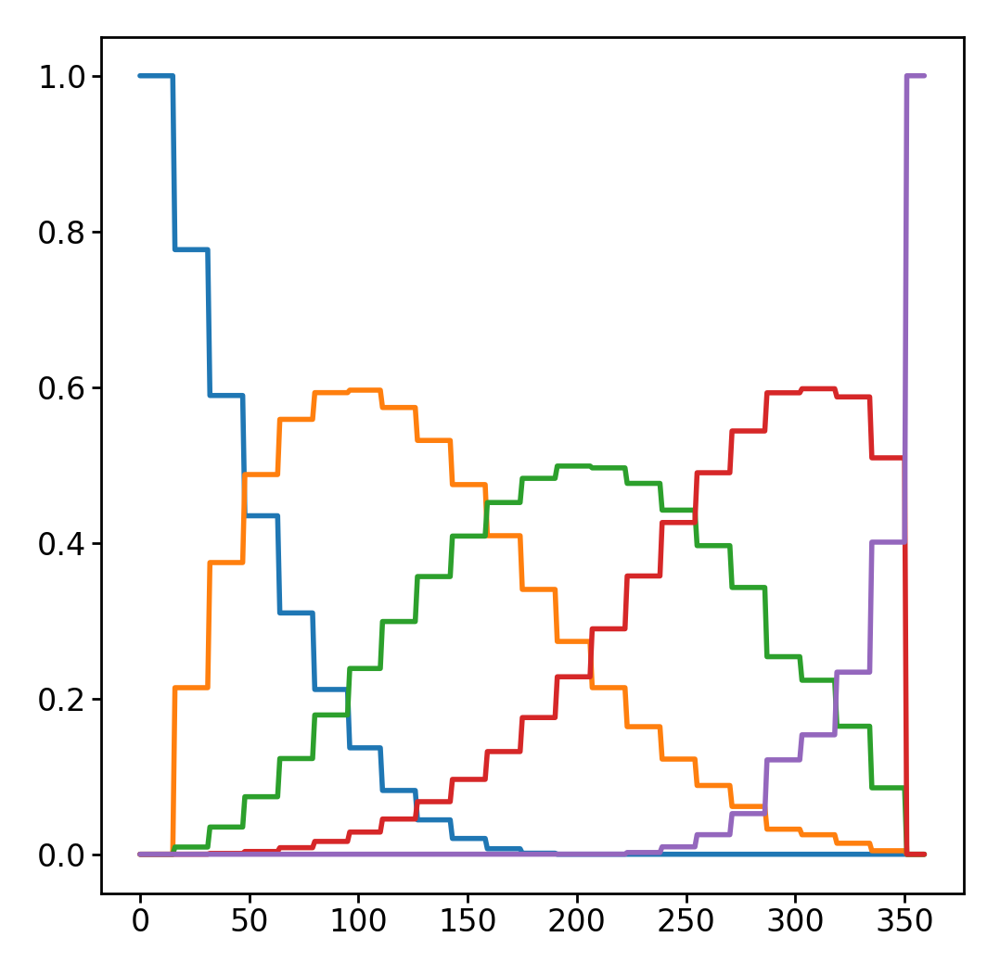

In [14]:
plt.plot(weights)


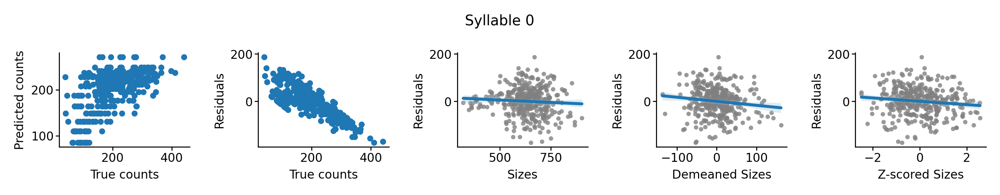

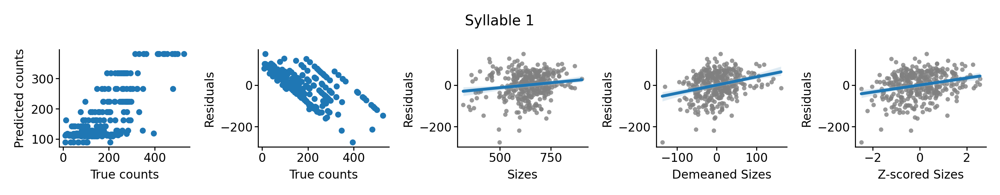

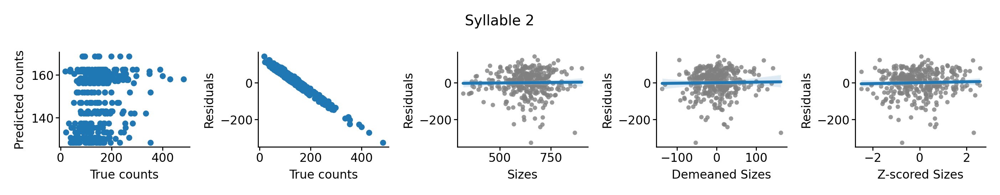

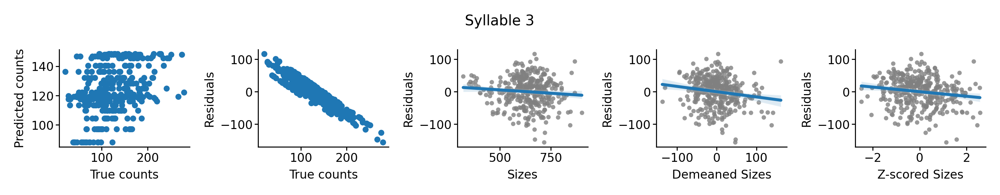

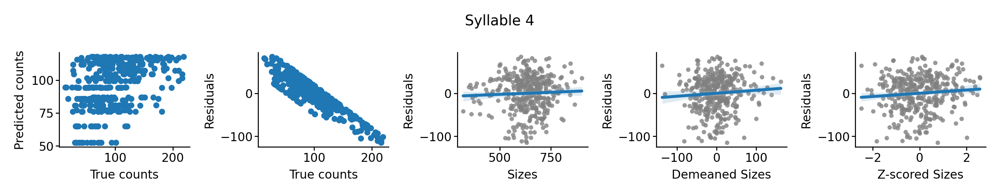

...

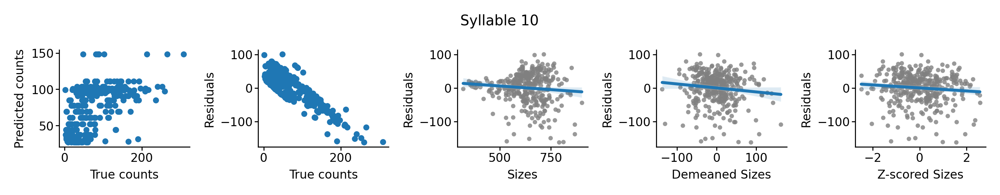

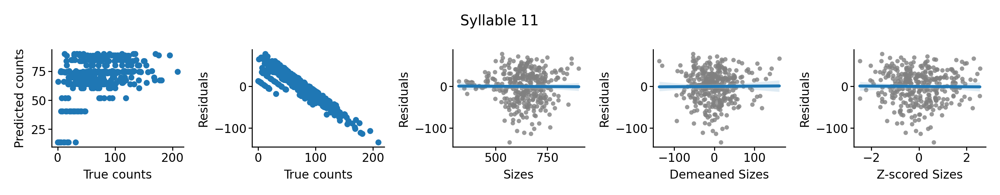

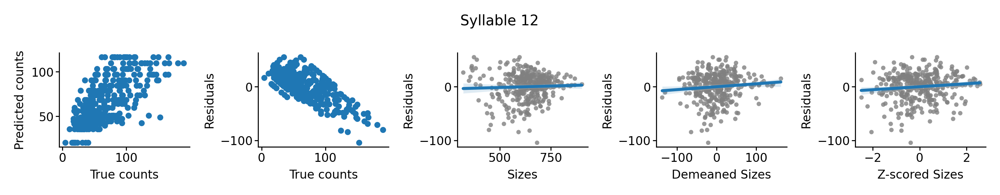

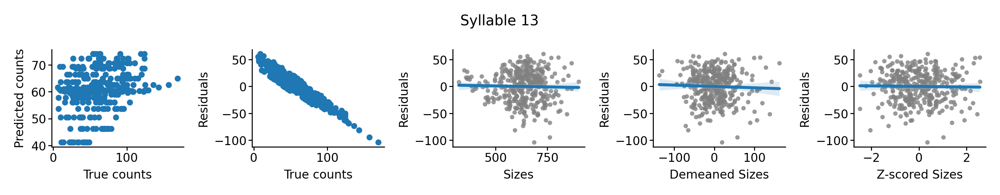

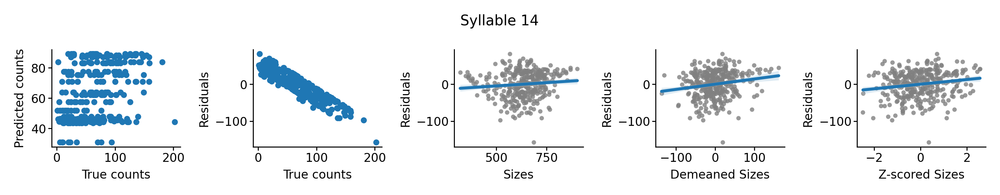

In [118]:
# loop through a set of syllables
for i in range(15):
    lr = LinearRegression(fit_intercept=False)
    lr.fit(weights, df[[i]])
    preds = lr.predict(weights).flatten()
    residuals = preds - df[i]

    fig, ax = plt.subplots(1, 5, figsize=(7, 1.3))
    ax[0].scatter(df[i], preds, s=5)
    ax[0].set(xlabel="True counts", ylabel="Predicted counts")

    ax[1].scatter(df[i], residuals, s=5)
    ax[1].set(xlabel="True counts", ylabel="Residuals")
    
    a = sns.regplot(x=sizes_col, y=residuals, ax=ax[2], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    # ax[2].scatter(sizes_col, residuals, s=5)
    a.set(xlabel="Sizes", ylabel="Residuals")
    
    a = sns.regplot(x=demeaned_sizes_col, y=residuals, ax=ax[3], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    a.set(xlabel="Demeaned Sizes", ylabel="Residuals")
    
    a = sns.regplot(x=zscore_sizes_col, y=residuals, ax=ax[4], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    a.set(xlabel="Z-scored Sizes", ylabel="Residuals")
    sns.despine()
    fig.suptitle(f"Syllable {i}")
    fig.tight_layout()

In [17]:
splines = BSplines(np.linspace(age.min(), age.max(), 1000), 5, 3, include_intercept=True)
weights = splines.transform(age)

size_splines = BSplines(np.linspace(sizes_col.min(), sizes_col.max(), 1000), 5, 3, include_intercept=True)
size_weights = size_splines.transform(sizes_col.to_numpy())

r2_df = []
for i in range(50):
    out = {}
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, weights, df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age"] = np.mean(scores)

    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, demeaned_sizes_col.to_numpy()[:, None], np.ones((len(df), 1))]), df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age + demeaned size"] = np.mean(scores)

    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, sizes_col.to_numpy()[:, None], np.ones((len(df), 1))]), df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age + size"] = np.mean(scores)

    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, zscore_sizes_col.to_numpy()[:, None], np.ones((len(df), 1))]), df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age + zscored size"] = np.mean(scores)

    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, zscore_sizes_col.to_numpy()[:, None], zscore(age * zscore_sizes_col.to_numpy())[:, None]]), df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age + zscored size + interaction"] = np.mean(scores)

    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, size_weights]), df[[i]], cv=ShuffleSplit(test_size=0.4, n_splits=5, random_state=0), n_jobs=-1)
    out["age + splined size"] = np.mean(scores)
    # out["syllable"] = i
    r2_df.append(out)
r2_df = pd.DataFrame(r2_df)

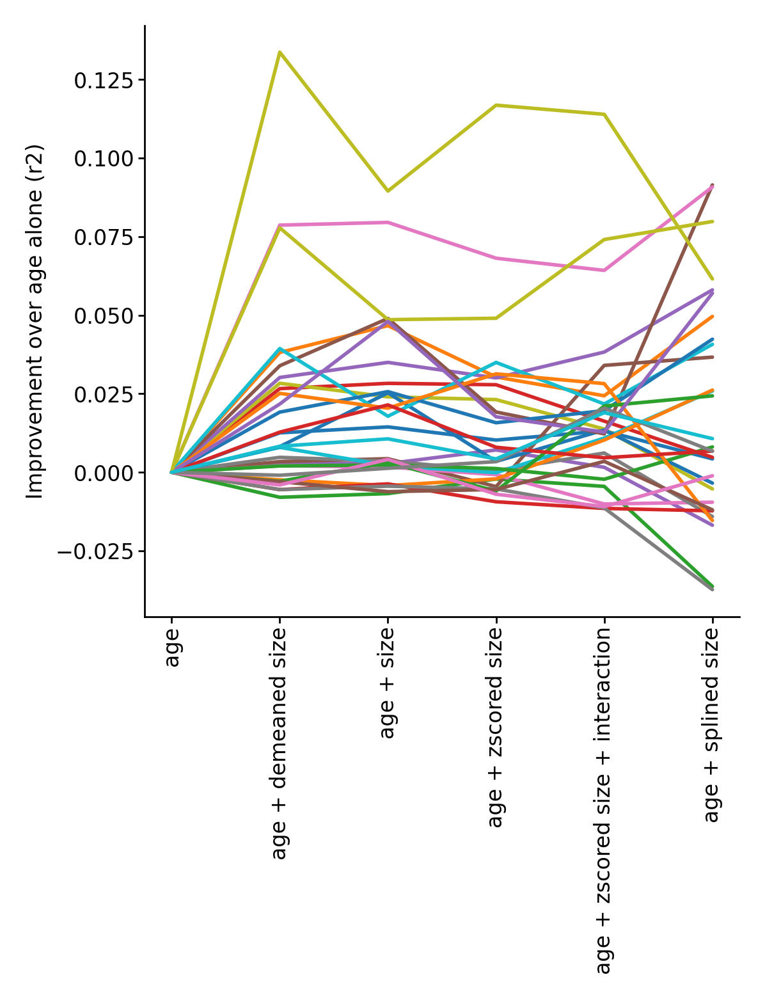

In [87]:
for idx, row in r2_df.iterrows():
    plt.plot(row - row.iloc[0])
plt.xticks(r2_df.columns, rotation=90);
plt.ylabel("Improvement over age alone (r2)")
sns.despine()

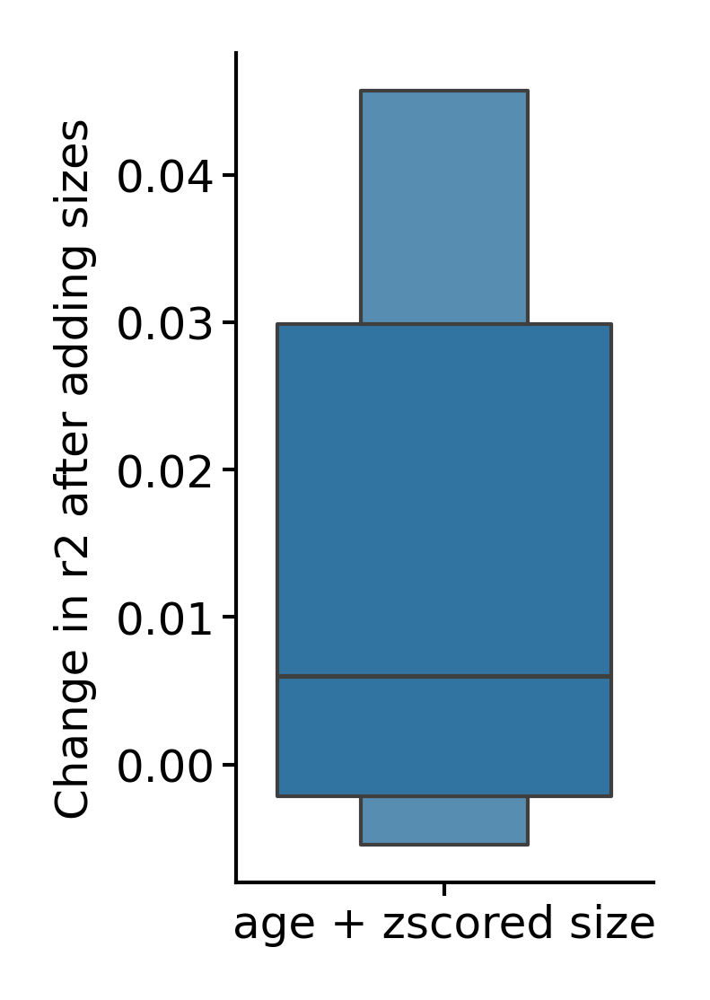

In [20]:
r2_df = r2_df - r2_df['age'].to_numpy()[:, None]

figure(1, 2)
ax = sns.boxenplot(data=r2_df[["age + zscored size"]], showfliers=False, )
ax.set(ylabel="Change in r2 after adding sizes")
sns.despine()

#### Bio ages

In [246]:
splines = BSplines(np.linspace(bio_age.min(), bio_age.max(), 1000), 5, 3, include_intercept=True)
weights = splines.transform(bio_age)

size_splines = BSplines(np.linspace(sizes_col.min(), sizes_col.max(), 1000), 5, 3, include_intercept=True)
size_weights = size_splines.transform(sizes_col.to_numpy())

cv = ShuffleSplit(test_size=0.4, n_splits=15, random_state=0)

r2_df = []
for i in tqdm(range(30)):
    out = {}
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, weights, df[[i]], cv=cv, n_jobs=-1)
    out["age"] = np.mean(scores)
    
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, demeaned_sizes_col.to_numpy()[:, None]]), df[[i]], cv=cv, n_jobs=-1)
    out["age + demeaned size"] = np.mean(scores)
    
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, sizes_col.to_numpy()[:, None]]), df[[i]], cv=cv, n_jobs=-1)
    out["age + size"] = np.mean(scores)
    
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, zscore_sizes_col.to_numpy()[:, None]]), df[[i]], cv=cv, n_jobs=-1)
    out["age + zscored size"] = np.mean(scores)
    
    lr = LinearRegression(fit_intercept=False)
    scores = cross_val_score(lr, np.hstack([weights, size_weights]), df[[i]], cv=cv, n_jobs=-1)
    out["age + splined size"] = np.mean(scores)
    # out["syllable"] = i
    r2_df.append(out)
r2_df = pd.DataFrame(r2_df)

  0%|          | 0/30 [00:00<?, ?it/s]

In [240]:
r2_df.head()

,age,age + demeaned size,age + size,age + zscored size,age + splined size
0,0.581318,0.579848,0.588814,0.579994,0.592858
1,0.684180,0.699282,0.702764,0.693742,0.698130
2,0.510093,0.511830,0.518803,0.513567,0.505325
3,0.166842,0.175516,0.188668,0.175534,0.193915
4,0.150810,0.157859,0.262330,0.164191,0.251551


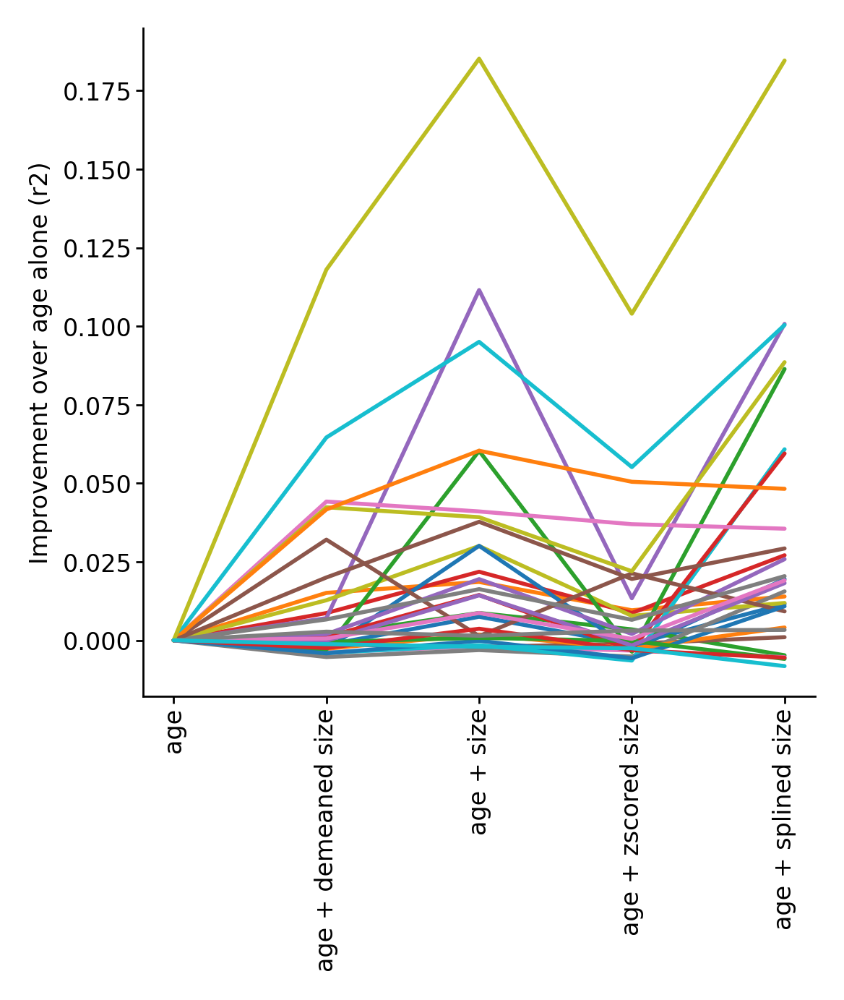

In [247]:
for idx, row in r2_df.iterrows():
    plt.plot(row - row.iloc[0])
plt.xticks(r2_df.columns, rotation=90);
plt.ylabel("Improvement over age alone (r2)")
sns.despine()

([0, 1, 2, 3, 4],
 [Text(0, 0, 'age'),
  Text(1, 0, 'age + demeaned size'),
  Text(2, 0, 'age + size'),
  Text(3, 0, 'age + zscored size'),
  Text(4, 0, 'age + splined size')])

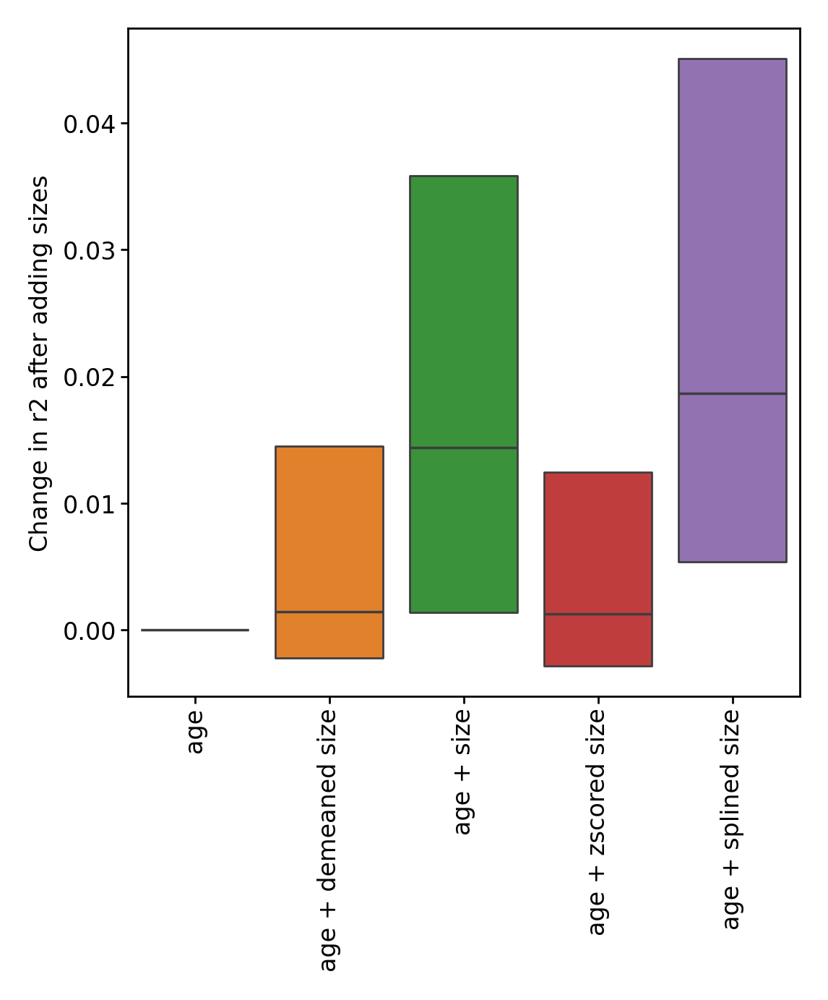

In [248]:
r2_df = r2_df - r2_df['age'].to_numpy()[:, None]

ax = sns.boxenplot(data=r2_df, showfliers=False, )
ax.set(ylabel="Change in r2 after adding sizes")
plt.xticks(rotation=90)

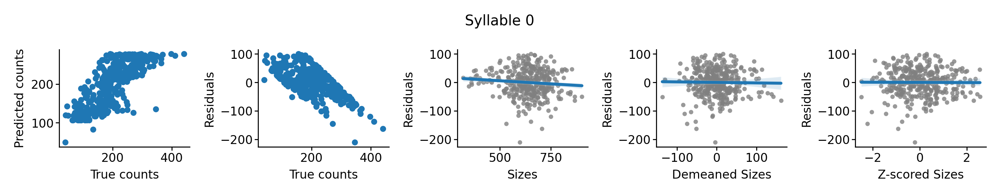

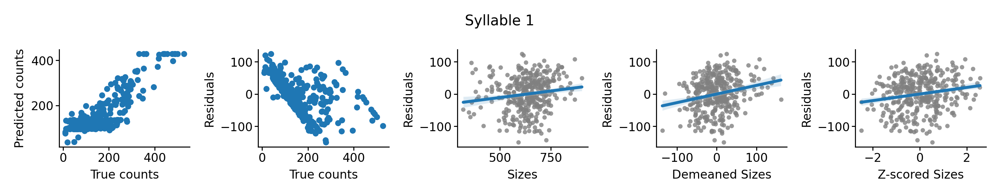

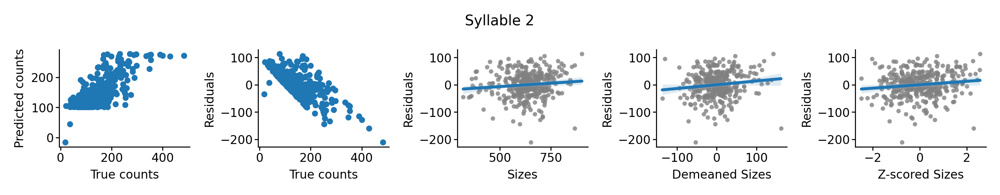

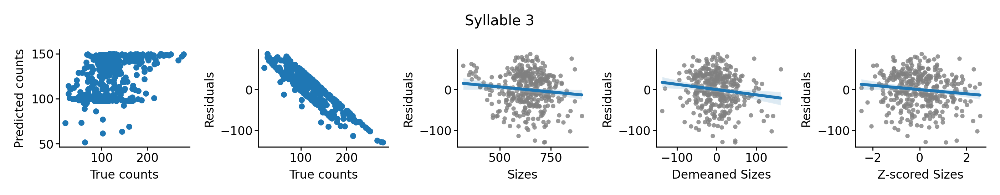

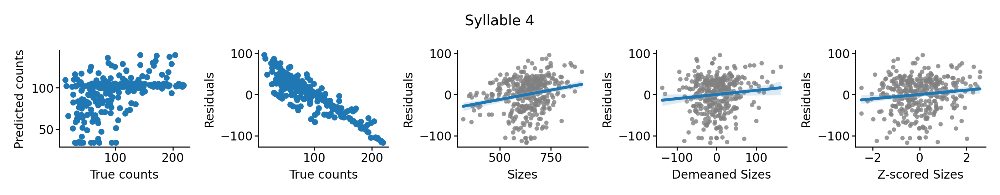

...

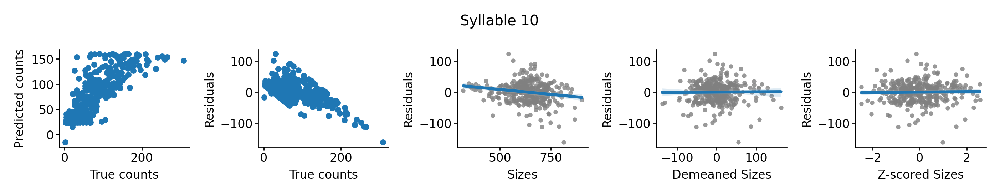

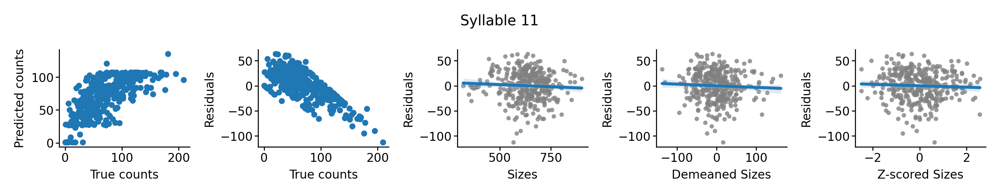

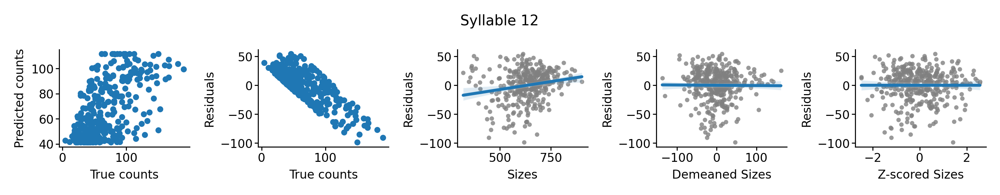

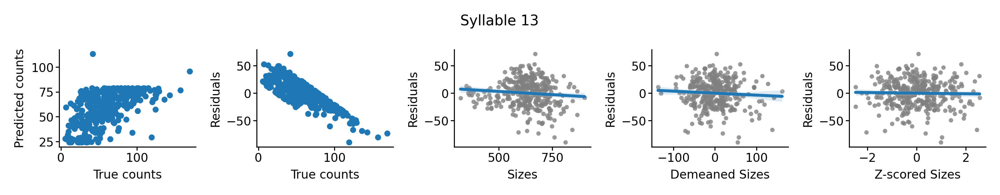

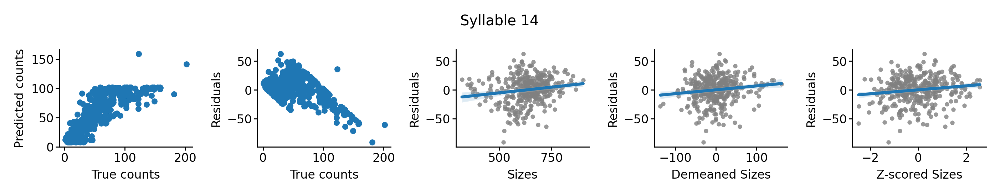

In [120]:
# loop through a set of syllables
for i in range(15):
    lr = LinearRegression(fit_intercept=False)
    lr.fit(weights, df[[i]])
    preds = lr.predict(weights).flatten()
    residuals = preds - df[i]

    fig, ax = plt.subplots(1, 5, figsize=(7, 1.3))
    ax[0].scatter(df[i], preds, s=5)
    ax[0].set(xlabel="True counts", ylabel="Predicted counts")

    ax[1].scatter(df[i], residuals, s=5)
    ax[1].set(xlabel="True counts", ylabel="Residuals")
    
    a = sns.regplot(x=sizes_col, y=residuals, ax=ax[2], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    # ax[2].scatter(sizes_col, residuals, s=5)
    a.set(xlabel="Sizes", ylabel="Residuals")
    
    a = sns.regplot(x=demeaned_sizes_col, y=residuals, ax=ax[3], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    a.set(xlabel="Demeaned Sizes", ylabel="Residuals")
    
    a = sns.regplot(x=zscore_sizes_col, y=residuals, ax=ax[4], n_boot=100, scatter_kws=dict(linewidths=0, s=5, color='gray'))
    a.set(xlabel="Z-scored Sizes", ylabel="Residuals")
    sns.despine()
    fig.suptitle(f"Syllable {i}")
    fig.tight_layout()

## Spline analysis with and without size

In [15]:
splines = BSplines(np.linspace(age.min(), age.max(), 1000), 5, 3, include_intercept=True)
weights = splines.transform(age)

size_splines = BSplines(np.linspace(sizes_col.min(), sizes_col.max(), 1000), 5, 3, include_intercept=True)
size_weights = size_splines.transform(sizes_col.to_numpy())

cv = ShuffleSplit(test_size=0.4, n_splits=5, random_state=0)

out = {}

lr = LinearRegression(fit_intercept=False)
scores = cross_validate(lr, weights, df, cv=cv, n_jobs=-1, return_estimator=True, )
out["age"] = scores

lr = LinearRegression(fit_intercept=False)
scores = cross_validate(lr, np.hstack([weights, demeaned_sizes_col.to_numpy()[:, None]]), df, cv=cv, n_jobs=-1, return_estimator=True)
out["age + demeaned size"] = scores

lr = LinearRegression(fit_intercept=False)
scores = cross_validate(lr, np.hstack([weights, sizes_col.to_numpy()[:, None]]), df, cv=cv, n_jobs=-1, return_estimator=True)
out["age + size"] = scores

lr = LinearRegression(fit_intercept=False)
scores = cross_validate(lr, np.hstack([weights, zscore_sizes_col.to_numpy()[:, None]]), df, cv=cv, n_jobs=-1, return_estimator=True)
out["age + zscored size"] = scores

lr = LinearRegression(fit_intercept=False)
scores = cross_validate(lr, np.hstack([weights, size_weights]), df, cv=cv, n_jobs=-1, return_estimator=True)
out["age + splined size"] = scores

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


In [316]:
np.mean(out['age']['test_score'])

0.14596347682553143

In [317]:
np.mean(out['age + size']['test_score'])

0.16242301144410037

In [318]:
np.mean(out['age + demeaned size']['test_score'])

0.1624911433838006

In [319]:
np.mean(out['age + zscored size']['test_score'])

0.1606127860244227

In [320]:
np.mean(out['age + splined size']['test_score'])

0.15418302798662875

In [306]:
out['age']['estimator'][0].coef_.shape

(94, 5)

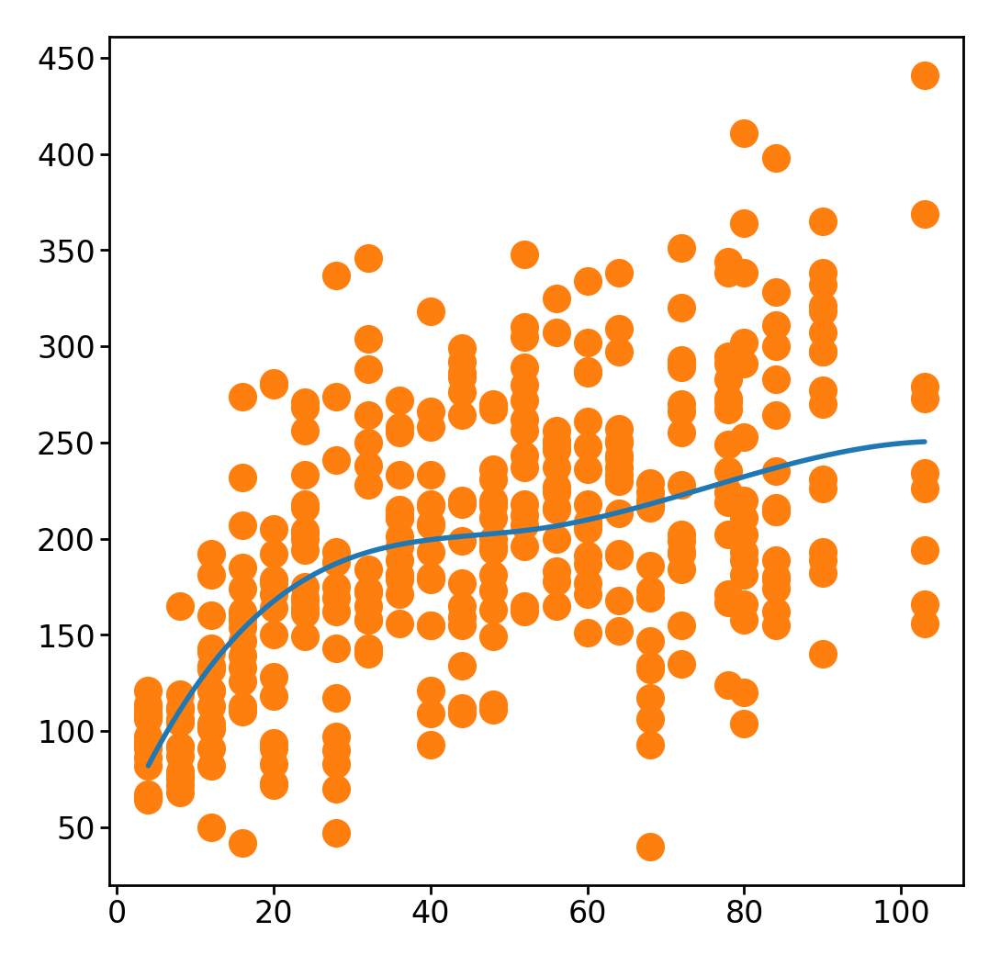

In [307]:
plt.scatter(age, df[0], c='C1')
plt.plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age']['estimator'][0].coef_[0])

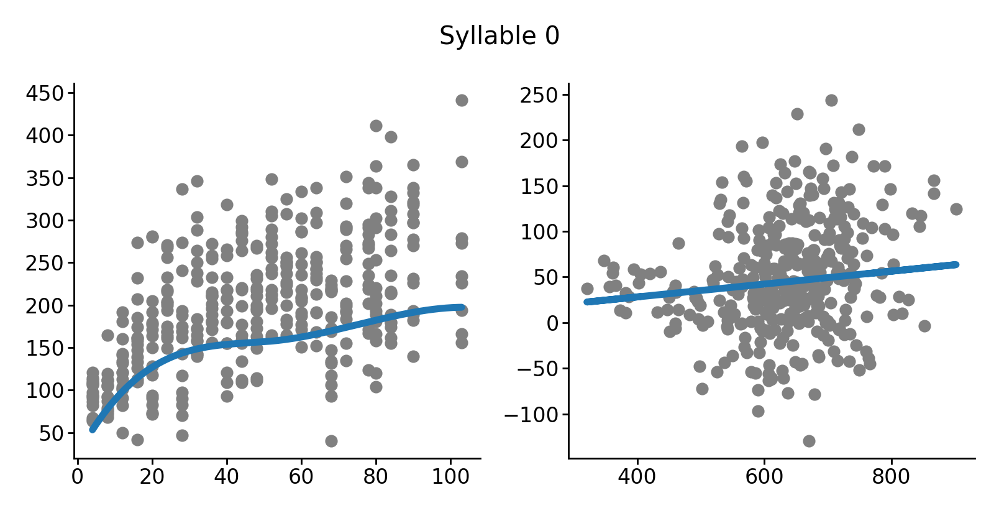

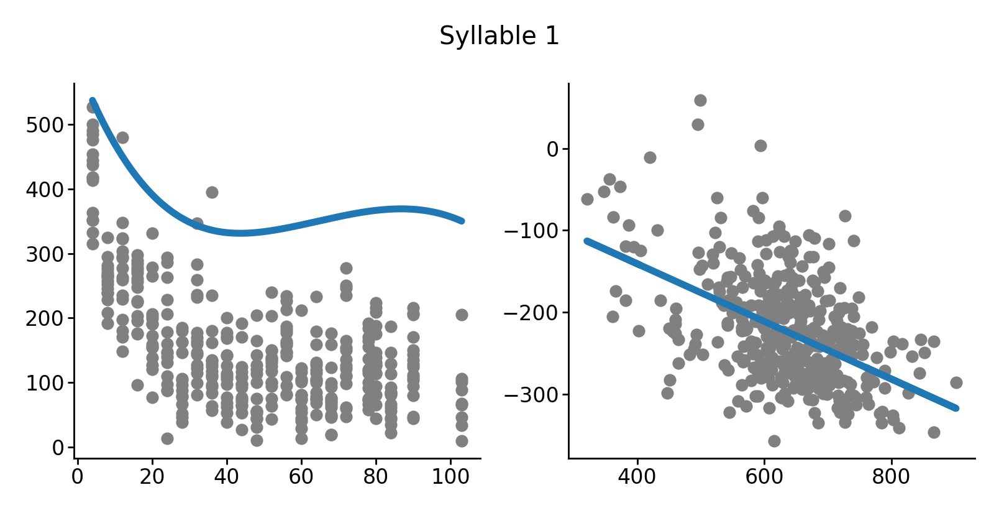

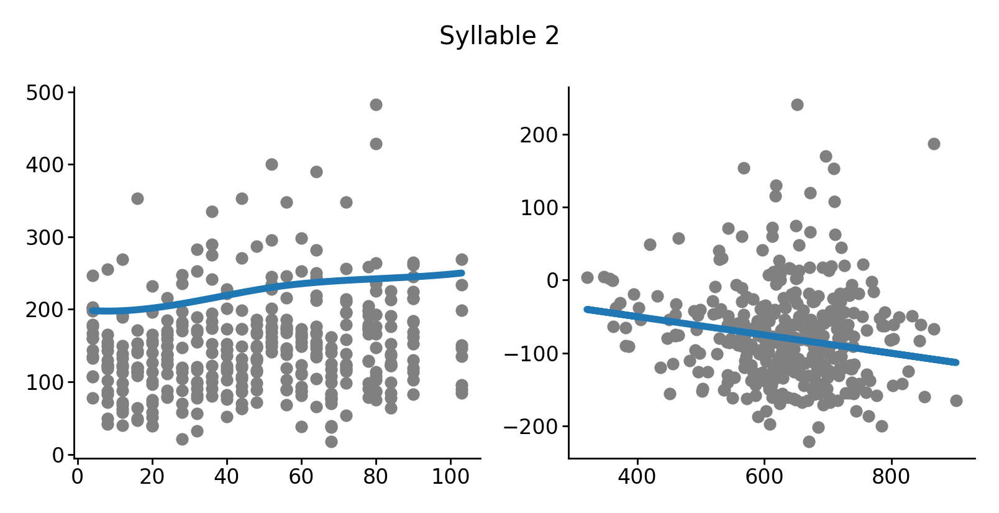

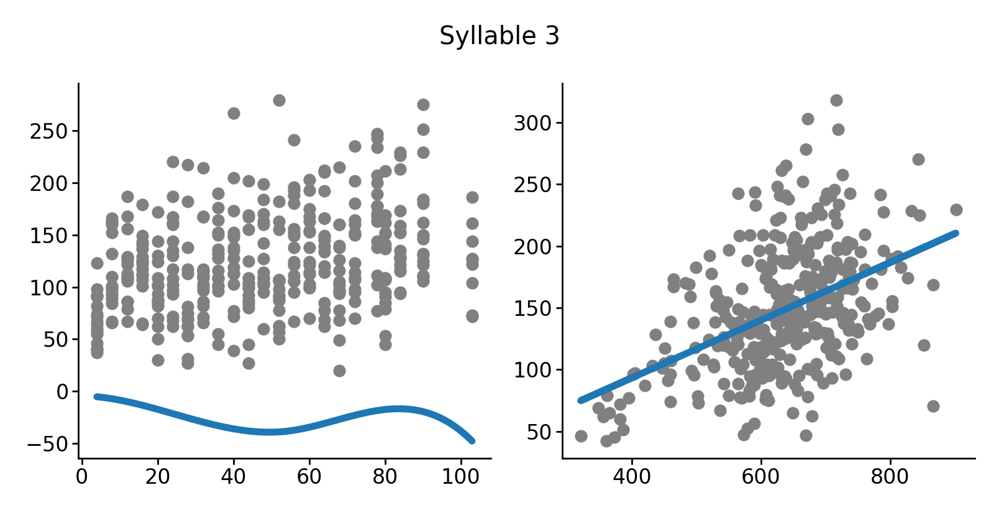

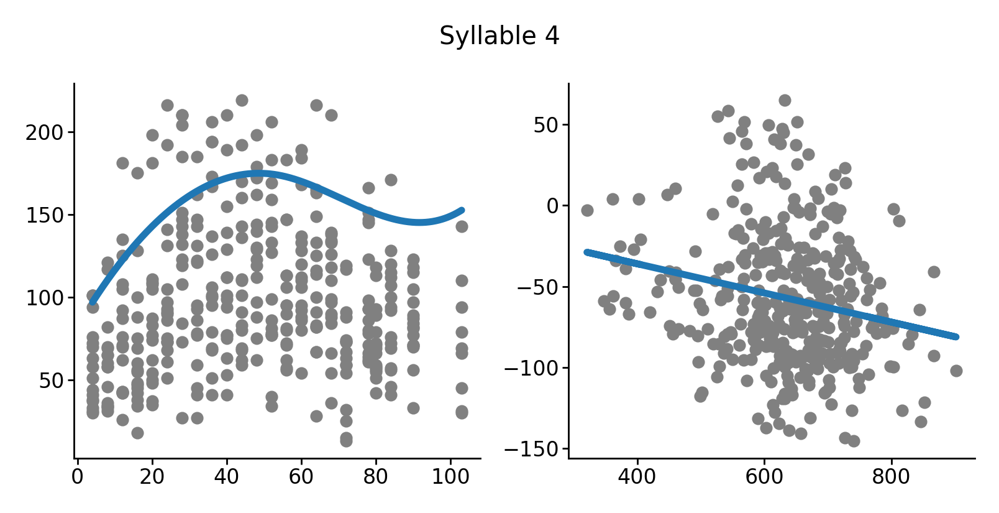

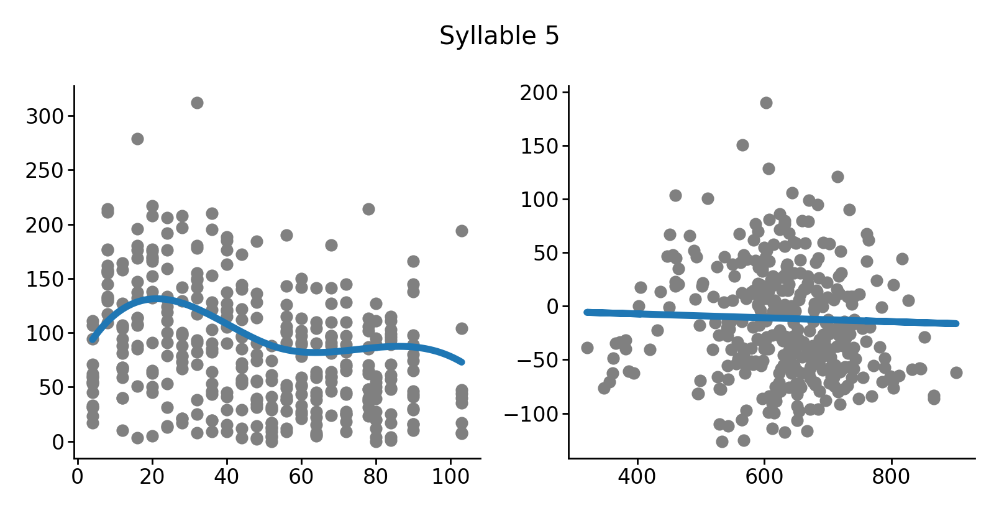

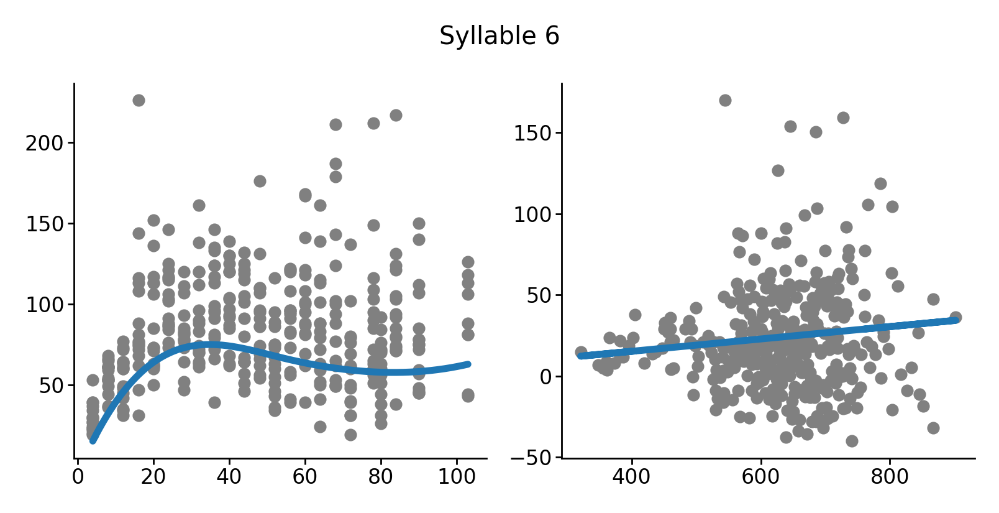

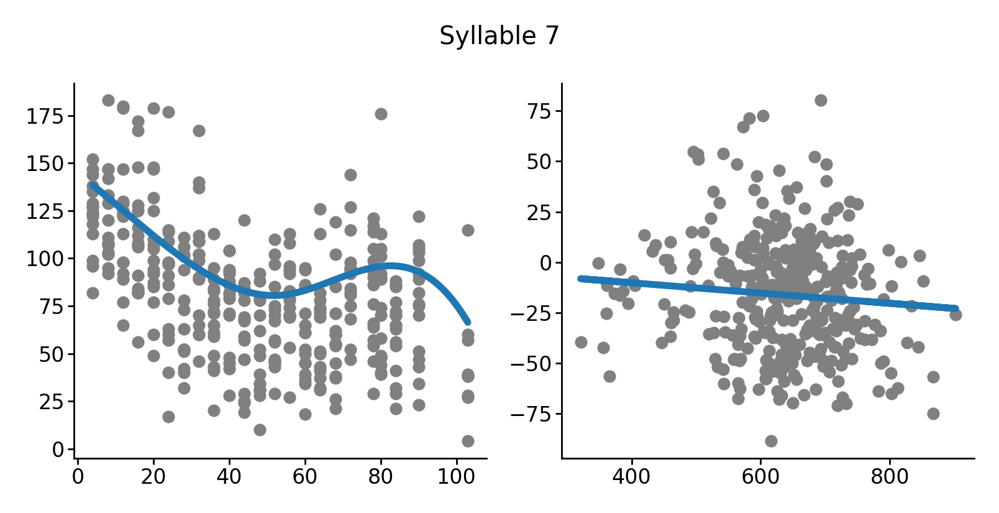

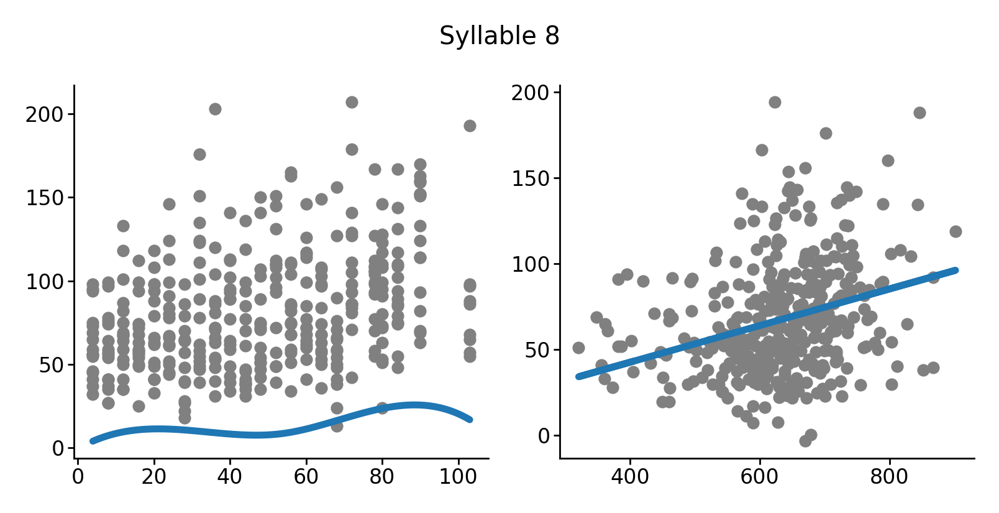

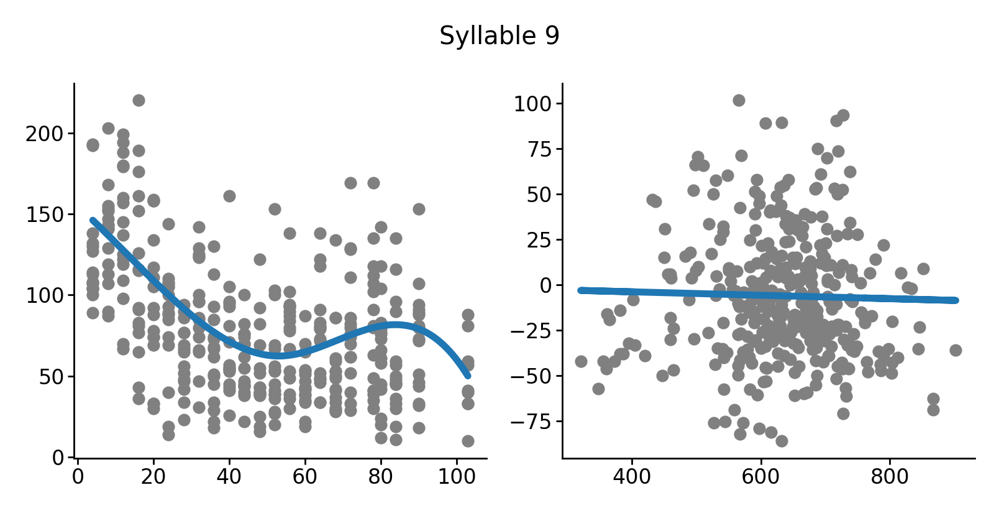

In [322]:
for i in range(10):
    fig, ax = plt.subplots(1, 2, figsize=(4, 2))
    ax[0].scatter(age, df[i], c='gray', s=8)
    ax[0].plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age + size']['estimator'][0].coef_[i, :5], lw=2)
    
    counts = df[i].to_numpy()
    counts = counts - (weights @ out['age + size']['estimator'][0].coef_[i, :5])
    ax[1].scatter(sizes_col, counts, c='gray', s=8)
    ax[1].plot(sizes_col, sizes_col * out['age + size']['estimator'][0].coef_[i, -1], lw=2)
    sns.despine()
    fig.suptitle(f"Syllable {i}")
    fig.tight_layout()

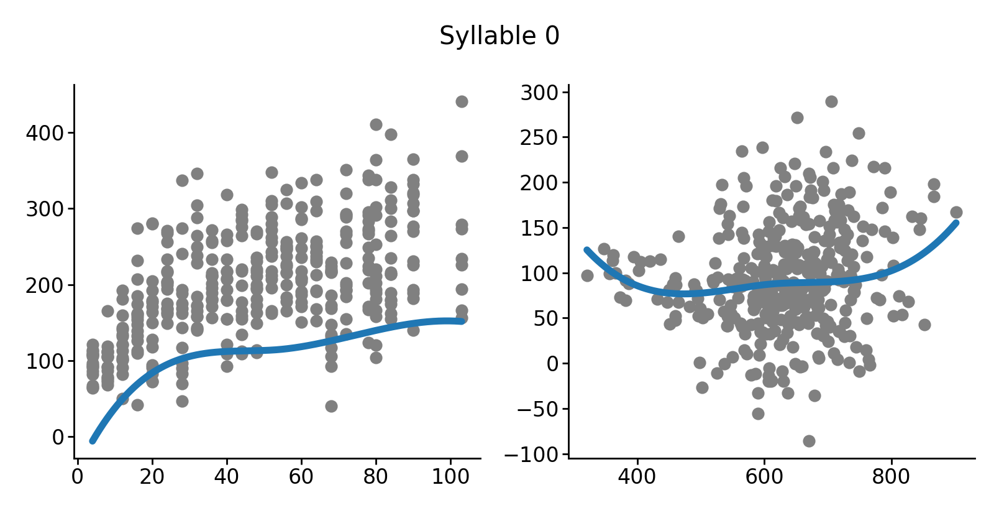

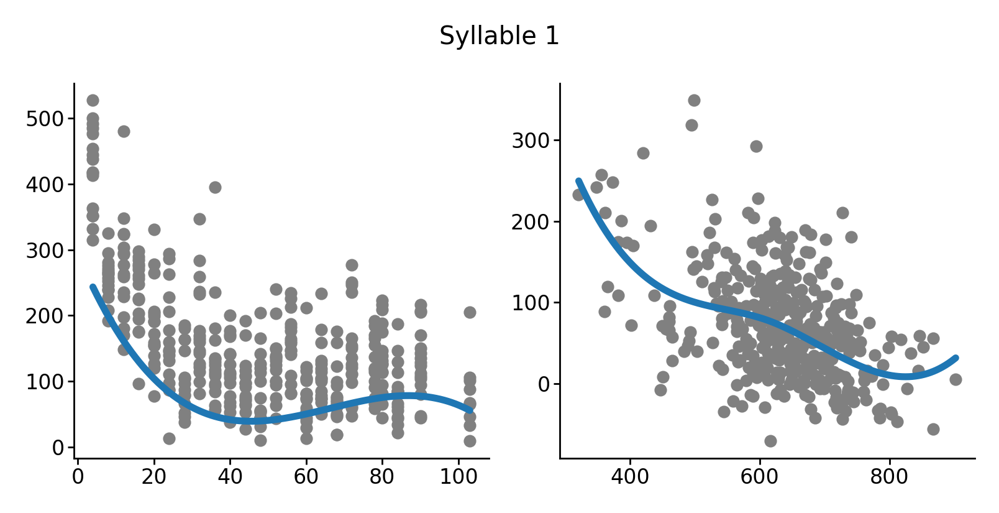

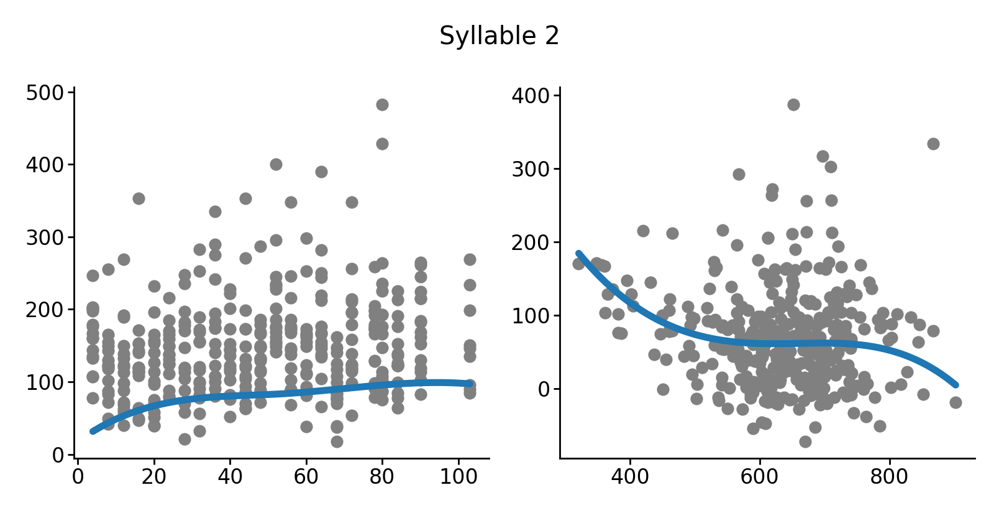

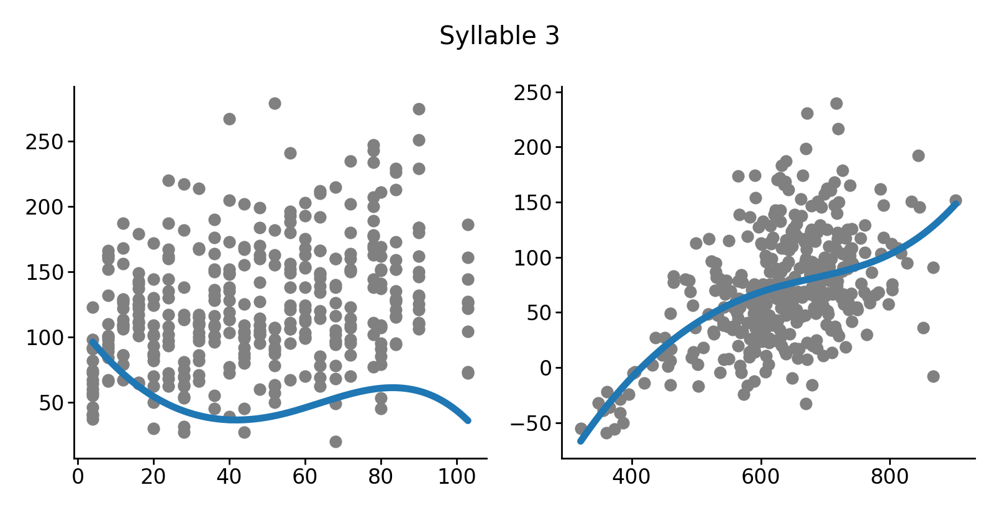

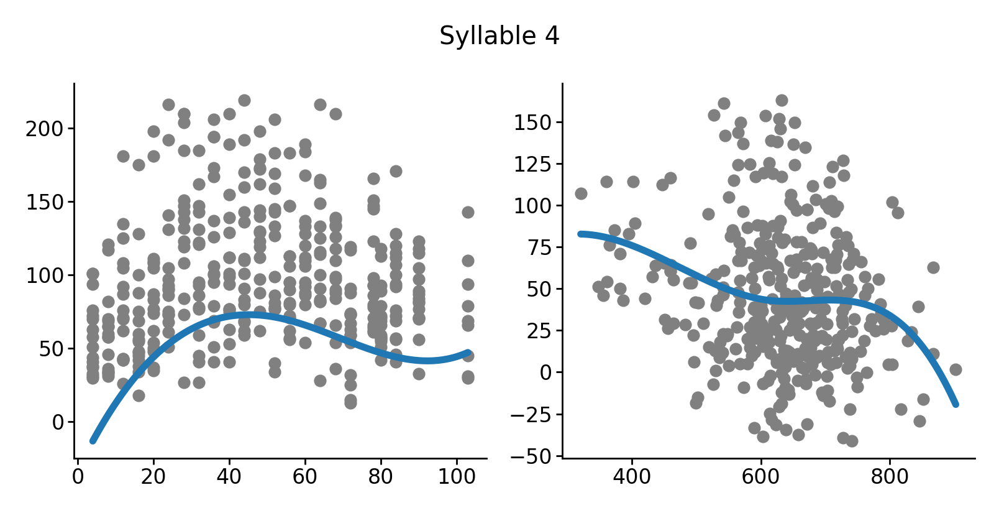

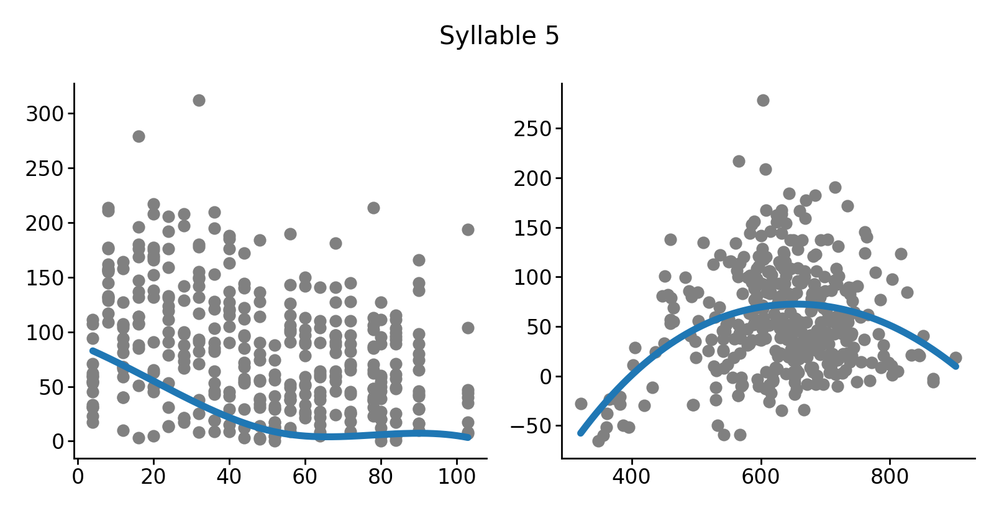

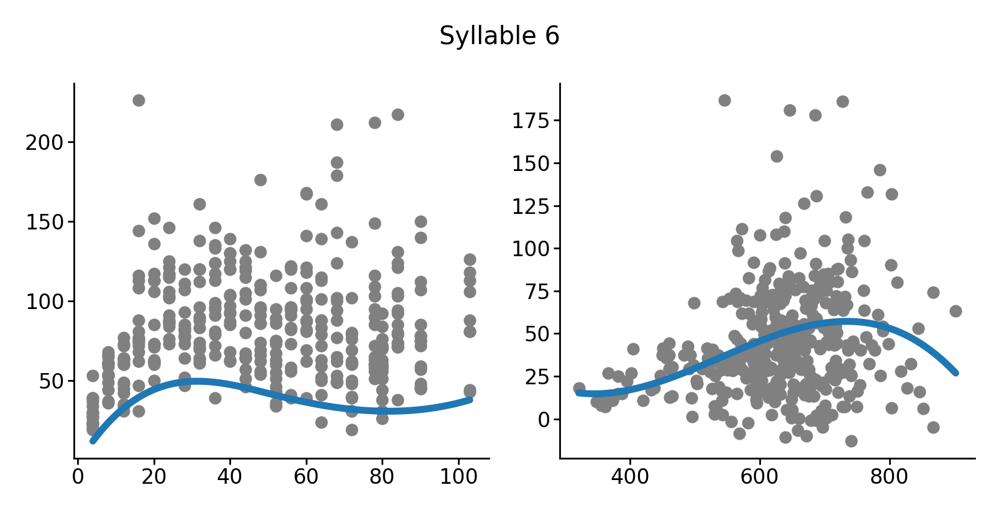

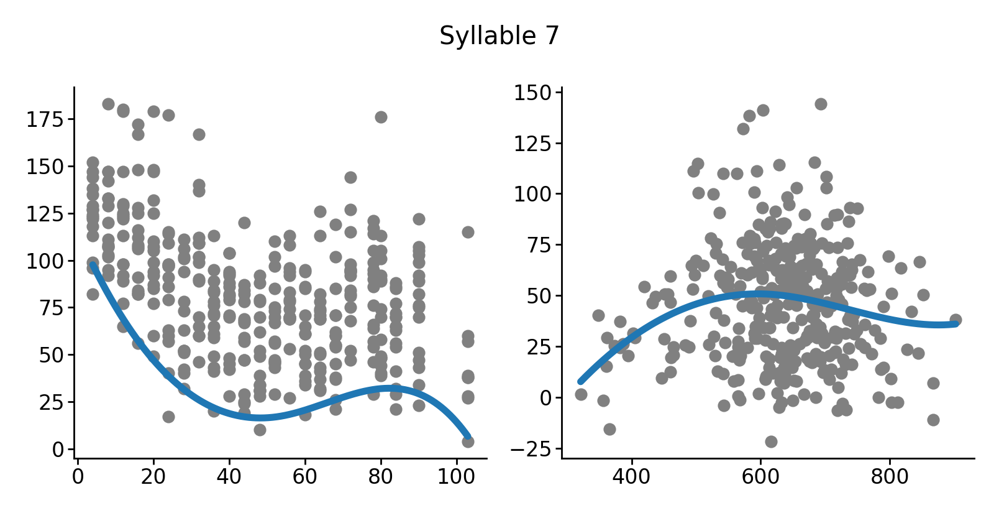

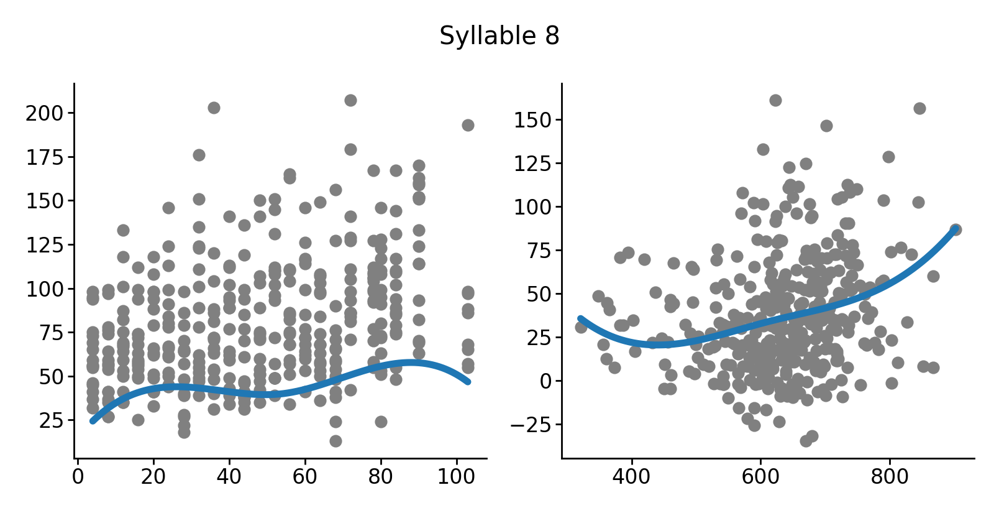

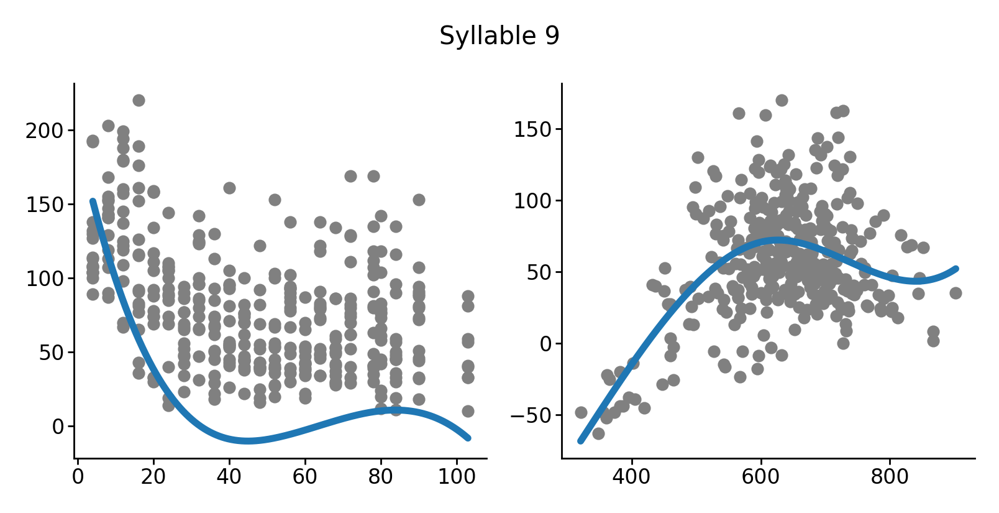

In [323]:
for i in range(10):
    fig, ax = plt.subplots(1, 2, figsize=(4, 2))
    ax[0].scatter(age, df[i], c='gray', s=8)
    ax[0].plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age + splined size']['estimator'][0].coef_[i, :5], lw=2)
    
    counts = df[i].to_numpy()
    counts = counts - (weights @ out['age + splined size']['estimator'][0].coef_[i, :5])
    ax[1].scatter(sizes_col, counts, c='gray', s=8)
    ax[1].plot(np.linspace(sizes_col.min(), sizes_col.max(), 1000), size_splines.basis @ out['age + splined size']['estimator'][0].coef_[i, 5:], lw=2)
    sns.despine()
    fig.suptitle(f"Syllable {i}")
    fig.tight_layout()

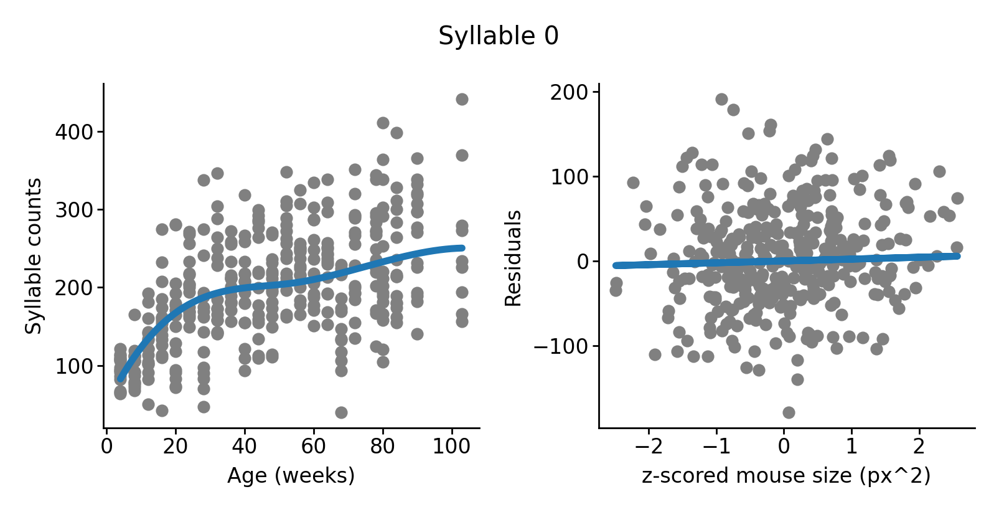

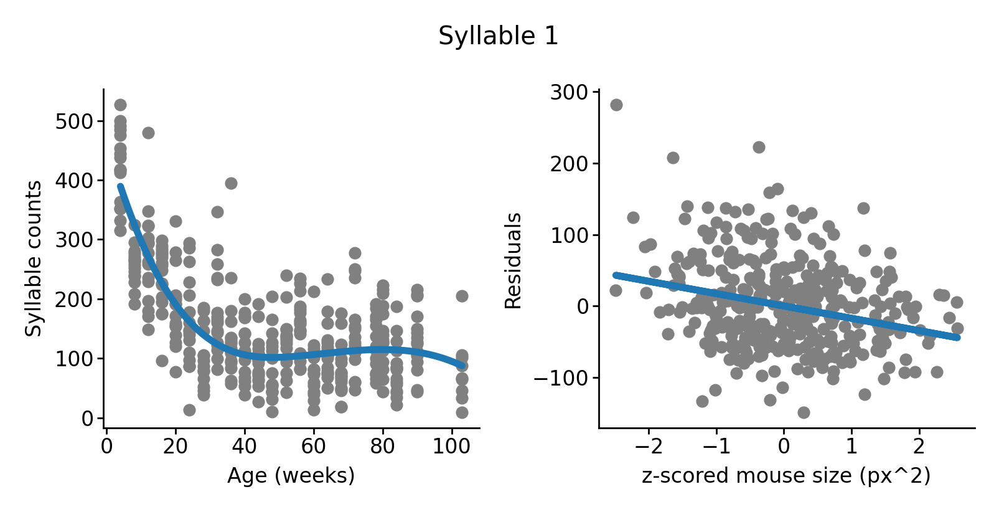

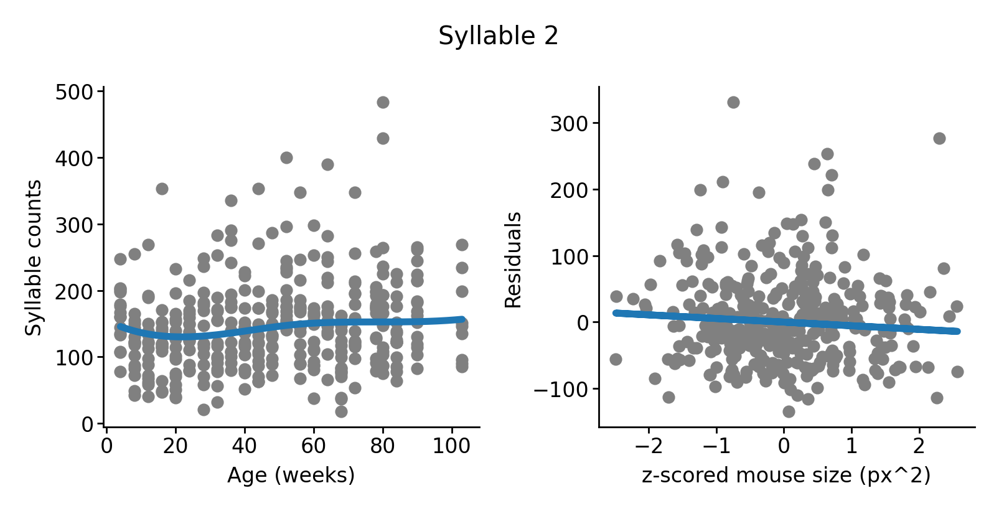

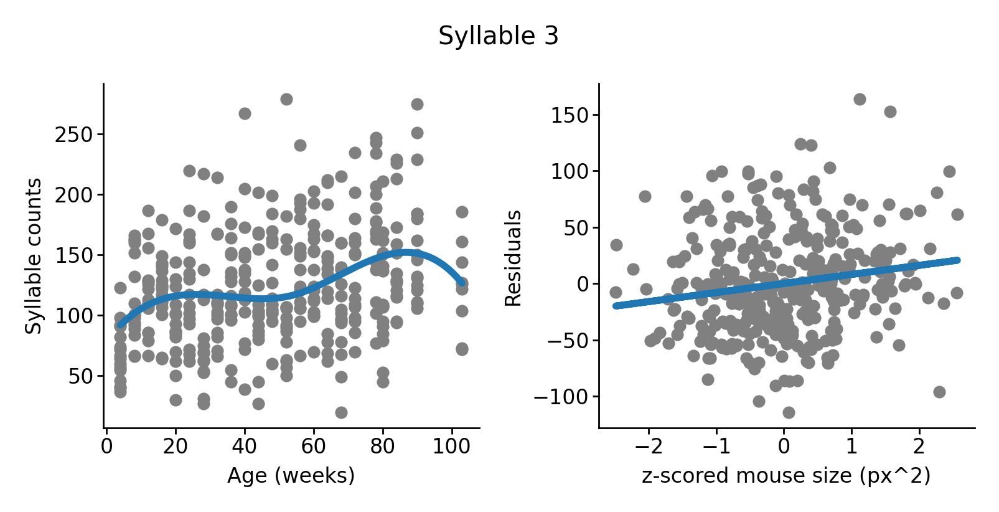

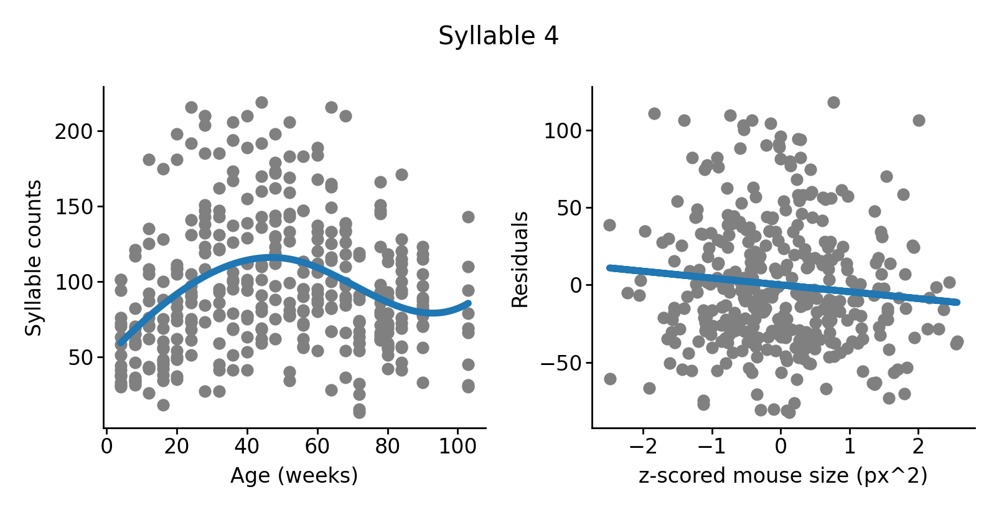

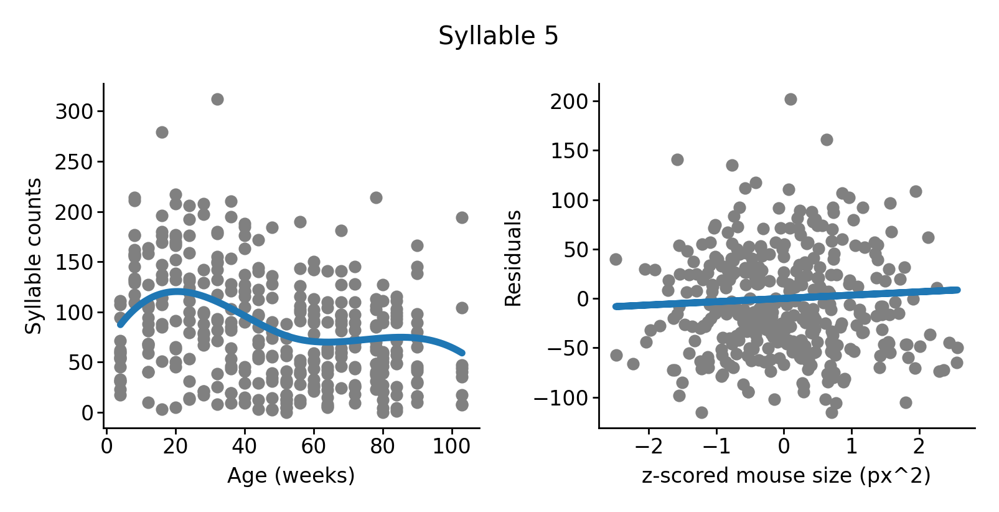

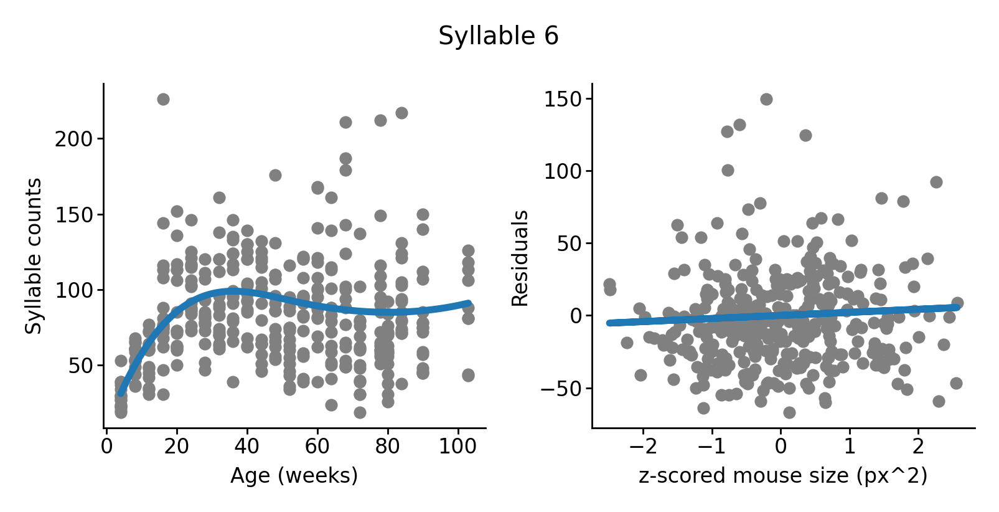

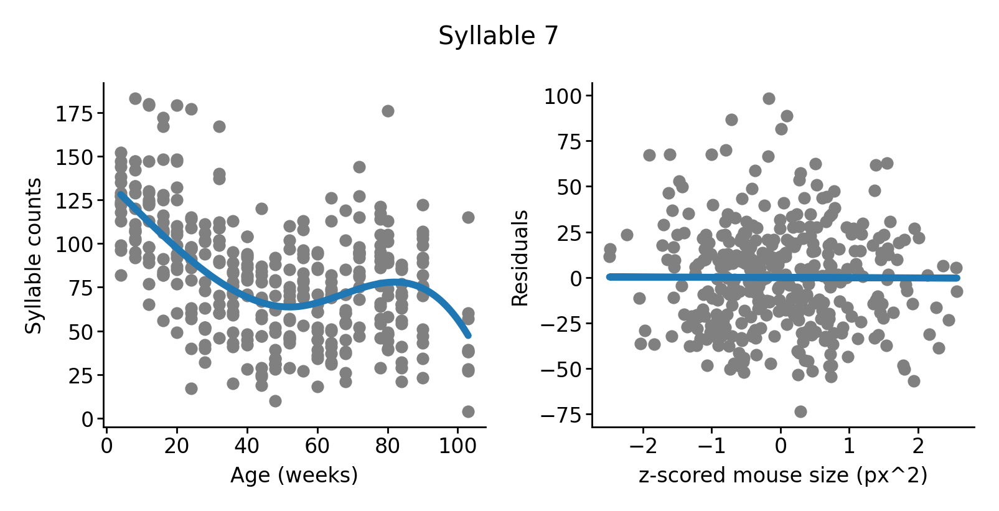

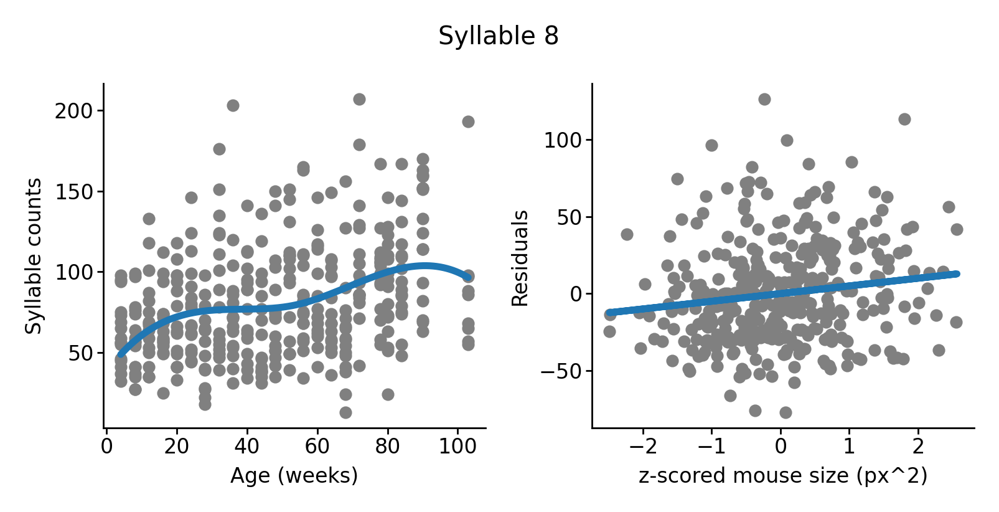

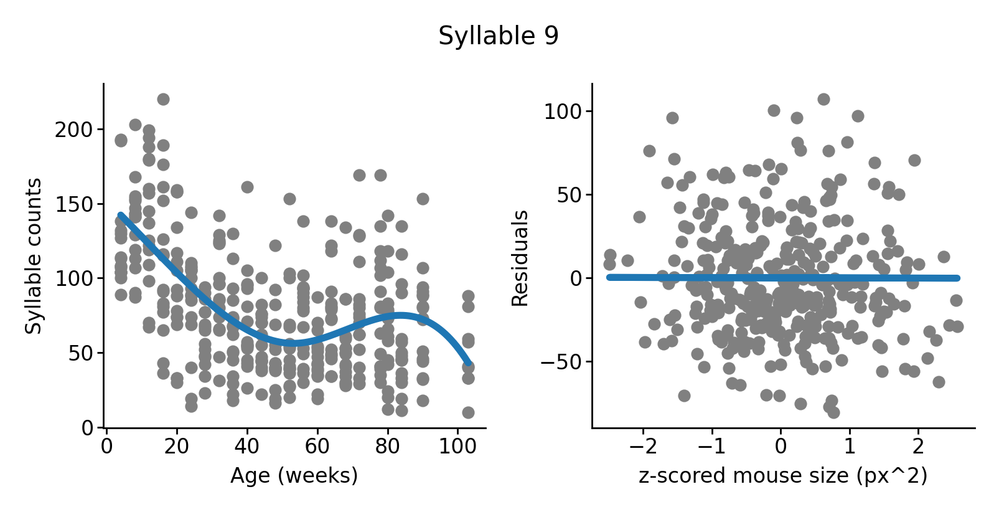

In [16]:
for i in range(10):
    fig, ax = plt.subplots(1, 2, figsize=(4, 2))
    ax[0].scatter(age, df[i], c='gray', s=8)
    ax[0].plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age + zscored size']['estimator'][0].coef_[i, :5], lw=2)
    ax[0].set(ylabel="Syllable counts", xlabel="Age (weeks)")

    counts = df[i].to_numpy()
    counts = counts - (weights @ out['age + zscored size']['estimator'][0].coef_[i, :5])
    ax[1].scatter(zscore_sizes_col, counts, c='gray', s=8)
    ax[1].plot(zscore_sizes_col, zscore_sizes_col * out['age + zscored size']['estimator'][0].coef_[i, -1], lw=2)
    ax[1].set(xlabel="z-scored mouse size (px^2)", ylabel="Residuals")
    sns.despine()
    fig.suptitle(f"Syllable {i}")
    fig.tight_layout()

In [ ]:
plt.scatter(age, df[0], c='C1')
plt.plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age + zscored size']['estimator'][0].coef_[0, :5])

counts = df[0].to_numpy()
counts = counts - (weights @ out['age + zscored size']['estimator'][0].coef_[0, :5])
plt.scatter(zscore_sizes_col, counts, c='C1')
plt.plot(zscore_sizes_col, zscore_sizes_col * out['age + zscored size']['estimator'][0].coef_[0, -1])

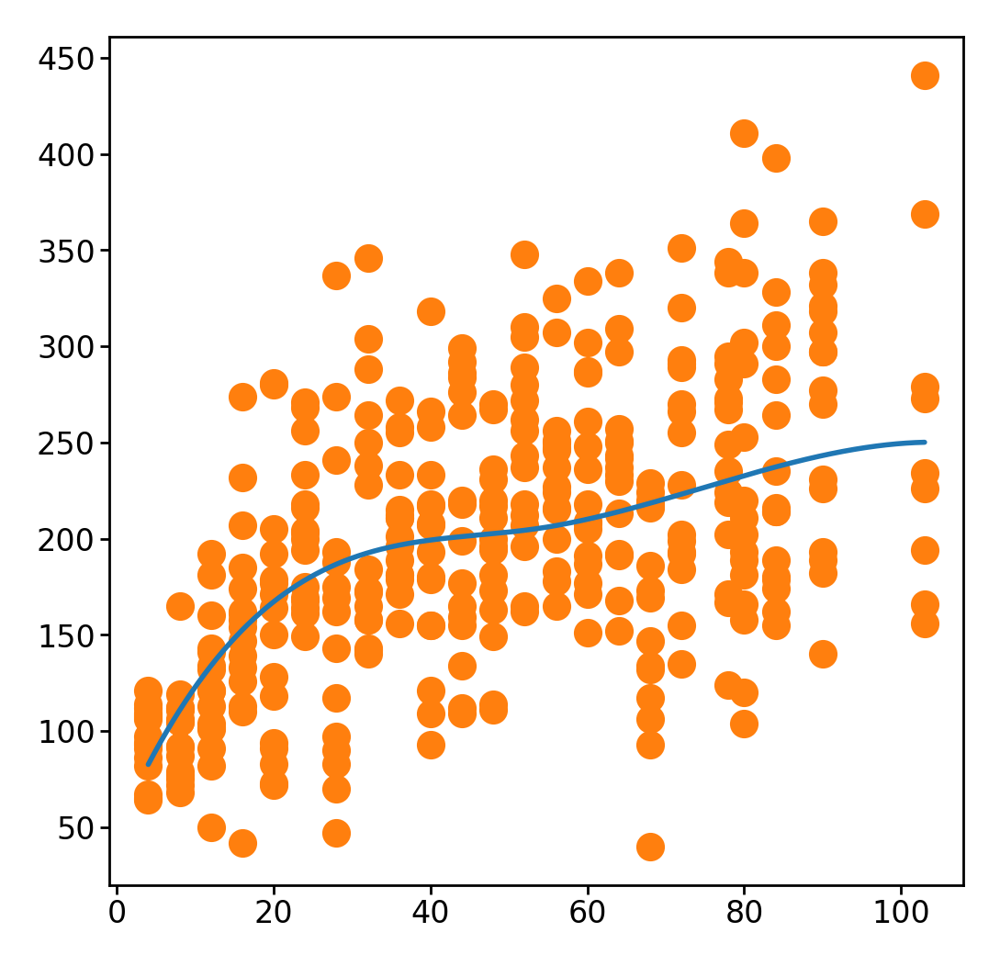

In [278]:
plt.scatter(age, df[0], c='C1')
plt.plot(np.linspace(age.min(), age.max(), 1000), splines.basis @ out['age + demeaned size']['estimator'][0].coef_[0, :5])

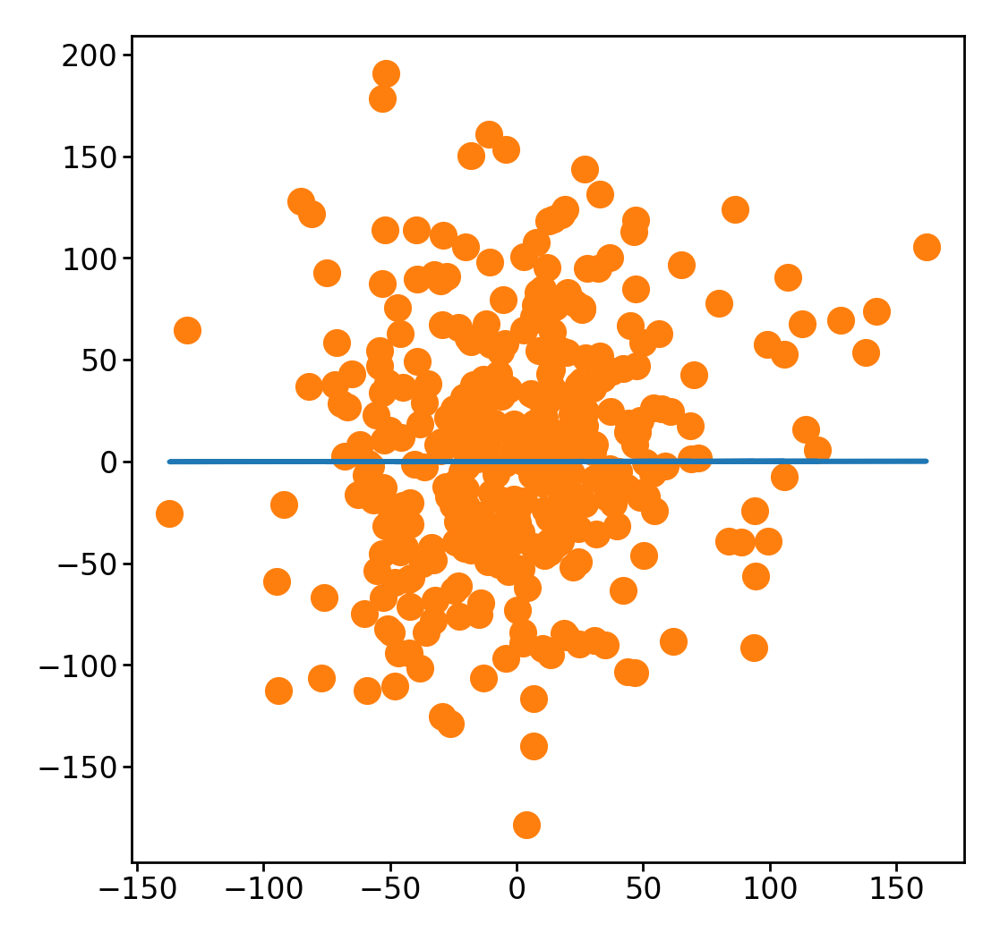

In [279]:
counts = df[0].to_numpy()
counts = counts - (weights @ out['age + demeaned size']['estimator'][0].coef_[0, :5])
plt.scatter(demeaned_sizes_col, counts, c='C1')
plt.plot(demeaned_sizes_col, zscore_sizes_col * out['age + demeaned size']['estimator'][0].coef_[0, -1])